# Normative modelling of brain structural deviations

This notebook implements a normative modelling approach to quantify structural brain deviations in individuals with spinal cord injury (SCI), with and without neuropathic pain. Using age- and sex-matched normative data, we estimate individual deviations (residuals) in cortical thickness and subcortical volumes.

The workflow includes:


This approach enables the identification of brain regions with structural alterations beyond expected age-related variation, supporting the study of neuroanatomical correlates of pain in SCI.


## Import libaries


In [1]:
import pandas as pd
from openpyxl.styles.builtins import title
from scipy.stats import spearmanr
import scipy.stats as stats
from scipy.stats import shapiro, iqr
from scipy.stats import mannwhitneyu
from scipy.stats import f_oneway, kruskal
from scipy.stats import ttest_ind
from scipy.stats import linregress
import statsmodels.formula.api as smf
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import os
import re
import scikit_posthocs as sp

### Loading data files

In [2]:
1. Structural Information and Subject inforamtion: The adjusted values extracted from Braincharts including patient information.
2. Normative values females:

SyntaxError: invalid syntax (1472625039.py, line 1)

In [2]:
## Structural Information and Subject inforamtion
file_path =  "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaptation/Rescaled Values/Exctracted_Adjusted_Values.xlsx"
df = pd.read_excel(file_path)
## Normative values females
normative_values_female= "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/normative_values_females.xlsx"
df_norm_females= pd.read_excel(normative_values_female)
## Normative values males
normative_values_male = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/normative_values_males.xlsx"
df_norm_males= pd.read_excel(normative_values_male)

### Renaming Volumes

In [3]:
# Define cohort order
cohort_order = [ "SCI_nNP", "SCI_P"]
cohort_labels = [ "SCI without neuropathic pain", "SCI with neuropathic pain"]
# Define cohort colors
cohort_palette = {
    "SCI_nNP": "#FFCC99",
    "SCI_P": "#99D8A0"
}
# Define cohort order
cohort_order = [ "SCI_nNP", "SCI_P"]
cohort_labels = [ "SCI without neuropathic pain", "SCI with neuropathic pain"]
# Define cohort colors
cohort_palette = {
    "SCI_nNP": "#FFCC99",
    "SCI_P": "#99D8A0"
}
# Define subcortical volume regions
subcortical_volumes = [
    "3rd-Ventricle",
    "4th-Ventricle",
    "Brain-Stem",
    "CSF",
    "EstimatedTotalIntraCranialVol",
    "Left-Accumbens-area",
    "Left-Amygdala",
    "Left-Caudate",
    "Left-Cerebellum-Cortex",
    "Left-Cerebellum-White-Matter",
    "Left-Hippocampus",
    "Left-Inf-Lat-Vent",
    "Left-Lateral-Ventricle",
    "Left-Pallidum",
    "Left-Putamen",
    "Left-VentralDC",
    "Left-choroid-plexus",
    "Left-vessel",
    "Right-Accumbens-area",
    "Right-Amygdala",
    "Right-Caudate",
    "Right-Cerebellum-Cortex",
    "Right-Cerebellum-White-Matter",
    "Right-Hippocampus",
    "Right-Inf-Lat-Vent",
    "Right-Lateral-Ventricle",
    "Right-Pallidum",
    "Right-Putamen",
    "Right-VentralDC",
    "Right-choroid-plexus",
    "Right-vessel",
    "SubCortGrayVol",
    "SupraTentorialVol",
    "SupraTentorialVolNotVent",
    "TotalGrayVol"
]


# Rename columns: Add "(Vol)" to subcortical volumes
df.rename(columns={col: f"{col} (Vol)" for col in subcortical_volumes}, inplace=True)


subcortical_volumes = [
    "3rd-Ventricle",
    "4th-Ventricle",
    "Brain-Stem",
    "CSF",
    "EstimatedTotalIntraCranialVol",
    "Left-Accumbens-area",
    "Left-Amygdala",
    "Left-Caudate",
    "Left-Cerebellum-Cortex",
    "Left-Cerebellum-White-Matter",
    "Left-Hippocampus",
    "Left-Inf-Lat-Vent",
    "Left-Lateral-Ventricle",
    "Left-Pallidum",
    "Left-Putamen",
    "Left-VentralDC",
    "Left-choroid-plexus",
    "Left-vessel",
    "Right-Accumbens-area",
    "Right-Amygdala",
    "Right-Caudate",
    "Right-Cerebellum-Cortex",
    "Right-Cerebellum-White-Matter",
    "Right-Hippocampus",
    "Right-Inf-Lat-Vent",
    "Right-Lateral-Ventricle",
    "Right-Pallidum",
    "Right-Putamen",
    "Right-VentralDC",
    "Right-choroid-plexus",
    "Right-vessel",
    "SubCortGrayVol",
    "SupraTentorialVol",
    "SupraTentorialVolNotVent",
    "TotalGrayVol"
]







In [4]:
# ✅ Smart flattening
def flatten_value(x):
    if isinstance(x, list):
        while isinstance(x, list) and len(x) > 0:
            x = x[0]
    if isinstance(x, str) and "[" in x:
        return x.strip("[]").strip()
    return x

# Apply to all columns
for col in df.columns:
    if df[col].apply(lambda x: isinstance(x, list) or (isinstance(x, str) and "[" in x)).any():
        print(f"✅ Cleaning column: {col}")
        df[col] = df[col].apply(flatten_value)

# Also make sure numerical values are truly numeric
df = df.apply(pd.to_numeric, errors="ignore")
df["Sex"] = df["Sex"].astype(str).str.strip()
df["Cohort"] = df["Cohort"].astype(str).str.strip()
df_females = df[df["Sex"] == "Female"].copy()
df_males =df[df["Sex"] == "Male"].copy()

df_norm_females.rename(columns={"age": "Age"}, inplace=True)
df_norm_males.rename(columns={"age": "Age"}, inplace=True)  # optional if used later
# Ensure all plotting uses the same age column
age_col = "Age"

✅ Cleaning column: 3rd-Ventricle (Vol)
✅ Cleaning column: 4th-Ventricle (Vol)
✅ Cleaning column: Brain-Stem (Vol)
✅ Cleaning column: CSF (Vol)
✅ Cleaning column: EstimatedTotalIntraCranialVol (Vol)
✅ Cleaning column: Left-Accumbens-area (Vol)
✅ Cleaning column: Left-Amygdala (Vol)
✅ Cleaning column: Left-Caudate (Vol)
✅ Cleaning column: Left-Cerebellum-Cortex (Vol)
✅ Cleaning column: Left-Cerebellum-White-Matter (Vol)
✅ Cleaning column: Left-Hippocampus (Vol)
✅ Cleaning column: Left-Inf-Lat-Vent (Vol)
✅ Cleaning column: Left-Lateral-Ventricle (Vol)
✅ Cleaning column: Left-Pallidum (Vol)
✅ Cleaning column: Left-Putamen (Vol)
✅ Cleaning column: Left-VentralDC (Vol)
✅ Cleaning column: Left-choroid-plexus (Vol)
✅ Cleaning column: Left-vessel (Vol)
✅ Cleaning column: Right-Accumbens-area (Vol)
✅ Cleaning column: Right-Amygdala (Vol)
✅ Cleaning column: Right-Caudate (Vol)
✅ Cleaning column: Right-Cerebellum-Cortex (Vol)
✅ Cleaning column: Right-Cerebellum-White-Matter (Vol)
✅ Cleaning column

### Matching structural data for normative plot

In [5]:
# Define cohort colors and labels
cohort_order = [ "SCI_nNP", "SCI_P"]
cohort_labels = [ "SCI without neuropathic pain", "SCI with neuropathic pain"]
cohort_colors = { "SCI_nNP": "green", "SCI_P": "orange"}

# Function to clean and match column names: Standardization of Columns names to make sure that names from PyBrain and the Normative dataset match
def clean_name(name):
    """Standardizes column names for easier matching."""
    return (
        name.lower()
        .replace("_and_", "&")
        .replace("_thickness", "")
        .replace("_median", "")
        .replace("_pr_int_25_lower", "")
        .replace("_pr_int_25_upper", "")
        .replace("_pr_int_95_lower", "")
        .replace("_pr_int_95_upper", "")
        .replace("_pr_int_99_lower", "")
        .replace("_pr_int_99_upper", "")
        .replace(" (vol)", "")
        .replace("-proper", "") #Removes "-proper" so that "Left-Thalamus-Proper" matches "Left-Thalamus".
        .strip()
    )

# Force matching to use _median values instead of _pr_int_99_upper: Creating a dictorary to link columns between the PyBrain dataset and the normative dataset (The loop checks if cleaned version of PyBrain column matches the cleaned version of the normative dataset column
region_mapping = {}
for col in df:  # PyBrain columns
    for norm_col in df_norm_females.columns:  # Normative dataset columns
        if clean_name(col) == clean_name(norm_col.replace("_median", "")):  # Ensure median mapping
            if "_median" in norm_col: #Only matches the median value
                region_mapping[col] = norm_col

## Print matched and unmatched values: Counts the number of matched regions and also these which are unmatched
# Initialize counters
match_count = 0
unmatched_columns = []  # List to store unmatched PyBrain columns

print("\n Corrected Region Mapping (Now Matching Medians):")
for struct_col, norm_col in region_mapping.items():
    print(f"  {struct_col} → {norm_col}")
    match_count += 1  # Increment for each successful match

# Identify unmatched PyBrain columns
all_structural_columns = [col for col in df.columns if "thickness" in col or "(Vol)" in col]
unmatched_columns = [col for col in all_structural_columns if col not in region_mapping]

# Print summary
print(f"\n Total matched regions: {match_count} / {len(all_structural_columns)} (PyBrain Structural Columns)")

# Print unmatched regions
if unmatched_columns:
    print("\n The following PyBrain structural columns were NOT matched:")
    for col in unmatched_columns:
        print(f" {col}")
else:
    print("\n All PyBrain structural columns were successfully matched!")


# Filter only female subjects
df_females = df[df["Sex"] == "Female"].copy()



# Generate plots for each matched brain region --> with the for loop it goes through each matched brain region and generates a plot
## Dynamically contructing the column names for the different percentiles (as we only stored the median match in region mapping before)
for struct_col, norm_col in region_mapping.items():
    if norm_col in df_norm_females.columns and struct_col in df.columns:
        plt.figure(figsize=(10, 6))
        sns.set(style="whitegrid")

        # Define column names for percentiles

        p25_lower = f"{norm_col.replace('_median', '_pr_int_25_lower')}"
        p25_upper = f"{norm_col.replace('_median', '_pr_int_25_upper')}"
        p95_lower = f"{norm_col.replace('_median', '_pr_int_95_lower')}"
        p95_upper = f"{norm_col.replace('_median', '_pr_int_95_upper')}"
        p99_lower = f"{norm_col.replace('_median', '_pr_int_99_lower')}"
        p99_upper = f"{norm_col.replace('_median', '_pr_int_99_upper')}"

        # Ensure all necessary columns exist
        missing_cols = [col for col in [p25_lower, p25_upper, p95_lower, p95_upper, p99_lower, p99_upper] if col not in df_norm_females.columns]
        if missing_cols:
            print(f"⚠ Skipping {struct_col}: Missing columns {missing_cols}")
            continue  # Skip this region

        # Plot percentiles
        plt.fill_between(df_norm_females[age_col], df_norm_females[p25_lower], df_norm_females[p25_upper], color="red", alpha=0.2)
        plt.fill_between(df_norm_females[age_col], df_norm_females[p95_lower], df_norm_females[p95_upper], color="red", alpha=0.1)
        plt.fill_between(df_norm_females[age_col], df_norm_females[p99_lower], df_norm_females[p99_upper], color="red", alpha=0.05)

        # Plot the median line
        plt.plot(df_norm_females[age_col], df_norm_females[norm_col], color="red", linewidth=2)

        # Plot structural data points (real subject values)
        # Plot structural data points with cohort-based colors
        valid_points = df_females[[struct_col, "Age", "Cohort"]].dropna()
        if not valid_points.empty:
            for cohort in cohort_order:
                cohort_data = valid_points[valid_points["Cohort"] == cohort]
                if not cohort_data.empty:

                    plt.scatter(
                        cohort_data["Age"], cohort_data[struct_col],
                        color=cohort_colors[cohort], s=20, alpha=0.7,
                        label=cohort_labels[cohort_order.index(cohort)]
                    )
        else:
            print(f" No valid data points for {struct_col} in dataset.")

        # Labels and title
        plt.xlim(0, 100)
        plt.xlabel("Age", fontsize=14, fontweight="bold")
        plt.ylabel(struct_col.replace("_", " "), fontsize=14, fontweight="bold")
        plt.title(f"{struct_col.replace('_', ' ')} (Females)", fontweight="bold", fontsize=16)
        plt.legend(title='Cohorts')
        plt.close()




 Corrected Region Mapping (Now Matching Medians):
  3rd-Ventricle (Vol) → 3rd-Ventricle_median
  4th-Ventricle (Vol) → 4th-Ventricle_median
  Brain-Stem (Vol) → Brain-Stem_median
  CSF (Vol) → CSF_median
  EstimatedTotalIntraCranialVol (Vol) → EstimatedTotalIntraCranialVol_median
  Left-Accumbens-area (Vol) → Left-Accumbens-area_median
  Left-Amygdala (Vol) → Left-Amygdala_median
  Left-Caudate (Vol) → Left-Caudate_median
  Left-Cerebellum-Cortex (Vol) → Left-Cerebellum-Cortex_median
  Left-Cerebellum-White-Matter (Vol) → Left-Cerebellum-White-Matter_median
  Left-Hippocampus (Vol) → Left-Hippocampus_median
  Left-Inf-Lat-Vent (Vol) → Left-Inf-Lat-Vent_median
  Left-Lateral-Ventricle (Vol) → Left-Lateral-Ventricle_median
  Left-Pallidum (Vol) → Left-Pallidum_median
  Left-Putamen (Vol) → Left-Putamen_median
  Left-VentralDC (Vol) → Left-VentralDC_median
  Left-choroid-plexus (Vol) → Left-choroid-plexus_median
  Left-vessel (Vol) → Left-vessel_median
  Right-Accumbens-area (Vol) → Righ

In [6]:
def round_to_nearest_half(age):
    """Rounds age down to the nearest .0 or .5"""
    return np.floor(age * 2) / 2

# Apply the function to round ages
df_females["Rounded_Age"] = df_females["Age"].apply(round_to_nearest_half)

# Dictionary to store residuals for each structure
residuals = {}

for struct_col, norm_col in region_mapping.items():
    if norm_col in df_norm_females.columns and struct_col in df.columns:
        # Interpolate median values from the normative dataset
        predicted_values = np.interp(df_females["Rounded_Age"], df_norm_females["Age"], df_norm_females[norm_col])

        # Compute residuals (Observed - Predicted)
        df_females[f"Residual_{struct_col}"] = df_females[struct_col] - predicted_values
        residuals[struct_col] = df_females[f"Residual_{struct_col}"]
# Define cohort colors and labels
cohort_order = ["SCI_nNP", "SCI_P"]
cohort_labels = [ "SCI without neuropathic pain", "SCI with neuropathic pain"]
cohort_colors = { "SCI_nNP": "green", "SCI_P": "orange"}

for struct_col in residuals:
    plt.figure(figsize=(10, 6))
    sns.set(style="whitegrid")

    # Extract residuals and valid data points
    valid_points = df_females[[f"Residual_{struct_col}", "Rounded_Age", "Cohort"]].dropna()

    # Plot residuals colored by cohort
    for cohort in cohort_order:
        cohort_data = valid_points[valid_points["Cohort"] == cohort]
        if not cohort_data.empty:
            plt.scatter(
                cohort_data["Rounded_Age"], cohort_data[f"Residual_{struct_col}"],
                color=cohort_colors[cohort], s=20, alpha=0.7,
                label=cohort_labels[cohort_order.index(cohort)]
            )

    # Plot horizontal reference line at 0 residual
    plt.axhline(y=0, color="black", linestyle="--", linewidth=1)

    # Labels and title
    plt.xlabel("Age (rounded to nearest 0.5)", fontsize=14, fontweight="bold")
    plt.ylabel(f"Residuals ({struct_col.replace('_', ' ')})", fontsize=14, fontweight="bold")
    plt.title(f"Residuals for {struct_col.replace('_', ' ')}", fontweight="bold", fontsize=16)
    plt.legend(title="Cohort")

    plt.close()


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/71245800.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_females[f"Residual_{struct_col}"] = df_females[struct_col] - predicted_values
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/71245800.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_females[f"Residual_{struct_col}"] = df_females[struct_col] - predicted_values
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/71245800.py:17: PerformanceWarning: DataFrame is highly 

### Plot of Regions with highest effect size


# Create a dictionary to store statistics
stats_dict = {
    "Region": [],
    "Cohort": [],
    "Mean_Residual": [],
    "Median_Residual": [],
    "Std_Residual": [],
    "IQR_Residual": [],
    "Shapiro_p": [],
    "BreuschPagan_p": []
}

# Iterate over all brain regions
for struct_col in residuals:
    residual_col = f"Residual_{struct_col}"

    if residual_col not in df_females.columns:
        print(f"⚠ Skipping {struct_col} (Residuals not found)")
        continue

    # Iterate over each cohort
    for cohort in cohort_order:
        cohort_data = df_females[df_females["Cohort"] == cohort][residual_col].dropna()

        if cohort_data.empty:
            print(f"⚠ No residuals for {struct_col} in cohort {cohort}")
            continue

        # Compute statistics
        mean_res = np.mean(cohort_data)
        median_res = np.median(cohort_data)
        std_res = np.std(cohort_data)
        iqr_res = iqr(cohort_data)

        # Normality test (Shapiro-Wilk)
        shapiro_p = shapiro(cohort_data)[1] if len(cohort_data) > 3 else np.nan

        # Homoscedasticity test (Breusch-Pagan)
        X = sm.add_constant(df_females.loc[df_females["Cohort"] == cohort, "Rounded_Age"])
        y = cohort_data
        _, bp_p, _, _ = het_breuschpagan(y, X) if len(cohort_data) > 3 else (np.nan, np.nan, np.nan, np.nan)

        # Append to dictionary
        stats_dict["Region"].append(struct_col)
        stats_dict["Cohort"].append(cohort)
        stats_dict["Mean_Residual"].append(mean_res)
        stats_dict["Median_Residual"].append(median_res)
        stats_dict["Std_Residual"].append(std_res)
        stats_dict["IQR_Residual"].append(iqr_res)
        stats_dict["Shapiro_p"].append(shapiro_p)
        stats_dict["BreuschPagan_p"].append(bp_p)

# Convert dictionary to DataFrame
stats_df = pd.DataFrame(stats_dict)

# Save as Excel file
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residual_Statistics_females_SCI.xlsx"
stats_df.to_excel(output_path, index=False)
print(f"✅ Residual statistics saved to {output_path}")



results = []

for struct_col in residuals:
    residual_col = f"Residual_{struct_col}"

    # Extract residuals for each cohort
    SCI_nNP = df_females[df_females["Cohort"] == "SCI_nNP"][residual_col].dropna()
    SCI_P = df_females[df_females["Cohort"] == "SCI_P"][residual_col].dropna()

    # Check that all groups have data
    if len(SCI_nNP) > 2 and len(SCI_P) > 2:
        # Shapiro-Wilk test for normality
        Shap = shapiro(SCI_nNP)[1]+shapiro(SCI_P)[1]

        # Decide test based on normality
        if Shap > 0.05:
            # All normal → use ANOVA
            test_name = "ANOVA"
            stat, p_value = f_oneway(SCI_nNP, SCI_P)
        else:
            # Not all normal → use Kruskal-Wallis
            test_name = "Kruskal-Wallis"
            stat, p_value = kruskal(SCI_nNP, SCI_P)
    else:
        test_name = "Insufficient data"
        stat, p_value = None, None

    results.append({
        "Region": struct_col,
        "Test": test_name,
        "Statistic": stat,
        "p-value": p_value
    })

# Convert to DataFrame
results_df = pd.DataFrame(results)

# Save results
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Mixed_ANOVA_KW_Residuals_Females_SCI.xlsx"
results_df.to_excel(output_path, index=False)
print(f"✅ Results saved to: {output_path}")

# Plots of males

In [7]:
## Structural Information and Subject inforamtion
file_path =  "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaptation/Rescaled Values/Exctracted_Adjusted_Values.xlsx"
df = pd.read_excel(file_path)
## Normative values males
normative_values_male = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/normative_values_males.xlsx"
df_norm_males= pd.read_excel(normative_values_male)

In [8]:
# Define cohort order
cohort_order = [ "SCI_nNP", "SCI_P"]
cohort_labels = [ "SCI without neuropathic pain", "SCI with neuropathic pain"]
# Define cohort colors
cohort_palette = {
    "SCI_nNP": "#FFCC99",
    "SCI_P": "#99D8A0"
}
# Define cohort order
cohort_order = [ "SCI_nNP", "SCI_P"]
cohort_labels = [ "SCI without neuropathic pain", "SCI with neuropathic pain"]
# Define cohort colors
cohort_palette = {
    "SCI_nNP": "#FFCC99",
    "SCI_P": "#99D8A0"
}
# Define subcortical volume regions
subcortical_volumes = [
    "3rd-Ventricle",
    "4th-Ventricle",
    "Brain-Stem",
    "CSF",
    "EstimatedTotalIntraCranialVol",
    "Left-Accumbens-area",
    "Left-Amygdala",
    "Left-Caudate",
    "Left-Cerebellum-Cortex",
    "Left-Cerebellum-White-Matter",
    "Left-Hippocampus",
    "Left-Inf-Lat-Vent",
    "Left-Lateral-Ventricle",
    "Left-Pallidum",
    "Left-Putamen",
    "Left-VentralDC",
    "Left-choroid-plexus",
    "Left-vessel",
    "Right-Accumbens-area",
    "Right-Amygdala",
    "Right-Caudate",
    "Right-Cerebellum-Cortex",
    "Right-Cerebellum-White-Matter",
    "Right-Hippocampus",
    "Right-Inf-Lat-Vent",
    "Right-Lateral-Ventricle",
    "Right-Pallidum",
    "Right-Putamen",
    "Right-VentralDC",
    "Right-choroid-plexus",
    "Right-vessel",
    "SubCortGrayVol",
    "SupraTentorialVol",
    "SupraTentorialVolNotVent",
    "TotalGrayVol"
]


# Rename columns: Add "(Vol)" to subcortical volumes
df.rename(columns={col: f"{col} (Vol)" for col in subcortical_volumes}, inplace=True)


ssubcortical_volumes = [
    "3rd-Ventricle",
    "4th-Ventricle",
    "Brain-Stem",
    "CSF",
    "EstimatedTotalIntraCranialVol",
    "Left-Accumbens-area",
    "Left-Amygdala",
    "Left-Caudate",
    "Left-Cerebellum-Cortex",
    "Left-Cerebellum-White-Matter",
    "Left-Hippocampus",
    "Left-Inf-Lat-Vent",
    "Left-Lateral-Ventricle",
    "Left-Pallidum",
    "Left-Putamen",
    "Left-VentralDC",
    "Left-choroid-plexus",
    "Left-vessel",
    "Right-Accumbens-area",
    "Right-Amygdala",
    "Right-Caudate",
    "Right-Cerebellum-Cortex",
    "Right-Cerebellum-White-Matter",
    "Right-Hippocampus",
    "Right-Inf-Lat-Vent",
    "Right-Lateral-Ventricle",
    "Right-Pallidum",
    "Right-Putamen",
    "Right-VentralDC",
    "Right-choroid-plexus",
    "Right-vessel",
    "SubCortGrayVol",
    "SupraTentorialVol",
    "SupraTentorialVolNotVent",
    "TotalGrayVol"
]




In [9]:
# ✅ Smart flattening
def flatten_value(x):
    if isinstance(x, list):
        while isinstance(x, list) and len(x) > 0:
            x = x[0]
    if isinstance(x, str) and "[" in x:
        return x.strip("[]").strip()
    return x

# Apply to all columns
for col in df.columns:
    if df[col].apply(lambda x: isinstance(x, list) or (isinstance(x, str) and "[" in x)).any():
        print(f"✅ Cleaning column: {col}")
        df[col] = df[col].apply(flatten_value)

# Also make sure numerical values are truly numeric
df = df.apply(pd.to_numeric, errors="ignore")
df["Sex"] = df["Sex"].astype(str).str.strip()
df["Cohort"] = df["Cohort"].astype(str).str.strip()
df_females = df[df["Sex"] == "Female"].copy()
df_males =df[df["Sex"] == "Male"].copy()

df_norm_females.rename(columns={"age": "Age"}, inplace=True)
df_norm_males.rename(columns={"age": "Age"}, inplace=True)  # optional if used later
# Ensure all plotting uses the same age column
age_col = "Age"

✅ Cleaning column: 3rd-Ventricle (Vol)
✅ Cleaning column: 4th-Ventricle (Vol)
✅ Cleaning column: Brain-Stem (Vol)
✅ Cleaning column: CSF (Vol)
✅ Cleaning column: EstimatedTotalIntraCranialVol (Vol)
✅ Cleaning column: Left-Accumbens-area (Vol)
✅ Cleaning column: Left-Amygdala (Vol)
✅ Cleaning column: Left-Caudate (Vol)
✅ Cleaning column: Left-Cerebellum-Cortex (Vol)
✅ Cleaning column: Left-Cerebellum-White-Matter (Vol)
✅ Cleaning column: Left-Hippocampus (Vol)
✅ Cleaning column: Left-Inf-Lat-Vent (Vol)
✅ Cleaning column: Left-Lateral-Ventricle (Vol)
✅ Cleaning column: Left-Pallidum (Vol)
✅ Cleaning column: Left-Putamen (Vol)
✅ Cleaning column: Left-VentralDC (Vol)
✅ Cleaning column: Left-choroid-plexus (Vol)
✅ Cleaning column: Left-vessel (Vol)
✅ Cleaning column: Right-Accumbens-area (Vol)
✅ Cleaning column: Right-Amygdala (Vol)
✅ Cleaning column: Right-Caudate (Vol)
✅ Cleaning column: Right-Cerebellum-Cortex (Vol)
✅ Cleaning column: Right-Cerebellum-White-Matter (Vol)
✅ Cleaning column

In [10]:

# Define cohort colors and labels
cohort_order = [ "SCI_nNP", "SCI_P"]
cohort_labels = [ "SCI without neuropathic pain", "SCI with neuropathic pain"]
cohort_colors = { "SCI_nNP": "orange", "SCI_P": "red"}

# Function to clean and match column names: Standardization of Columns names to make sure that names from PyBrain and the Normative dataset match
def clean_name(name):
    """Standardizes column names for easier matching."""
    return (
        name.lower()
        .replace("_and_", "&")
        .replace("_thickness", "")
        .replace("_median", "")
        .replace("_pr_int_25_lower", "")
        .replace("_pr_int_25_upper", "")
        .replace("_pr_int_95_lower", "")
        .replace("_pr_int_95_upper", "")
        .replace("_pr_int_99_lower", "")
        .replace("_pr_int_99_upper", "")
        .replace(" (vol)", "")
        .replace("-proper", "") #Removes "-proper" so that "Left-Thalamus-Proper" matches "Left-Thalamus".
        .strip()
    )

# Force matching to use _median values instead of _pr_int_99_upper: Creating a dictorary to link columns between the PyBrain dataset and the normative dataset (The loop checks if cleaned version of PyBrain column matches the cleaned version of the normative dataset column
region_mapping = {}
for col in df:  # PyBrain columns
    for norm_col in df_norm_males.columns:  # Normative dataset columns
        if clean_name(col) == clean_name(norm_col.replace("_median", "")):  # Ensure median mapping
            if "_median" in norm_col: #Only matches the median value
                region_mapping[col] = norm_col

## Print matched and unmatched values: Counts the number of matched regions and also these which are unmatched
# Initialize counters
match_count = 0
unmatched_columns = []  # List to store unmatched PyBrain columns

print("\n Corrected Region Mapping (Now Matching Medians):")
for struct_col, norm_col in region_mapping.items():
    print(f"  {struct_col} → {norm_col}")
    match_count += 1  # Increment for each successful match

# Identify unmatched PyBrain columns
all_structural_columns = [col for col in df.columns if "thickness" in col or "(Vol)" in col]
unmatched_columns = [col for col in all_structural_columns if col not in region_mapping]

# Print summary
print(f"\n Total matched regions: {match_count} / {len(all_structural_columns)} (PyBrain Structural Columns)")

# Print unmatched regions
if unmatched_columns:
    print("\n The following PyBrain structural columns were NOT matched:")
    for col in unmatched_columns:
        print(f" {col}")
else:
    print("\n All PyBrain structural columns were successfully matched!")


# Filter only female subjects
df_males = df[df["Sex"] == "Male"].copy()

# Generate plots for each matched brain region --> with the for loop it goes through each matched brain region and generates a plot
## Dynamically contructing the column names for the different percentiles (as we only stored the median match in region mapping before)
for struct_col, norm_col in region_mapping.items():
    if norm_col in df_norm_males.columns and struct_col in df_males.columns:
        plt.figure(figsize=(10, 6))
        sns.set(style="whitegrid")

        # Define column names for percentiles
        age_col = "Age"
        p25_lower = f"{norm_col.replace('_median', '_pr_int_25_lower')}"
        p25_upper = f"{norm_col.replace('_median', '_pr_int_25_upper')}"
        p95_lower = f"{norm_col.replace('_median', '_pr_int_95_lower')}"
        p95_upper = f"{norm_col.replace('_median', '_pr_int_95_upper')}"
        p99_lower = f"{norm_col.replace('_median', '_pr_int_99_lower')}"
        p99_upper = f"{norm_col.replace('_median', '_pr_int_99_upper')}"

        # Ensure all necessary columns exist
        missing_cols = [col for col in [p25_lower, p25_upper, p95_lower, p95_upper, p99_lower, p99_upper] if col not in df_norm_males.columns]
        if missing_cols:
            print(f"⚠ Skipping {struct_col}: Missing columns {missing_cols}")
            continue  # Skip this region

        # Plot percentiles
        plt.fill_between(df_norm_males[age_col], df_norm_males[p25_lower], df_norm_males[p25_upper], color="blue", alpha=0.2)
        plt.fill_between(df_norm_males[age_col], df_norm_males[p95_lower], df_norm_males[p95_upper], color="blue", alpha=0.1)
        plt.fill_between(df_norm_males[age_col], df_norm_males[p99_lower], df_norm_males[p99_upper], color="blue", alpha=0.05)

        # Plot the median line
        plt.plot(df_norm_males[age_col], df_norm_males[norm_col], color="blue", linewidth=2)

        # Plot structural data points (real subject values)
        # Plot structural data points with cohort-based colors
        valid_points = df_males[[struct_col, "Age", "Cohort"]].dropna()
        if not valid_points.empty:
            for cohort in cohort_order:
                cohort_data = valid_points[valid_points["Cohort"] == cohort]
                if not cohort_data.empty:
                    plt.scatter(
                        cohort_data["Age"], cohort_data[struct_col],
                        color=cohort_colors[cohort], s=20, alpha=0.7,
                        label=cohort_labels[cohort_order.index(cohort)]
                    )
        else:
            print(f" No valid data points for {struct_col} in PyBrain dataset.")

        # Labels and title
        plt.xlim(0, 100)
        plt.xlabel("Age", fontsize=14, fontweight="bold")
        plt.ylabel(struct_col.replace("_", " "), fontsize=14, fontweight="bold")
        plt.title(f"{struct_col.replace('_', ' ')} (males)", fontweight="bold", fontsize=16)
        plt.legend(title='Cohorts')
        plt.close()




 Corrected Region Mapping (Now Matching Medians):
  3rd-Ventricle (Vol) → 3rd-Ventricle_median
  4th-Ventricle (Vol) → 4th-Ventricle_median
  Brain-Stem (Vol) → Brain-Stem_median
  CSF (Vol) → CSF_median
  EstimatedTotalIntraCranialVol (Vol) → EstimatedTotalIntraCranialVol_median
  Left-Accumbens-area (Vol) → Left-Accumbens-area_median
  Left-Amygdala (Vol) → Left-Amygdala_median
  Left-Caudate (Vol) → Left-Caudate_median
  Left-Cerebellum-Cortex (Vol) → Left-Cerebellum-Cortex_median
  Left-Cerebellum-White-Matter (Vol) → Left-Cerebellum-White-Matter_median
  Left-Hippocampus (Vol) → Left-Hippocampus_median
  Left-Inf-Lat-Vent (Vol) → Left-Inf-Lat-Vent_median
  Left-Lateral-Ventricle (Vol) → Left-Lateral-Ventricle_median
  Left-Pallidum (Vol) → Left-Pallidum_median
  Left-Putamen (Vol) → Left-Putamen_median
  Left-VentralDC (Vol) → Left-VentralDC_median
  Left-choroid-plexus (Vol) → Left-choroid-plexus_median
  Left-vessel (Vol) → Left-vessel_median
  Right-Accumbens-area (Vol) → Righ

In [11]:
# Round Age down to match the closest available normative value
df_males["Rounded_Age"] = np.floor(df_males["Age"] * 2) / 2  # Keeps increments of 0.5

# Dictionary to store residuals for each structure
residuals = {}

for struct_col, norm_col in region_mapping.items():
    if norm_col in df_norm_males.columns and struct_col in df_males.columns:
        # Interpolate median values from the normative dataset
        predicted_values = np.interp(df_males["Rounded_Age"], df_norm_males["Age"], df_norm_males[norm_col])

        # Compute residuals (Observed - Predicted)
        df_males[f"Residual_{struct_col}"] = df_males[struct_col] - predicted_values
        residuals[struct_col] = df_males[f"Residual_{struct_col}"]
# Define cohort colors and labels
cohort_order = [ "SCI_nNP", "SCI_P"]
cohort_labels = ["SCI without neuropathic pain", "SCI with neuropathic pain"]
cohort_colors = { "SCI_nNP": "green", "SCI_P": "orange"}

for struct_col in residuals:
    plt.figure(figsize=(10, 6))
    sns.set(style="whitegrid")

    # Extract residuals and valid data points
    valid_points = df_males[[f"Residual_{struct_col}", "Rounded_Age", "Cohort"]].dropna()

    # Plot residuals colored by cohort
    for cohort in cohort_order:
        cohort_data = valid_points[valid_points["Cohort"] == cohort]
        if not cohort_data.empty:
            plt.scatter(
                cohort_data["Rounded_Age"], cohort_data[f"Residual_{struct_col}"],
                color=cohort_colors[cohort], s=20, alpha=0.7,
                label=cohort_labels[cohort_order.index(cohort)]
            )

    # Plot horizontal reference line at 0 residual
    plt.axhline(y=0, color="black", linestyle="--", linewidth=1)

    # Labels and title
    plt.xlabel("Age", fontsize=14, fontweight="bold")
    plt.ylabel(f"Residuals ({struct_col.replace('_', ' ')}(males))", fontsize=14, fontweight="bold")
    plt.title(f"Residuals for {struct_col.replace('_', ' ')}", fontweight="bold", fontsize=16)
    plt.legend(title="Cohort")

    plt.close()

/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/307166710.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_males[f"Residual_{struct_col}"] = df_males[struct_col] - predicted_values
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/307166710.py:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_males[f"Residual_{struct_col}"] = df_males[struct_col] - predicted_values
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/307166710.py:13: PerformanceWarning: DataFrame is highly fragm

### Generating an excel file with residual statistics by Cohort

In [12]:
# Create a dictionary to store statistics
stats_dict = {
    "Region": [],
    "Cohort": [],
    "Mean_Residual": [],
    "Median_Residual": [],
    "Std_Residual": [],
    "IQR_Residual": [],
    "Shapiro_p": [],
    "BreuschPagan_p": []
}

# Iterate over all brain regions
for struct_col in residuals:
    residual_col = f"Residual_{struct_col}"

    if residual_col not in df_males.columns:
        print(f"⚠ Skipping {struct_col} (Residuals not found)")
        continue

    # Iterate over each cohort
    for cohort in cohort_order:
        cohort_data = df_males[df_males["Cohort"] == cohort][residual_col].dropna()

        if cohort_data.empty:
            print(f"⚠ No residuals for {struct_col} in cohort {cohort}")
            continue

        # Compute statistics
        mean_res = np.mean(cohort_data)
        median_res = np.median(cohort_data)
        std_res = np.std(cohort_data)
        iqr_res = iqr(cohort_data)

        # Normality test (Shapiro-Wilk)
        shapiro_p = shapiro(cohort_data)[1] if len(cohort_data) > 3 else np.nan

        # Homoscedasticity test (Breusch-Pagan)
        X = sm.add_constant(df_males.loc[df_males["Cohort"] == cohort, "Rounded_Age"])
        y = cohort_data
        _, bp_p, _, _ = het_breuschpagan(y, X) if len(cohort_data) > 3 else (np.nan, np.nan, np.nan, np.nan)

        # Append to dictionary
        stats_dict["Region"].append(struct_col)
        stats_dict["Cohort"].append(cohort)
        stats_dict["Mean_Residual"].append(mean_res)
        stats_dict["Median_Residual"].append(median_res)
        stats_dict["Std_Residual"].append(std_res)
        stats_dict["IQR_Residual"].append(iqr_res)
        stats_dict["Shapiro_p"].append(shapiro_p)
        stats_dict["BreuschPagan_p"].append(bp_p)

# Convert dictionary to DataFrame
stats_df = pd.DataFrame(stats_dict)

# Save as Excel file
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residual_Statistics_males_SCI.xlsx"
stats_df.to_excel(output_path, index=False)
print(f"✅ Residual statistics saved to {output_path}")

✅ Residual statistics saved to /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residual_Statistics_males_SCI.xlsx


In [13]:
results = []

for struct_col in residuals:
    residual_col = f"Residual_{struct_col}"

    # Extract residuals per cohort
    sci_nnp = df_males[df_males["Cohort"] == "SCI_nNP"][residual_col].dropna()
    sci_p = df_males[df_males["Cohort"] == "SCI_P"][residual_col].dropna()

    # Check that all groups have sufficient data
    if  len(sci_nnp) + len(sci_p) > 2:
        # Shapiro-Wilk test for normality
        Shap = shapiro(sci_nnp)[1] + shapiro(sci_p)[1]

        # Choose statistical test
        if Shap > 0.05:
            test_name = "ANOVA"
            stat, p_value = f_oneway(sci_nnp, sci_p)
        else:
            test_name = "Kruskal-Wallis"
            stat, p_value = kruskal(sci_nnp, sci_p)
    else:
        test_name = "Insufficient data"
        stat, p_value = None, None

    results.append({
        "Region": struct_col,
        "Test": test_name,
        "Statistic": stat,
        "p-value": p_value
    })

# Convert to DataFrame
results_df = pd.DataFrame(results)

# Save results to Excel
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Mixed_ANOVA_KW_Residuals_Males_SCI.xlsx"
results_df.to_excel(output_path, index=False)
print(f"✅ Results saved to: {output_path}")

✅ Results saved to: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Mixed_ANOVA_KW_Residuals_Males_SCI.xlsx


### highest 10 Anova Values

anova_males= "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/Mixed_ANOVA_KW_Residuals_Males.xlsx"
df_anova_males =pd.read_excel(anova_males)
# Define visuals
cohort_order = ["control", "SCI_nNP", "SCI_P"]
cohort_labels = ["Control", "SCI without neuropathic pain", "SCI with neuropathic pain"]
cohort_colors = {"control": "green", "SCI_nNP": "orange", "SCI_P": "red"}

# Top 10 regions based on statistic
top_10 = (
    df_anova_males[df_anova_males["Statistic"].notna()]
    .sort_values(by="Statistic", ascending=False)
    .head(10)
)

# Mapping
selected_region_mapping = {
    col: norm_col for col, norm_col in region_mapping.items()
    if clean_name(col) in [clean_name(region) for region in top_10["Region"].values]
}

# Loop through and plot
for _, row in top_10.iterrows():
    region = row["Region"]
    stat = row["Statistic"]
    test_used = row["Test"] if "Test" in row else "N/A"

    struct_col = region
    norm_col = selected_region_mapping.get(struct_col, None)

    if not norm_col or norm_col not in df_norm_males.columns or struct_col not in df_males.columns:
        continue

    plt.figure(figsize=(10, 6))
    sns.set(style="whitegrid")

    # Define column names
    age_col = "Age"
    median_col = norm_col
    p25_lower = f"{norm_col.replace('_median', '_pr_int_25_lower')}"
    p25_upper = f"{norm_col.replace('_median', '_pr_int_25_upper')}"
    p95_lower = f"{norm_col.replace('_median', '_pr_int_95_lower')}"
    p95_upper = f"{norm_col.replace('_median', '_pr_int_95_upper')}"
    p99_lower = f"{norm_col.replace('_median', '_pr_int_99_lower')}"
    p99_upper = f"{norm_col.replace('_median', '_pr_int_99_upper')}"

    # Skip if missing percentiles
    missing_cols = [col for col in [p25_lower, p25_upper, p95_lower, p95_upper, p99_lower, p99_upper] if col not in df_norm_males.columns]
    if missing_cols:
        print(f"⚠ Skipping {struct_col}: Missing columns {missing_cols}")
        continue

    # Plot percentiles
    plt.fill_between(df_norm_males[age_col], df_norm_males[p25_lower], df_norm_males[p25_upper], color="blue", alpha=0.2)
    plt.fill_between(df_norm_males[age_col], df_norm_males[p95_lower], df_norm_males[p95_upper], color="blue", alpha=0.1)
    plt.fill_between(df_norm_males[age_col], df_norm_males[p99_lower], df_norm_males[p99_upper], color="blue", alpha=0.05)

    # Median line
    plt.plot(df_norm_males[age_col], df_norm_males[median_col], color="blue", linewidth=2, label="Median")

    # Scatter points
    valid_points = df_males[[struct_col, "Age", "Cohort"]].dropna()
    for cohort in cohort_order:
        cohort_data = valid_points[valid_points["Cohort"] == cohort]
        if not cohort_data.empty:
            plt.scatter(
                cohort_data["Age"], cohort_data[struct_col],
                color=cohort_colors[cohort], s=20, alpha=0.7,
                label=cohort_labels[cohort_order.index(cohort)]
            )

    # Annotate test + value
    annotation_text = f"{test_used} = {stat:.2f}"
    plt.text(0.99, 0.02, annotation_text, transform=plt.gca().transAxes,
             ha='right', va='bottom', fontsize=12, bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6))

    # Labels
    plt.xlim(0, 100)
    plt.xlabel("Age", fontsize=14, fontweight="bold")
    plt.ylabel(struct_col.replace("_", " "), fontsize=14, fontweight="bold")
    plt.title(f"Top Statistic: {struct_col.replace('_', ' ')} (Males)", fontweight="bold", fontsize=16)
    plt.legend(title="Cohort")
    plt.close()

### Boxplot of the Features with the highest F-Value

# Sort top 10 by combined 'Statistic' column (F or H)
top10 = df_anova_males.sort_values("Statistic", ascending=False).head(10)

# Clean region names + prepare mappings (unchanged)
def clean_name(name):
    return (
        name.lower()
        .replace("_and_", "&")
        .replace("_thickness", "")
        .replace("_median", "")
        .replace("_pr_int_25_lower", "")
        .replace("_pr_int_25_upper", "")
        .replace("_pr_int_95_lower", "")
        .replace("_pr_int_95_upper", "")
        .replace("_pr_int_99_lower", "")
        .replace("_pr_int_99_upper", "")
        .replace(" (vol)", "")
        .replace("-proper", "")
        .strip()
    )

df_males["Rounded_Age"] = np.floor(df_males["Age"] * 2) / 2

region_mapping = {}
for col in df_males.columns:
    for norm_col in df_norm_males.columns:
        if clean_name(col) == clean_name(norm_col.replace("_median", "")):
            if "_median" in norm_col:
                region_mapping[col] = norm_col

# Residual calculation
residuals = {}
for struct_col, norm_col in region_mapping.items():
    if struct_col in df_males.columns and norm_col in df_norm_males.columns:
        predicted = np.interp(df_males["Rounded_Age"], df_norm_males["Age"], df_norm_males[norm_col])
        df_males[f"Residual_{struct_col}"] = df_males[struct_col] - predicted
        residuals[struct_col] = f"Residual_{struct_col}"

# Plotting
fig, axes = plt.subplots(2, 5, figsize=(25, 10))
axes = axes.flatten()

for plot_idx, (i, row) in enumerate(top10.iterrows()):
    region = row["Region"]
    test_type = row["Test"]
    stat = row["Statistic"]
    p_val = row["p-value"]

    residual_col = f"Residual_{region}"

    if residual_col not in df_males.columns:
        continue

    plot_data = df_males[[residual_col, "Cohort"]].dropna()

    sns.boxplot(
        x="Cohort", y=residual_col, data=plot_data,
        order=cohort_order, palette=cohort_colors,
        ax=axes[plot_idx]
    )
    sns.stripplot(
        x="Cohort", y=residual_col, data=plot_data,
        order=cohort_order, color="black", size=3, jitter=True, alpha=0.5,
        ax=axes[plot_idx]
    )

    # Annotate with test type and stat
    title = f"$\\bf{{{region.replace('_', ' ')}}}$\n{test_type} = {stat:.2f}, p = {p_val:.3f}"
    axes[plot_idx].set_title(title, fontsize=13)
    axes[plot_idx].set_xlabel("")
    axes[plot_idx].set_ylabel("Residuals", fontsize=14, fontweight="bold")

plt.tight_layout()
plt.suptitle("Top 10 brain features with residual differences across cohorts (Male)", fontsize=20, fontweight="bold", y=1.02)
plt.close()


### Analysing TSI and Merging both residuals datasets (females and males)

In [14]:
from scipy.stats import spearmanr
normative_values_female= "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/normative_values_females.xlsx"
df_norm_females= pd.read_excel(normative_values_female)
'df_norm_females.rename(columns={"age": "Age"}, inplace=True)'
## Normative values males
normative_values_male = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/normative_values_males.xlsx"
df_norm_males= pd.read_excel(normative_values_male)

In [15]:
#Combination of normative datasets:
df_norm_females["Sex"] = "Female"
df_norm_males["Sex"] = "Male"
df_norm_combined = pd.concat([df_norm_females, df_norm_males], ignore_index=True)
# Region Mapping anlegen
region_mapping = {}
for col in df.columns:
    for norm_col in df_norm_combined.columns:
        if "_median" in norm_col and clean_name(col) == clean_name(norm_col):
            region_mapping[col] = norm_col
# Clean column matching
def clean_name(name):
    return (
        name.lower()
        .replace("_and_", "&")
        .replace("_thickness", "")
        .replace("_median", "")
        .replace("_pr_int_25_lower", "")
        .replace("_pr_int_25_upper", "")
        .replace("_pr_int_95_lower", "")
        .replace("_pr_int_95_upper", "")
        .replace("_pr_int_99_lower", "")
        .replace("_pr_int_99_upper", "")
        .replace(" (vol)", "")
        .replace("-proper", "")
        .strip()
    )
# Male-only residuals
df_males = df[df["Sex"] == "Male"].copy()
df_males["Rounded_Age"] = np.floor(df_males["Age"] * 2) / 2

for struct_col, norm_col in region_mapping.items():
    if struct_col in df_males.columns and norm_col in df_norm_males.columns:
        pred = np.interp(df_males["Rounded_Age"], df_norm_males["age"], df_norm_males[norm_col])
        df_males[f"Residual_{struct_col}"] = df_males[struct_col] - pred

# Female-only residuals
df_females = df[df["Sex"] == "Female"].copy()
df_females["Rounded_Age"] = np.floor(df_females["Age"] * 2) / 2

for struct_col, norm_col in region_mapping.items():
    if struct_col in df_females.columns and norm_col in df_norm_females.columns:
        pred = np.interp(df_females["Rounded_Age"], df_norm_females["age"], df_norm_females[norm_col])
        df_females[f"Residual_{struct_col}"] = df_females[struct_col] - pred

# Combine for further analysis
df_combined = pd.concat([df_males, df_females])


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2805583150.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_males[f"Residual_{struct_col}"] = df_males[struct_col] - pred
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2805583150.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_males[f"Residual_{struct_col}"] = df_males[struct_col] - pred
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2805583150.py:35: PerformanceWarning: DataFrame is highly fragmented.  This is usual

In [16]:
# Global normality check for all residuals

normality_results = []

for col in df_combined.columns:
    if col.startswith("Residual_"):
        data = df_combined[col].dropna()
        if len(data) >= 4:  # Shapiro needs at least 3-4 values
            stat, p = shapiro(data)
            normality_results.append({
                "Region": col.replace("Residual_", ""),
                "Shapiro_W": stat,
                "p-value": round(p, 4),
                "Normal_Distribution": p > 0.05
            })

# Convert to DataFrame
df_normality = pd.DataFrame(normality_results)

# Save to Excel for later reference (optional)
df_normality.to_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residual_Global_Normality_Check_SCI.xlsx", index=False)


In [17]:
# Round age
df_combined["Rounded_Age"] = np.floor(df_combined["Age"] * 2) / 2

# Dictionary for residual column names
residuals = {}

# Filter to structural columns with residuals
residual_cols = [col for col in df_combined.columns if col.startswith("Residual_")]


Difference_results_combined = []

for residual_col in residual_cols:
    region = residual_col.replace("Residual_", "")

    # Split data by cohort
    sci_nNP = df_combined[df_combined["Cohort"] == "SCI_nNP"][residual_col].dropna()
    sci_P = df_combined[df_combined["Cohort"] == "SCI_P"][residual_col].dropna()

    # Combine both for normality test
    pooled = pd.concat([sci_nNP, sci_P]).dropna()

    if len(sci_nNP) > 2 and len(sci_P) > 2 and len(pooled) > 2:
        try:
            stat_normality, p_normality = shapiro(pooled)
            normal = p_normality > 0.05
        except:
            normal = False

        if normal:
            stat, p_val = ttest_ind(sci_nNP, sci_P)
            test_name = "t-test"
        else:
            stat, p_val = mannwhitneyu(sci_nNP, sci_P)
            test_name = "Mann-Whitney U"

        Difference_results_combined.append({
            "Region": region,
            "Test": test_name,
            "Normal_Distribution": normal,
            "Statistic": round(stat, 4),
            "p-value": round(p_val, 5),
            "N_SCI_nNP": len(sci_nNP),
            "N_SCI_P": len(sci_P),
        })
    else:
        Difference_results_combined.append({
            "Region": region,
            "Test": None,
            "Normal_Distribution": None,
            "Statistic": None,
            "p-value": None,
            "N_SCI_nNP": len(sci_nNP),
            "N_SCI_P": len(sci_P),
        })


# Save to Excel
anova_df_combined = pd.DataFrame(Difference_results_combined)
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Mixed_ANOVA_KW_Residuals_Combined_SCI(both).xlsx"
anova_df_combined.to_excel(output_path, index=False)

print(f"Combined ANOVA/Kruskal-Wallis results saved to: {output_path}")

Combined ANOVA/Kruskal-Wallis results saved to: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Mixed_ANOVA_KW_Residuals_Combined_SCI(both).xlsx


In [18]:
# Compute Spearman correlation with Time since SCI
sci_cohorts = ["SCI_P", "SCI_nNP"]
correlation_results = []

for region in anova_df_combined["Region"]:
    residual_col = f"Residual_{region}"

    for cohort in sci_cohorts:
        cohort_data = df_combined[df_combined["Cohort"] == cohort][[residual_col, "Time since SCI (years) "]].dropna()

        if not cohort_data.empty:
            rho, p = spearmanr(cohort_data[residual_col], cohort_data["Time since SCI (years) "])
            correlation_results.append({
                "Region": region,
                "Cohort": cohort,
                "Spearman ρ": round(rho, 3),
                "p-value": round(p, 4),
                "n": len(cohort_data)
            })
        else:
            correlation_results.append({
                "Region": region,
                "Cohort": cohort,
                "Spearman ρ": None,
                "p-value": None,
                "n": 0
            })

# Export to Excel
results_df = pd.DataFrame(correlation_results)
output_path ="/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_TimeSinceSCI_Adapted.xlsx"
results_df.to_excel(output_path, index=False)

print("✅ Correlation results saved as 'Correlation_Residuals_TimeSinceSCI.xlsx'")


✅ Correlation results saved as 'Correlation_Residuals_TimeSinceSCI.xlsx'


3 significant regions found.


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2249416351.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Cohort", y="Residual", data=data, palette=cohort_palette, ax=ax, width=0.5, fliersize=0)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2249416351.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Cohort", y="Residual", data=data, palette=cohort_palette, ax=ax, width=0.5, fliersize=0)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2249416351.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same ef

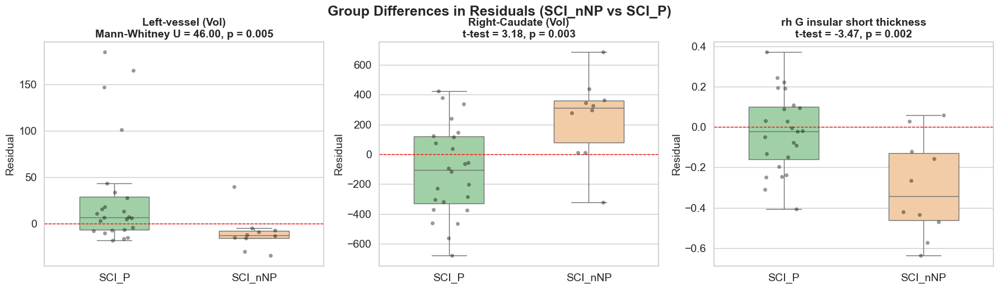

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Signifikante Regionen
significant_regions = anova_df_combined[anova_df_combined["p-value"] < 0.05]["Region"].tolist()
print(f"{len(significant_regions)} significant regions found.")

# Farben
cohort_palette = {
    "SCI_nNP": "#FFCC99",
    "SCI_P": "#99D8A0"
}

# Layout
n = len(significant_regions)
cols = 3
rows = math.ceil(n / cols)

# Plot
fig, axes = plt.subplots(rows, cols, figsize=(cols * 6, rows * 5))
axes = axes.flatten()

for i, region in enumerate(significant_regions):
    residual_col = f"Residual_{region}"

    if residual_col not in df_combined.columns:
        continue

    data = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])][["Cohort", residual_col]].dropna()
    data = data.rename(columns={residual_col: "Residual"})

    ax = axes[i]
    sns.boxplot(x="Cohort", y="Residual", data=data, palette=cohort_palette, ax=ax, width=0.5, fliersize=0)
    sns.stripplot(x="Cohort", y="Residual", data=data, color='black', alpha=0.4, jitter=0.15, size=5, ax=ax)

    ax.axhline(y=0, color="red", linestyle="--", linewidth=1)

    # Stats info for subtitle
    row = anova_df_combined[anova_df_combined["Region"] == region].iloc[0]
    pval = row["p-value"]
    effect_type = row.get("Test")  # Falls Spalte nicht da ist
    effect = row.get("Effect size", row["Statistic"])  # Fallback auf Statistik

    effect_str = f"{effect_type} = {effect:.2f}, p = {pval:.3f}"

    ax.set_title(f"{region.replace('_', ' ')}\n{effect_str}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("Residual", fontsize=14)
    ax.tick_params(axis='both', labelsize=14)

# Hide unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.suptitle("Group Differences in Residuals (SCI_nNP vs SCI_P)", fontsize=18, fontweight="bold", y=1.03)
plt.show()


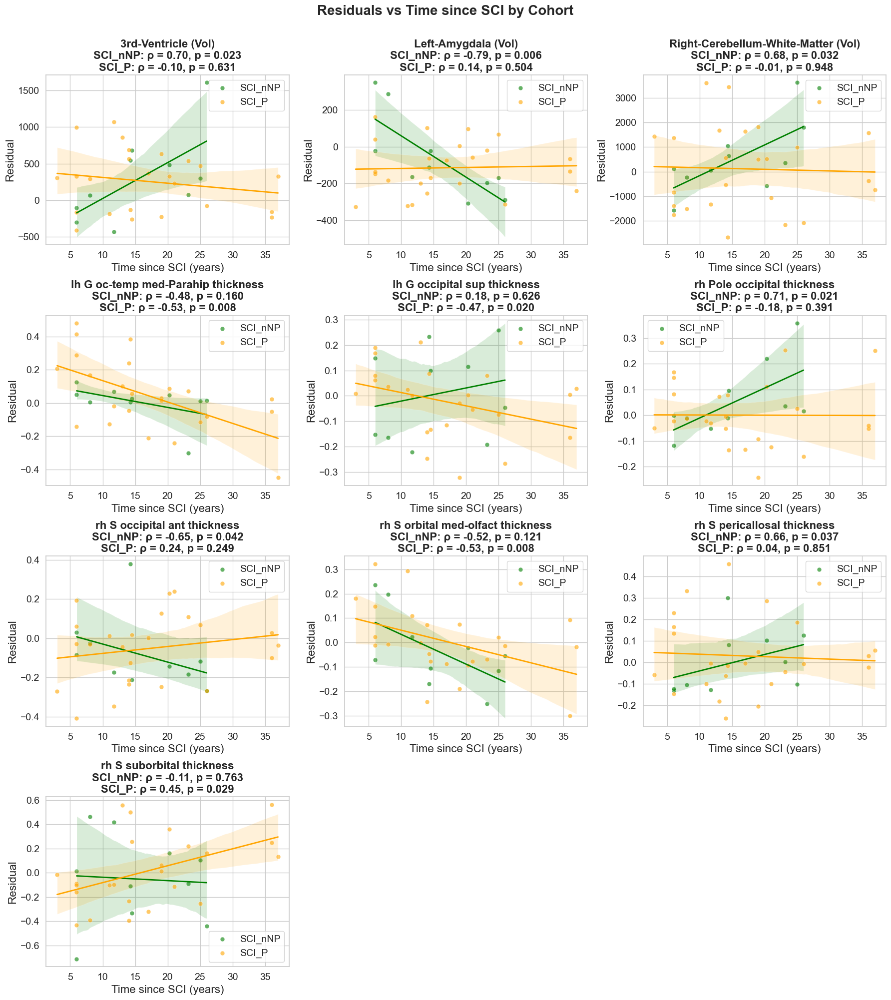

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

# Farben für Gruppen
point_colors = {"SCI_P": "orange", "SCI_nNP": "green"}
cohort_labels = {"SCI_P": "SCI_P", "SCI_nNP": "SCI_nNP"}

# Filtere nur signifikante Regionen (in mindestens einer Gruppe)
sig_regions = results_df[results_df["p-value"] < 0.05]["Region"].unique()

# Anzahl der Regionen und Layout
n = len(sig_regions)
cols = 3
rows = (n // cols) + int(n % cols != 0)
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

# Für jede signifikante Region beide Gruppen plotten
for i, region in enumerate(sig_regions):
    ax = axes[i]
    residual_col = f"Residual_{region}"

    title_lines = [region.replace("_", " ")]

    for cohort in ["SCI_nNP", "SCI_P"]:
        cohort_data = df_combined[df_combined["Cohort"] == cohort][[residual_col, "Time since SCI (years) "]].dropna()

        if cohort_data.empty:
            continue

        # Punkte
        sns.scatterplot(
            data=cohort_data,
            x="Time since SCI (years) ",
            y=residual_col,
            color=point_colors[cohort],
            alpha=0.6,
            s=40,
            ax=ax,
            label=cohort_labels[cohort]
        )

        # Regressionslinie
        sns.regplot(
            data=cohort_data,
            x="Time since SCI (years) ",
            y=residual_col,
            scatter=False,
            color=point_colors[cohort],
            ax=ax,
            line_kws={"linewidth": 2},
        )

        # Statistische Werte für Titel extrahieren
        row = results_df[(results_df["Region"] == region) & (results_df["Cohort"] == cohort)]
        if not row.empty:
            rho = row["Spearman ρ"].values[0]
            p_val = row["p-value"].values[0]
            title_lines.append(f"{cohort_labels[cohort]}: ρ = {rho:.2f}, p = {p_val:.3f}")

    # Titel, Labels
    ax.set_title("\n".join(title_lines), fontsize=16, fontweight="bold")
    ax.set_xlabel("Time since SCI (years)", fontsize=16)
    ax.set_ylabel("Residual", fontsize=16)
    ax.tick_params(axis="both", labelsize=14)
    ax.legend(fontsize=14)

# Überzählige Plots löschen
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.suptitle("Residuals vs Time since SCI by Cohort", fontsize=20, fontweight="bold", y=1)
plt.show()


## How many in each percentile:


# < P1	unter _pr_int_99_lower (extrem niedrig)
# P1–P5	zwischen _pr_int_99_lower und _pr_int_95_lower
# P5–P25	zwischen _pr_int_95_lower und _pr_int_25_lower
# P25–75%	innerhalb _pr_int_25_lower bis _pr_int_25_upper
# 75–95%	über _pr_int_25_upper bis _pr_int_95_upper
# 95–99%	über _pr_int_95_upper bis _pr_int_99_upper
#> P99	oberhalb _pr_int_99_upper

In [21]:

df_norm_females.rename(columns={"age": "Age"}, inplace=True)
region = "Right-Putamen (Vol)"
norm_col = region_mapping[region]  # z.B. "rh_putamen_volume_thickness_median"

# Perzentil-Spalten ableiten
p25_lower = norm_col.replace("_median", "_pr_int_25_lower")
p25_upper = norm_col.replace("_median", "_pr_int_25_upper")
p95_lower = norm_col.replace("_median", "_pr_int_95_lower")
p95_upper = norm_col.replace("_median", "_pr_int_95_upper")
p99_lower = norm_col.replace("_median", "_pr_int_99_lower")
p99_upper = norm_col.replace("_median", "_pr_int_99_upper")

# Interpolierte Grenzwerte
ages = df_females["Rounded_Age"]
value = df_females[region]

df_females["P25_L"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p25_lower])
df_females["P25_U"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p25_upper])
df_females["P95_L"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p95_lower])
df_females["P95_U"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p95_upper])
df_females["P99_L"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p99_lower])
df_females["P99_U"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p99_upper])

# Gruppierung zuweisen
def assign_percentile_group(row):
    val = row[region]
    if pd.isna(val):
        return "Missing"
    if val < row["P99_L"]:
        return "<P1"
    elif val < row["P95_L"]:
        return "P1–P5"
    elif val < row["P25_L"]:
        return "P5–P25"
    elif val <= row["P25_U"]:
        return "P25–P75"
    elif val <= row["P95_U"]:
        return "P75–P95"
    elif val <= row["P99_U"]:
        return "P95–P99"
    else:
        return ">P99"

df_females["Percentile_Group_Right-Putamen"] = df_females.apply(assign_percentile_group, axis=1)

# Zusammenfassen
summary = df_females["Percentile_Group_Right-Putamen"].value_counts().sort_index()
print("📊 Verteilung der Subjekte (Right-Putamen (Vol)) – df_females:")
print(summary)


📊 Verteilung der Subjekte (Right-Putamen (Vol)) – df_females:
Percentile_Group_Right-Putamen
P25–P75    1
P5–P25     2
P75–P95    3
Name: count, dtype: int64


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/3430586268.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_females["P25_L"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p25_lower])
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/3430586268.py:18: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_females["P25_U"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p25_upper])
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/3430586268.py:19: PerformanceWarni

In [22]:
# Sicherstellen, dass 'Age' korrekt benannt ist
df_norm_females.rename(columns={"age": "Age"}, inplace=True)

# Leere Liste für alle Ergebnisse
summary_list = []

for region, norm_col in region_mapping.items():
    try:
        # Spaltennamen für Perzentile
        p25_lower = norm_col.replace("_median", "_pr_int_25_lower")
        p25_upper = norm_col.replace("_median", "_pr_int_25_upper")
        p95_lower = norm_col.replace("_median", "_pr_int_95_lower")
        p95_upper = norm_col.replace("_median", "_pr_int_95_upper")
        p99_lower = norm_col.replace("_median", "_pr_int_99_lower")
        p99_upper = norm_col.replace("_median", "_pr_int_99_upper")

        # Prüfen, ob alle Perzentil-Spalten in den Normdaten vorhanden sind
        required_cols = [p25_lower, p25_upper, p95_lower, p95_upper, p99_lower, p99_upper]
        if not all(col in df_norm_females.columns for col in required_cols):
            print(f"⚠️ Überspringe {region}: fehlende Perzentilspalten")
            continue

        # Interpolierte Grenzwerte
        ages = df_females["Rounded_Age"]
        df_females["P25_L"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p25_lower])
        df_females["P25_U"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p25_upper])
        df_females["P95_L"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p95_lower])
        df_females["P95_U"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p95_upper])
        df_females["P99_L"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p99_lower])
        df_females["P99_U"] = np.interp(ages, df_norm_females["Age"], df_norm_females[p99_upper])

        # Gruppierung zuweisen
        def assign_group(row):
            val = row[region]
            if pd.isna(val):
                return "Missing"
            if val < row["P99_L"]:
                return "<P1"
            elif val < row["P95_L"]:
                return "P1–P5"
            elif val < row["P25_L"]:
                return "P5–P25"
            elif val <= row["P25_U"]:
                return "P25–P75"
            elif val <= row["P95_U"]:
                return "P75–P95"
            elif val <= row["P99_U"]:
                return "P95–P99"
            else:
                return ">P99"

        group_col = f"Percentile_Group_{region}"
        df_females[group_col] = df_females.apply(assign_group, axis=1)

        # Ergebnisse zählen
        counts = df_females[group_col].value_counts()
        for group, count in counts.items():
            summary_list.append({
                "Region": region,
                "Group": group,
                "Count": count
            })

    except Exception as e:
        print(f"❌ Fehler bei {region}: {e}")

# Zusammenfassung als DataFrame
summary_df = pd.DataFrame(summary_list)

# Optional: Excel speichern
summary_df.to_excel("Percentile_Distribution_Females.xlsx", index=False)
print("✅ Zusammenfassung gespeichert als 'Percentile_Distribution_Females.xlsx'")
# Sicherstellen, dass summary_df existiert
if "summary_df" not in locals():
    raise ValueError("❗ summary_df ist nicht definiert. Stelle sicher, dass du vorherigen Codeblock ausgeführt hast.")

# Gruppieren nach 'Group' und aufsummieren
total_counts = summary_df.groupby("Group")["Count"].sum().sort_index()

# Ausgabe
print("📊 Gesamtanzahl Subjekte in jeder Perzentilgruppe (über alle Regionen hinweg):\n")
for group, count in total_counts.items():
    print(f"{group:>8}: {count} Subjekt{'e' if count != 1 else ''}")


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/264534734.py:53: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_females[group_col] = df_females.apply(assign_group, axis=1)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/264534734.py:53: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_females[group_col] = df_females.apply(assign_group, axis=1)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/264534734.py:53: PerformanceWarning: DataFrame is highly fragmented.  This is usually the 

✅ Zusammenfassung gespeichert als 'Percentile_Distribution_Females.xlsx'
📊 Gesamtanzahl Subjekte in jeder Perzentilgruppe (über alle Regionen hinweg):

     <P1: 3 Subjekte
    >P99: 4 Subjekte
   P1–P5: 23 Subjekte
 P25–P75: 597 Subjekte
  P5–P25: 290 Subjekte
 P75–P95: 139 Subjekte
 P95–P99: 18 Subjekte


In [23]:
# Sicherstellen, dass 'Age' korrekt benannt ist
df_norm_males.rename(columns={"age": "Age"}, inplace=True)

# Leere Liste für alle Ergebnisse
summary_list = []

for region, norm_col in region_mapping.items():
    try:
        # Spaltennamen für Perzentile
        p25_lower = norm_col.replace("_median", "_pr_int_25_lower")
        p25_upper = norm_col.replace("_median", "_pr_int_25_upper")
        p95_lower = norm_col.replace("_median", "_pr_int_95_lower")
        p95_upper = norm_col.replace("_median", "_pr_int_95_upper")
        p99_lower = norm_col.replace("_median", "_pr_int_99_lower")
        p99_upper = norm_col.replace("_median", "_pr_int_99_upper")

        # Prüfen, ob alle Perzentil-Spalten in den Normdaten vorhanden sind
        required_cols = [p25_lower, p25_upper, p95_lower, p95_upper, p99_lower, p99_upper]
        if not all(col in df_norm_males.columns for col in required_cols):
            print(f"⚠️ Überspringe {region}: fehlende Perzentilspalten")
            continue

        # Interpolierte Grenzwerte
        ages = df_males["Rounded_Age"]
        df_males["P25_L"] = np.interp(ages, df_norm_males["Age"], df_norm_males[p25_lower])
        df_males["P25_U"] = np.interp(ages, df_norm_males["Age"], df_norm_males[p25_upper])
        df_males["P95_L"] = np.interp(ages, df_norm_males["Age"], df_norm_males[p95_lower])
        df_males["P95_U"] = np.interp(ages, df_norm_males["Age"], df_norm_males[p95_upper])
        df_males["P99_L"] = np.interp(ages, df_norm_males["Age"], df_norm_males[p99_lower])
        df_males["P99_U"] = np.interp(ages, df_norm_males["Age"], df_norm_males[p99_upper])

        # Gruppierung zuweisen
        def assign_group(row):
            val = row[region]
            if pd.isna(val):
                return "Missing"
            if val < row["P99_L"]:
                return "<P1"
            elif val < row["P95_L"]:
                return "P1–P5"
            elif val < row["P25_L"]:
                return "P5–P25"
            elif val <= row["P25_U"]:
                return "P25–P75"
            elif val <= row["P95_U"]:
                return "P75–P95"
            elif val <= row["P99_U"]:
                return "P95–P99"
            else:
                return ">P99"

        group_col = f"Percentile_Group_{region}"
        df_males[group_col] = df_males.apply(assign_group, axis=1)

        # Ergebnisse zählen
        counts = df_males[group_col].value_counts()
        for group, count in counts.items():
            summary_list.append({
                "Region": region,
                "Group": group,
                "Count": count
            })

    except Exception as e:
        print(f"❌ Fehler bei {region}: {e}")

# Zusammenfassung als DataFrame
summary_df = pd.DataFrame(summary_list)

# Optional: Excel speichern
summary_df.to_excel("Percentile_Distribution_males.xlsx", index=False)
print("✅ Zusammenfassung gespeichert als 'Percentile_Distribution_Females.xlsx'")
# Sicherstellen, dass summary_df existiert
if "summary_df" not in locals():
    raise ValueError("❗ summary_df ist nicht definiert. Stelle sicher, dass du vorherigen Codeblock ausgeführt hast.")

# Gruppieren nach 'Group' und aufsummieren
total_counts = summary_df.groupby("Group")["Count"].sum().sort_index()

# Ausgabe
print("📊 Gesamtanzahl Subjekte in jeder Perzentilgruppe (über alle Regionen hinweg):\n")
for group, count in total_counts.items():
    print(f"{group:>8}: {count} Subjekt{'e' if count != 1 else ''}")


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/3535364390.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_males["P25_L"] = np.interp(ages, df_norm_males["Age"], df_norm_males[p25_lower])
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/3535364390.py:26: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_males["P25_U"] = np.interp(ages, df_norm_males["Age"], df_norm_males[p25_upper])
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/3535364390.py:27: PerformanceWarning: DataFram

✅ Zusammenfassung gespeichert als 'Percentile_Distribution_Females.xlsx'
📊 Gesamtanzahl Subjekte in jeder Perzentilgruppe (über alle Regionen hinweg):

     <P1: 7 Subjekte
    >P99: 18 Subjekte
   P1–P5: 59 Subjekte
 P25–P75: 3333 Subjekte
  P5–P25: 925 Subjekte
 P75–P95: 614 Subjekte
 P95–P99: 56 Subjekte


### Plot highest F-Value (male + female)

anova_df_combined = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Mixed_ANOVA_KW_Residuals_Combined_SCI(both).xlsx"
anova_df_combined =pd.read_excel(anova_df_combined)


## Only looking at SCI and Controls


from scipy.stats import ttest_1samp, wilcoxon

residual_test_results = []

# Kombiniere beide SCI-Gruppen
sci_data = df_combined[df_combined["Cohort"].isin(["SCI_nNP", "SCI_P"])]

for col in residual_cols:
    region = col.replace("Residual_", "")
    data = sci_data[col].dropna()

    if len(data) > 2:
        # Normalverteilung über gesamte SCI-Gruppe testen
        normal = shapiro(data)[1] > 0.05 if len(data) < 5000 else True

        if normal:
            stat, p = ttest_1samp(data, popmean=0)
            test = "1-sample t-test"
            # ✅ Effect size: Cohen's d
            d = data.mean() / data.std(ddof=1) if data.std(ddof=1) != 0 else np.nan
            effect_size = round(d, 3)
            effect_type = "Cohen's d"
        else:
            stat, p = wilcoxon(data - 0)
            test = "Wilcoxon"
            # ✅ Effect size: Rank-biserial correlation
            n = len(data)
            rbc = stat / (n * (n + 1) / 2)
            effect_size = round(rbc, 3)
            effect_type = "Rank-biserial r"

        residual_test_results.append({
            "Region": region,
            "Cohort": "SCI_combined",
            "Test": test,
            "Statistic": round(stat, 4),
            "p-value": round(p, 5),
            "Effect size": effect_size,
            "Effect type": effect_type,
            "Mean_Residual": round(data.mean(), 3),
            "N": len(data)
        })


# Ergebnisse als DataFrame
"""df_SCI_0= pd.DataFrame(residual_test_results).sort_values("p-value")"""
"""df_SCI_0.to_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison.xlsx, index=False)"""  # optional

In [24]:

non_normal_regions = []

# Kombiniere SCI-Gruppen
sci_data = df_combined[df_combined["Cohort"].isin(["SCI_nNP", "SCI_P"])]

for col in residual_cols:
    data = sci_data[col].dropna()

    if len(data) > 2:
        p_value = shapiro(data)[1] if len(data) < 5000 else 1.0
        if p_value < 0.05:
            non_normal_regions.append((col, data))

# Q-Q Plots für nicht-normalverteilte Regionen
for col, data in non_normal_regions:
    region = col.replace("Residual_", "")
    plt.figure(figsize=(5, 5))
    stats.probplot(data, dist="norm", plot=plt)
    plt.title(f"Q–Q Plot: {region} (nicht normalverteilt)")
    plt.xlabel("Theoretische Quantile")
    plt.ylabel("Beobachtete Quantile")
    plt.grid(True)
    plt.tight_layout()
    plt.close()


## Only T-Test
from scipy.stats import ttest_1samp, wilcoxon
residual_ttest_results = []

# Kombiniere beide SCI-Gruppen
sci_data = df_combined[df_combined["Cohort"].isin(["SCI_nNP", "SCI_P"])]

for col in residual_cols:
    region = col.replace("Residual_", "")
    data = sci_data[col].dropna()

    if len(data) > 2:
        # Immer 1-sample t-Test
        stat, p = ttest_1samp(data, popmean=0)
        test = "1-sample t-test"
        # Effektgröße: Cohen’s d
        std = data.std(ddof=1)
        d = data.mean() / std if std != 0 else np.nan
        effect_size = round(d, 3)
        effect_type = "Cohen's d"

        residual_ttest_results.append({
            "Region": region,
            "Cohort": "SCI_combined",
            "Test": test,
            "Statistic": round(stat, 4),
            "p-value": round(p, 5),
            "Effect size": effect_size,
            "Effect type": effect_type,
            "Mean_Residual": round(data.mean(), 3),
            "N": len(data)
        })
"""# Ergebnisse als DataFrame speichern
df_SCI_0 = pd.DataFrame(residual_ttest_results).sort_values("p-value")
df_SCI_0.to_excel(
    "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_all_ttest.xlsx",
    index=False
)"""


# Liste der interessanten Regionen
regions = [
    "lh_G_subcallosal_thickness",
    "lh_Lat_Fis-ant-Horizont_thickness",
    "lh_S_orbital_lateral_thickness",
    "rh_G&S_subcentral_thickness",
    "rh_S_intrapariet&P_trans_thickness",
    "rh_S_oc_middle&Lunatus_thickness",
    "rh_S_oc_sup&transversal_thickness",
    "rh_S_oc-temp_med&Lingual_thickness",
    "Right-Inf-Lat-Vent (Vol)",
    "Right-vessel (Vol)",
    "SubCortGrayVol (Vol)"
]

# Filter auf SCI-Teilnehmer
df_sci = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

# Plot-Setup
n = len(regions)
cols = 4
rows = (n // cols) + int(n % cols != 0)
fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
axes = axes.flatten()

# Outlier-Daten sammeln
outlier_info = []

for i, region in enumerate(regions):
    residual_col = f"Residual_{region}"
    if residual_col not in df_sci.columns:
        continue

    data = df_sci[[residual_col, "subject", "Cohort"]].dropna()
    data["Group"] = "SCI_combined"

    # IQR-basierte Outlier-Bestimmung
    Q1 = data[residual_col].quantile(0.25)
    Q3 = data[residual_col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = data[(data[residual_col] < lower) | (data[residual_col] > upper)]

    # Outlier speichern
    for _, row in outliers.iterrows():
        outlier_info.append({
            "Region": region,
            "Subject": row["subject"],
            "Residual": row[residual_col],
            "Cohorts": row["Cohort"]
        })

    # Plot
    ax = axes[i]
    sns.boxplot(x="Group", y=residual_col, data=data, showfliers=False, color="skyblue", ax=ax)
    sns.stripplot(x="Group", y=residual_col, data=data, color="black", jitter=0.25, alpha=0.6, ax=ax)
    ax.scatter(0, data[residual_col].mean(), color="red", s=100, marker="v", zorder=10, label="Mean")
    ax.axhline(0, color="gray", linestyle="--", linewidth=1)
    ax.set_title(region.replace("_", " "), fontsize=12)
    ax.set_xlabel("")
    ax.set_ylabel("Residual")

# Überzählige Plots löschen
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.close()

# Ausgabe der Outlier mit Subject-Nr.
outlier_df = pd.DataFrame(outlier_info)
display(outlier_df)

# Optional: Auch die Residual-Werte anzeigen
print("\nOutlier Values:")
print(outliers[residual_col])
print(outliers["subject"].tolist())


In [25]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import ttest_1samp, wilcoxon
residual_ttest_results = []

# Kombiniere beide SCI-Gruppen
sci_data = df_combined[df_combined["Cohort"].isin(["SCI_nNP", "SCI_P"])]

for col in residual_cols:
    region = col.replace("Residual_", "")
    data = sci_data[col].dropna()

    if len(data) > 2:
        # Normalverteilung prüfen (Shapiro-Wilk)
        if len(data) < 5000:
            p_norm = shapiro(data)[1]
            distribution = "normal" if p_norm > 0.05 else "non-normal"
        else:
            distribution = "assumed normal"

        # Immer 1-sample t-Test
        stat, p = ttest_1samp(data, popmean=0)
        test = "1-sample t-test"

        # Effektgröße: Cohen’s d
        std = data.std(ddof=1)
        d = data.mean() / std if std != 0 else np.nan
        effect_size = round(d, 3)
        effect_type = "Cohen's d"

        residual_ttest_results.append({
            "Region": region,
            "Cohort": "SCI_combined",
            "Test": test,
            "Statistic": round(stat, 4),
            "p-value": round(p, 5),
            "Effect size": effect_size,
            "Effect type": effect_type,
            "Mean_Residual": round(data.mean(), 3),
            "N": len(data),
            "Distribution": distribution
        })

# Ergebnisse als DataFrame
df_SCI_FDR = pd.DataFrame(residual_ttest_results)

# 🔹 FDR-Korrektur anwenden (Benjamini-Hochberg)
_, fdr_corrected_pvals, _, _ = multipletests(df_SCI_FDR["p-value"], method='fdr_bh')
df_SCI_FDR["p-value (FDR)"] = fdr_corrected_pvals

"""# Sortieren und Export
df_SCI_FDR = df_SCI_FDR.sort_values("p-value")
df_SCI_FDR.to_excel(
    "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx",
    index=False
)"""

print("✅ Results with FDR correction and normality added.")


✅ Results with FDR correction and normality added.


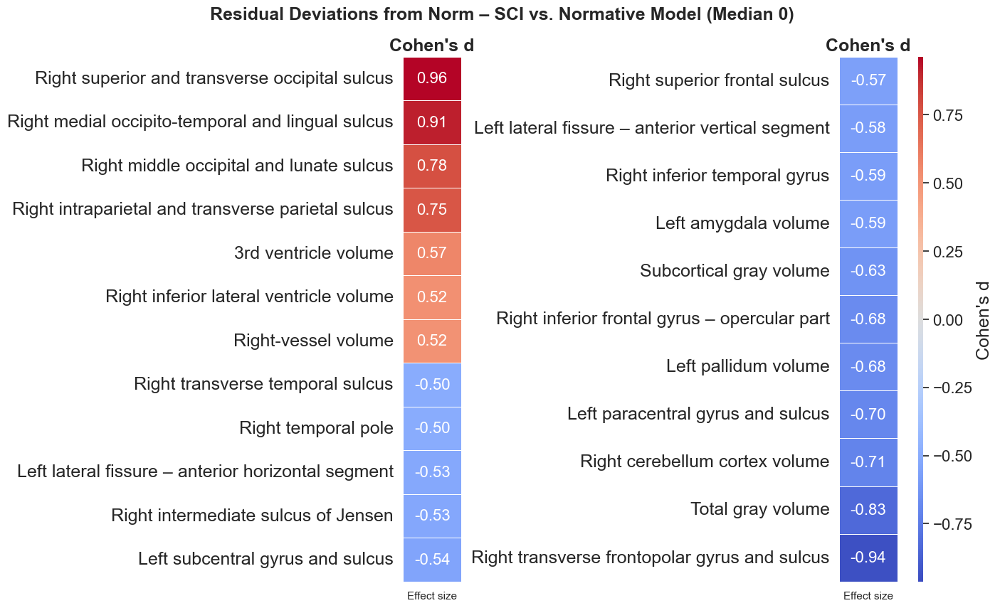

In [26]:
region_name_map = {
    "rh_S_oc_sup_and_transversal_thickness": "Right superior and transverse occipital sulcus",
    "rh_G_and_S_transv_frontopol_thickness": "Right transverse frontopolar gyrus and sulcus",
    "rh_S_oc-temp_med_and_Lingual_thickness": "Right medial occipito-temporal and lingual sulcus",
    "rh_S_oc_middle_and_Lunatus_thickness": "Right middle occipital and lunate sulcus",
    "rh_S_intrapariet_and_P_trans_thickness": "Right intraparietal and transverse parietal sulcus",
    "lh_G_and_S_paracentral_thickness": "Left paracentral gyrus and sulcus",
    "rh_G_front_inf-Opercular_thickness": "Right inferior frontal gyrus – opercular part",
    "rh_G_temporal_inf_thickness": "Right inferior temporal gyrus",
    "lh_Lat_Fis-ant-Vertical_thickness": "Left lateral fissure – anterior vertical segment",
    "rh_S_front_sup_thickness": "Right superior frontal sulcus",
    "lh_G_and_S_subcentral_thickness": "Left subcentral gyrus and sulcus",
    "rh_S_interm_prim-Jensen_thickness": "Right intermediate sulcus of Jensen",
    "lh_Lat_Fis-ant-Horizont_thickness": "Left lateral fissure – anterior horizontal segment",
    "rh_Pole_temporal_thickness": "Right temporal pole",
    "rh_S_temporal_transverse_thickness": "Right transverse temporal sulcus",
    "SubCortGrayVol (Vol)": "Subcortical gray volume",
    "TotalGrayVol (Vol)": "Total gray volume",
    "Right-Cerebellum-Cortex (Vol)": "Right cerebellum cortex volume",
    "Left-Pallidum (Vol)": "Left pallidum volume",
    "Left-Amygdala (Vol)": "Left amygdala volume",
    "3rd-Ventricle (Vol)": "3rd ventricle volume",
    "Right-Inf-Lat-Vent (Vol)": "Right inferior lateral ventricle volume",
    "Right-vessel (Vol)": "Right-vessel volume"
}

# Load data
df_SCI_0 = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx")
df_SCI_1 = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx")
# Reihenfolge: Mapping vor Umbruch
df_SCI_1["Region"] = (
    df_SCI_0["Region"]
    .str.replace("&", "_and_", regex=False)
    .str.replace("__", "_", regex=False)
    .str.strip()
    .replace(region_name_map)
)

df_SCI_1["Region"] = df_SCI_1["Region"].replace(region_name_map)

df_sig = df_SCI_1[df_SCI_1["p-value (FDR)"] < 0.05].copy()
df_sig_sorted = df_sig.sort_values("Effect size", ascending=False).reset_index(drop=True)



# Effect size color range
vmin = df_sig_sorted["Effect size"].min()
vmax = df_sig_sorted["Effect size"].max()
abs_max = max(abs(vmin), abs(vmax))
vmin, vmax = -abs_max, abs_max

# Split into 4 chunks
n = len(df_sig_sorted)
cols = 2
chunk_size = math.ceil(n / cols)
chunks = [df_sig_sorted.iloc[i:i + chunk_size] for i in range(0, n, chunk_size)]

## New figure size → wider & taller for better spacing
fig, axes = plt.subplots(1, cols, figsize=(14, 8), sharey=False, constrained_layout=True)
cbar_ax = fig.axes[-1]
# Generate each heatmap
for i, (chunk, ax) in enumerate(zip(chunks, axes)):
    data = chunk.set_index("Region")[["Effect size"]]
    show_colorbar = (i == cols - 1)  # Only on the last plot

    heatmap = sns.heatmap(
    data,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    vmin=vmin,
    vmax=vmax,
    cbar=show_colorbar,
    yticklabels=True,  # ✅ wichtig
    ax=ax,
    annot_kws={
        "color": "white",
        "fontsize": 16,

    },
    cbar_kws={
        "label": "Effect Size",
        "shrink": 1,
        "aspect": 100,
        "pad": 0.35

    } if show_colorbar else None
)

#  ZWINGE saubere Y-Achsenbeschriftung:
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=18)


    ax.set_title(f"Cohen's d", fontsize=18, fontweight="bold")
    '''ax.set_xlabel("")'''
    ax.set_ylabel("")
    '''ax.tick_params(axis='x', labelrotation=0, labelsize=14)'''
    ax.tick_params(axis='y', labelsize=18)
# Größere Ticklabels für die Colorbar setzen
if show_colorbar:
    colorbar = heatmap.collections[0].colorbar
    colorbar.ax.tick_params(labelsize=16)  # 👈 Größe der Ticklabels
    colorbar.set_label("Cohen's d", fontsize=18)  # 👈 Label-Größe
# Overall title
plt.suptitle("Residual Deviations from Norm – SCI vs. Normative Model (Median 0)", fontsize=18, fontweight="bold", y=1.05)
plt.show()




## Is there a difference between the 3 Cohorts:

### Just T-Test:


## Onyl signfiikant Regions from 1. Analyses

In [27]:
# 1. Lade signifikante Regionen aus der ersten Analyse
df_first = pd.read_excel(
    "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx"
)
significant_regions = df_first[df_first["p-value (FDR)"] < 0.05]["Region"].tolist()

# 2. Filtere Residual-Spalten basierend auf diesen Regionen
residual_cols = [f"Residual_{r}" for r in significant_regions if f"Residual_{r}" in df_combined.columns]

# 3. Berechne alle drei Tests wie gehabt – aber nur für gefilterte Regionen
results = []

for col in residual_cols:
    region = col.replace("Residual_", "")
    sci_p = df_combined[df_combined["Cohort"] == "SCI_P"][col].dropna()
    sci_nnp = df_combined[df_combined["Cohort"] == "SCI_nNP"][col].dropna()

    # ➤ Test 1: SCI_P vs 0
    if len(sci_p) >= 4:
        stat, p_val = ttest_1samp(sci_p, popmean=0)
        effect_size = sci_p.mean() / sci_p.std(ddof=1)
        results.append({
            "Region": region,
            "Cohort": "SCI_P",
            "Comparison": "vs 0",
            "Test": "t-test vs 0",
            "Statistic": round(stat, 3),
            "p-value": p_val,
            "Effect Size": round(effect_size, 3),
            "Effect Type": "Cohen's d",
            "n": len(sci_p)
        })

    # ➤ Test 2: SCI_nNP vs 0
    if len(sci_nnp) >= 4:
        stat, p_val = ttest_1samp(sci_nnp, popmean=0)
        effect_size = sci_nnp.mean() / sci_nnp.std(ddof=1)
        results.append({
            "Region": region,
            "Cohort": "SCI_nNP",
            "Comparison": "vs 0",
            "Test": "t-test vs 0",
            "Statistic": round(stat, 3),
            "p-value": p_val,
            "Effect Size": round(effect_size, 3),
            "Effect Type": "Cohen's d",
            "n": len(sci_nnp)
        })

    # ➤ Test 3: SCI_P vs SCI_nNP
    if len(sci_p) >= 4 and len(sci_nnp) >= 4:
        stat, p_val = ttest_ind(sci_p, sci_nnp)
        n1, n2 = len(sci_p), len(sci_nnp)
        s1, s2 = sci_p.std(ddof=1), sci_nnp.std(ddof=1)

        # Gewichtete gepoolte SD
        pooled_sd = np.sqrt(((n1 - 1) * s1**2 + (n2 - 1) * s2**2) / (n1 + n2 - 2))
        # Cohen's d
        effect_size = (sci_p.mean() - sci_nnp.mean()) / pooled_sd

        results.append({
            "Region": region,
            "Cohort": "Both",
            "Comparison": "SCI_P vs SCI_nNP",
            "Test": "t-test between groups",
            "Statistic": round(stat, 3),
            "p-value": p_val,
            "Effect Size": round(effect_size, 3),
            "Effect Type": "Cohen's d",
            "n_SCI_P": len(sci_p),
            "n_SCI_nNP": len(sci_nnp)
        })

# 4. Zusammenfassen und speichern
df_filtered_results = pd.DataFrame(results)

output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/GroupComarpison_SignificantRegionsOnly.xlsx"
df_filtered_results.to_excel(output_path, index=False)

print("✅ Tests für signifikante Regionen abgeschlossen und gespeichert.")



✅ Tests für signifikante Regionen abgeschlossen und gespeichert.


In [28]:
region_name_map = {
    "rh_S_oc_sup&transversal_thickness": "Right superior and transverse occipital sulcus",
    "rh_G&S_transv_frontopol_thickness": "Right transverse frontopolar gyrus and sulcus",
    "rh_S_oc-temp_med&Lingual_thickness": "Right medial occipito-temporal and lingual sulcus",
    "rh_S_oc_middle&Lunatus_thickness": "Right middle occipital and lunate sulcus",
    "rh_S_intrapariet&P_trans_thickness": "Right intraparietal and transverse parietal sulcus",
    "lh_G&S_paracentral_thickness": "Left paracentral gyrus and sulcus",
    "rh_G_front_inf-Opercular_thickness": "Right inferior frontal gyrus – opercular part",
    "rh_G_temporal_inf_thickness": "Right inferior temporal gyrus",
    "lh_Lat_Fis-ant-Vertical_thickness": "Left lateral fissure – anterior vertical segment",
    "rh_S_front_sup_thickness": "Right superior frontal sulcus",
    "lh_G&S_subcentral_thickness": "Left subcentral gyrus and sulcus",
    "rh_S_interm_prim-Jensen_thickness": "Right intermediate sulcus of Jensen",
    "lh_Lat_Fis-ant-Horizont_thickness": "Left lateral fissure – anterior horizontal segment",
    "rh_Pole_temporal_thickness": "Right temporal pole",
    "rh_S_temporal_transverse_thickness": "Right transverse temporal sulcus",
    "SubCortGrayVol (Vol)": "Subcortical gray volume",
    "TotalGrayVol (Vol)": "Total gray volume",
    "Right-Cerebellum-Cortex (Vol)": "Right cerebellum cortex volume",
    "Left-Pallidum (Vol)": "Left pallidum volume",
    "Left-Amygdala (Vol)": "Left amygdala volume",
    "3rd-Ventricle (Vol)": "3rd ventricle volume",
    "Right-Inf-Lat-Vent (Vol)": "Right inferior lateral ventricle volume",
    "Right-vessel (Vol)": "Right-vessel volume"
}

/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1938784585.py:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("coolwarm")
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1938784585.py:118: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_filtered, x="Cohort", y=residual_col, ax=ax_group, palette=palette, showfliers=False)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1938784585.py:118: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_filter

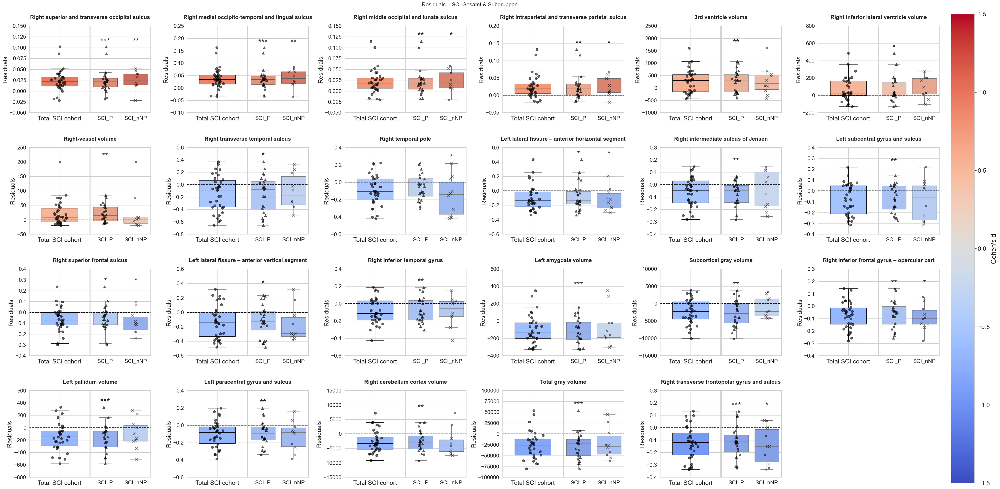

In [29]:
import matplotlib.gridspec as gridspec
import math

# Daten laden
df_first = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx")
raw_regions = df_first[df_first["p-value (FDR)"] < 0.05]["Region"].tolist()
# Cohen's d aus der ersten Datei (für All SCI vs 0)
df_first["Region_key"] = df_first["Region"].str.replace("&", "_and_").str.replace("__", "_").str.strip()
cohen_d_all = df_first.set_index("Region_key")["Effect size"].to_dict()

# Sortieren nach Effektstärke aus df_first
df_sig_sorted = df_first[df_first["p-value (FDR)"] < 0.05].copy()
df_sig_sorted["Region_key"] = df_sig_sorted["Region"].str.replace("&", "_and_").str.replace("__", "_").str.strip()
df_sig_sorted = df_sig_sorted.sort_values("Effect size", ascending=False)

# Nur Regionen übernehmen, für die Residual-Spalten existieren
valid_regions = []
for region, d in zip(df_sig_sorted["Region"], df_sig_sorted["Effect size"]):
    if f"Residual_{region}" in df_combined.columns:
        pretty = region_name_map.get(region, region)
        valid_regions.append((region, pretty))


df_group_stats = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/GroupComarpison_SignificantRegionsOnly.xlsx")
df_group_stats["Region_key"] = df_group_stats["Region"].str.replace("&", "_and_").str.replace("__", "_").str.strip()

# Dictionaries
pval_vs0 = df_group_stats[df_group_stats["Comparison"] == "vs 0"].set_index(["Region_key", "Cohort"])["p-value"].to_dict()
pval_vs_group = df_group_stats[df_group_stats["Comparison"] == "SCI_P vs SCI_nNP"].set_index("Region_key")["p-value"].to_dict()

# Effektstärken-Map (angenommen Spalte heißt "Cohen's d")
cohen_d_vs0 = df_group_stats[df_group_stats["Comparison"] == "vs 0"].set_index(["Region_key", "Cohort"])["Effect Size"].to_dict()


df_filtered = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]
regions_per_row = 6
rows = math.ceil(len(significant_regions) / regions_per_row)

fig = plt.figure(figsize=(regions_per_row * 8, rows * 6))
outer = gridspec.GridSpec(rows, regions_per_row, wspace=0.3, hspace=0.4)

def get_star(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''


import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Normierung für die Farbskala: ggf. Range anpassen!
norm = mcolors.TwoSlopeNorm(vmin=-1.5, vcenter=0, vmax=1.5)
cmap = cm.get_cmap("coolwarm")


for idx, (region, pretty_region) in enumerate(valid_regions):
    residual_col = f"Residual_{region}"
    if residual_col not in df_combined.columns:
        continue

    region_key = region.replace("&", "_and_").replace("__", "_").strip()

    row = idx // regions_per_row
    col = idx % regions_per_row
        # Berechne die mittige X-Position (basierend auf subplot-Positionen)


    inner = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer[row, col], wspace=0.01)
    ax_all = plt.Subplot(fig, inner[0])
    ax_group = plt.Subplot(fig, inner[1])
    ax_group.sharey(ax_all)  # <<< Das ist neu!
    fig.add_subplot(ax_all)
    fig.add_subplot(ax_group)


    # Plot 1: All SCI
    vals_all = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])][residual_col].dropna()

    # Cohen's d für All SCI aus erster Datei
    cohen_val = cohen_d_all.get(region_key, 0)

    box_color = cmap(norm(cohen_val))

    # Neue, manuelle Gruppierung (x=0 für All SCI)
    ax_all.boxplot(
        [vals_all],
        positions=[0],
        patch_artist=True,
        boxprops=dict(facecolor=box_color),
        showfliers=False,
        widths=0.6,
        medianprops=dict(color='black')
    )

    jitter = np.random.normal(loc=0, scale=0.05, size=len(vals_all))
    ax_all.scatter(jitter, vals_all, color="black", alpha=0.6, s=49, zorder=3, marker="o", label="Total SCI")
    ax_all.axhline(0, color="black", linestyle="--")
    ax_all.set_xticks([0])
    ax_all.set_xticklabels(["Total SCI cohort"], fontsize=18)  # 👈 hier!
    ax_all.tick_params(axis='y', labelsize=16)
    ax_all.set_ylabel("Residuals", fontsize = 18)


    # Plot 2: Gruppenvergleich
    # Cohen's d für Gruppenplots
    cohen_d_p = cohen_d_vs0.get((region_key, "SCI_P"), 0)
    cohen_d_nnp = cohen_d_vs0.get((region_key, "SCI_nNP"), 0)

    color_p = cmap(norm(cohen_d_p))
    color_nnp = cmap(norm(cohen_d_nnp))

    palette = {"SCI_P": color_p, "SCI_nNP": color_nnp}
    sns.boxplot(data=df_filtered, x="Cohort", y=residual_col, ax=ax_group, palette=palette, showfliers=False)
    """sns.stripplot(data=df_filtered, x="Cohort", y=residual_col, ax=ax_group, color="black", alpha=0.4, jitter=True, size=7)"""
    """# Stripplot manuell: alle SCI gemeinsam – unterscheide Marker je Gruppe
    for cohort, marker in zip(["SCI_P", "SCI_nNP"], ["x", "^"]):  # x=Kreuz, ^=Dreieck
        group_data = df_combined[df_combined["Cohort"] == cohort][residual_col]
        jitter = np.random.normal(loc=0, scale=0.05, size=len(group_data))
        ax_all.scatter(
            jitter,
            group_data,
            color="black",
            alpha=0.6,
            s=50,
            marker=marker,
            label=cohort
        )"""
    # SCI_P = Dreieck (^)
    group1 = df_filtered[df_filtered["Cohort"] == "SCI_P"]
    ax_group.scatter(
        x=np.random.normal(loc=0, scale=0.05, size=len(group1)),
        y=group1[residual_col],
        marker="^",
        color="black",
        alpha=0.6,
        s=50,
        label="SCI_P",
         zorder=3
    )

    # Punkte für SCI_nNP (Gruppe 2)
    # SCI_nNP = Kreuz (x)
    group2 = df_filtered[df_filtered["Cohort"] == "SCI_nNP"]
    ax_group.scatter(
        x=np.random.normal(loc=1, scale=0.05, size=len(group2)),
        y=group2[residual_col],
        marker="x",
        color="black",
        alpha=0.6,
        s=50,
        label="SCI_nNP",
        zorder=3
    )

    "ax_group.legend()"
    ax_group.axhline(0, color="black", linestyle="--")
    ax_group.set_ylabel("")
    ax_group.set_xlabel("")
    ax_group.tick_params(axis='x', labelsize=16)


    pos_all = ax_all.get_position()
    pos_group = ax_group.get_position()
    mid_x = (pos_all.x0 + pos_group.x1) / 2
    top_y = pos_all.y1 + 0.01  # etwas über dem Plot

    fig.text(mid_x, top_y, pretty_region, ha='center', va='bottom', fontsize=16, weight='bold')



    # Gemeinsame y-Achse berechnen
    all_vals = pd.concat([
        df_filtered[df_filtered["Cohort"] == "SCI_P"][residual_col],
        df_filtered[df_filtered["Cohort"] == "SCI_nNP"][residual_col]
    ]).dropna()
    y_min = all_vals.min()
    y_max = all_vals.max()
    y_range = y_max - y_min if y_max != y_min else 1
    y_buffer = y_range * 0.2
    ylim = (y_min - 0.1 * y_range, y_max + y_buffer)

    # Gemeinsame y-Achse setzen
    ax_all.set_ylim(ylim)
    ax_group.set_ylim(ylim)

    # Y-Achsen-Ticks angleichen
    ax_group.set_yticks(ax_all.get_yticks())

    # Nur links anzeigen, rechts unterdrücken
    ax_group.tick_params(axis='y', labelleft=False, left=False)

    # Sterne
    try:
        p = pval_vs0.get((region_key, "SCI_P"), None)
        if p is not None and p < 0.05:
            ax_group.text(0, y_max + y_range * 0.05, get_star(p), ha='center', fontsize=25)
    except: pass

    try:
        p = pval_vs0.get((region_key, "SCI_nNP"), None)
        if p is not None and p < 0.05:
            ax_group.text(1, y_max + y_range * 0.05, get_star(p), ha='center', fontsize=25)
    except: pass

    try:
        p = pval_vs_group.get(region_key, None)
        if p is not None and p < 0.05:
            ax_group.text(0.5, y_max + y_range * 0.15, get_star(p), ha='center', fontsize=14, color="blue")
    except: pass



plt.suptitle("Residuals – SCI Gesamt & Subgruppen", fontsize=16, y=0.92)
# Erst Platz schaffen, bevor Texte eingefügt werden
plt.tight_layout(rect=[0, 0, 1, 0.90])  # genug Platz für alle Regionstitel oben drüber

sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.91, 0.1, 0.02, 0.8])  # Rechts neben Plots
cbar = fig.colorbar(sm, cax=cbar_ax, label="Cohen's d")
cbar.ax.tick_params(labelsize=18)  # 👈 Tickgröße
cbar.set_label("Cohen's d", fontsize=20)  # 👈 Beschriftung
fig.colorbar(sm, cax=cbar_ax, label="Cohen's d")
plt.show()

/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1846946497.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap("coolwarm")
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1846946497.py:72: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1846946497.py:84: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_all.set_xticklabels(["Total SCI cohort"], fontsize=18)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1846946497.py:92: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be r

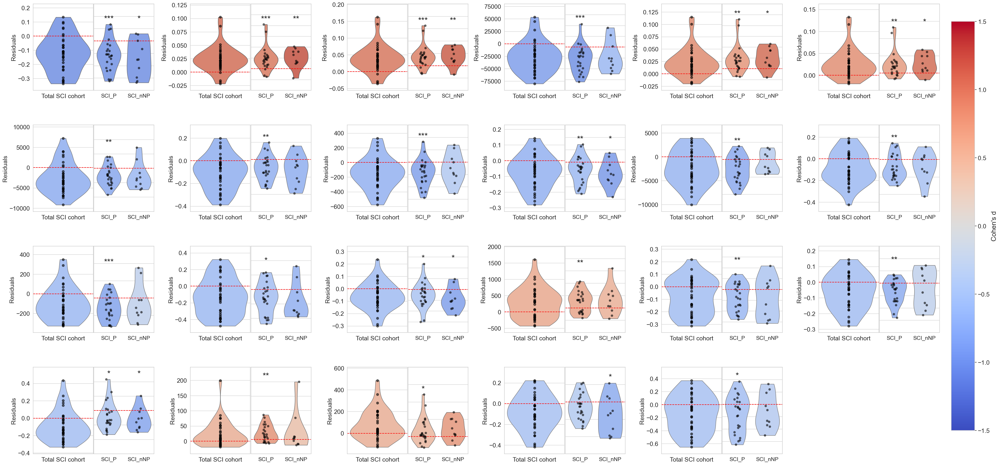

In [30]:

# Daten laden
df_first = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx")
raw_regions = df_first[df_first["p-value (FDR)"] < 0.05]["Region"].tolist()
# Cohen's d aus der ersten Datei (für All SCI vs 0)
df_first["Region_key"] = df_first["Region"].str.replace("&", "_and_").str.replace("__", "_").str.strip()
cohen_d_all = df_first.set_index("Region_key")["Effect size"].to_dict()

# Nur Regionen, für die Residual-Spalten vorhanden sind
valid_regions = []
for region in raw_regions:
    if f"Residual_{region}" in df_combined.columns:
        pretty = region_name_map.get(region, region)  # Mapping oder Original
        valid_regions.append((region, pretty))

df_group_stats = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/GroupComarpison_SignificantRegionsOnly.xlsx")
df_group_stats["Region_key"] = df_group_stats["Region"].str.replace("&", "_and_").str.replace("__", "_").str.strip()

# Dictionaries
pval_vs0 = df_group_stats[df_group_stats["Comparison"] == "vs 0"].set_index(["Region_key", "Cohort"])["p-value"].to_dict()
pval_vs_group = df_group_stats[df_group_stats["Comparison"] == "SCI_P vs SCI_nNP"].set_index("Region_key")["p-value"].to_dict()

# Effektstärken-Map (angenommen Spalte heißt "Cohen's d")
cohen_d_vs0 = df_group_stats[df_group_stats["Comparison"] == "vs 0"].set_index(["Region_key", "Cohort"])["Effect Size"].to_dict()


df_filtered = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]
regions_per_row = 6
rows = math.ceil(len(significant_regions) / regions_per_row)

fig = plt.figure(figsize=(regions_per_row * 8, rows * 6))
outer = gridspec.GridSpec(rows, regions_per_row, wspace=0.3, hspace=0.4)

def get_star(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    else:
        return ''


import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Normierung für die Farbskala: ggf. Range anpassen!
norm = mcolors.TwoSlopeNorm(vmin=-1.5, vcenter=0, vmax=1.5)
cmap = cm.get_cmap("coolwarm")

for idx, (region, pretty_region) in enumerate(valid_regions):
    residual_col = f"Residual_{region}"
    if residual_col not in df_combined.columns:
        continue

    region_key = region.replace("&", "_and_").replace("__", "_").strip()

    row = idx // regions_per_row
    col = idx % regions_per_row
    inner = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer[row, col], wspace=0.01)
    ax_all = plt.Subplot(fig, inner[0])
    ax_group = plt.Subplot(fig, inner[1])
    fig.add_subplot(ax_all)
    fig.add_subplot(ax_group)

    # --- Violinplot für All SCI ---
    vals_all = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])][residual_col].dropna()
    cohen_val = cohen_d_all.get(region_key, 0)
    box_color = cmap(norm(cohen_val))

    df_all = pd.DataFrame({"Group": ["Total SCI cohort"] * len(vals_all), "Value": vals_all})
    sns.violinplot(
        data=df_all, x="Group", y="Value",
        ax=ax_all,
        inner=None,
        palette=[box_color],
        cut=0
    )
    ax_all.scatter(np.zeros(len(vals_all)), vals_all, color="black", alpha=0.6, s=49, zorder=3)
    ax_all.axhline(0, color="red", linestyle="--")
    ax_all.set_ylabel("Residuals", fontsize=18)
    ax_all.tick_params(axis='y', labelsize=18)
    ax_all.set_xlabel("")
    ax_all.set_xticklabels(["Total SCI cohort"], fontsize=18)

    # --- Violinplot für SCI_P vs SCI_nNP ---
    df_sub = df_filtered[df_filtered["Cohort"].isin(["SCI_P", "SCI_nNP"])]
    cohen_d_p = cohen_d_vs0.get((region_key, "SCI_P"), 0)
    cohen_d_nnp = cohen_d_vs0.get((region_key, "SCI_nNP"), 0)
    palette = {"SCI_P": cmap(norm(cohen_d_p)), "SCI_nNP": cmap(norm(cohen_d_nnp))}

    sns.violinplot(data=df_sub, x="Cohort", y=residual_col, ax=ax_group, inner=None, palette=palette, cut=0)
    sns.stripplot(data=df_sub, x="Cohort", y=residual_col, ax=ax_group, color="black", alpha=0.6, jitter=True, size=7)
    ax_group.axhline(0, color="red", linestyle="--")
    ax_group.set_ylabel("")
    ax_group.set_xlabel("")
    ax_group.tick_params(axis='x', labelsize=16)

    # Gemeinsame y-Achse
    all_vals = pd.concat([
        df_filtered[df_filtered["Cohort"] == "SCI_P"][residual_col],
        df_filtered[df_filtered["Cohort"] == "SCI_nNP"][residual_col]
    ]).dropna()
    y_min = all_vals.min()
    y_max = all_vals.max()
    y_range = y_max - y_min if y_max != y_min else 1
    ylim = (y_min - 0.1 * y_range, y_max + 0.2 * y_range)

    ax_all.set_ylim(ylim)
    ax_group.set_ylim(ylim)
    ax_group.set_yticks(ax_all.get_yticks())
    ax_group.tick_params(axis='y', labelleft=False, left=False)

    # Sterne
    try:
        p = pval_vs0.get((region_key, "SCI_P"), None)
        if p is not None and p < 0.05:
            ax_group.text(0, y_max + y_range * 0.05, get_star(p), ha='center', fontsize=25)
    except: pass

    try:
        p = pval_vs0.get((region_key, "SCI_nNP"), None)
        if p is not None and p < 0.05:
            ax_group.text(1, y_max + y_range * 0.05, get_star(p), ha='center', fontsize=25)
    except: pass

    try:
        p = pval_vs_group.get(region_key, None)
        if p is not None and p < 0.05:
            ax_group.text(0.5, y_max + y_range * 0.15, get_star(p), ha='center', fontsize=14, color="blue")
    except: pass


# Colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar_ax = fig.add_axes([0.91, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.ax.tick_params(labelsize=18)
cbar.set_label("Cohen's d", fontsize=20)

plt.show()


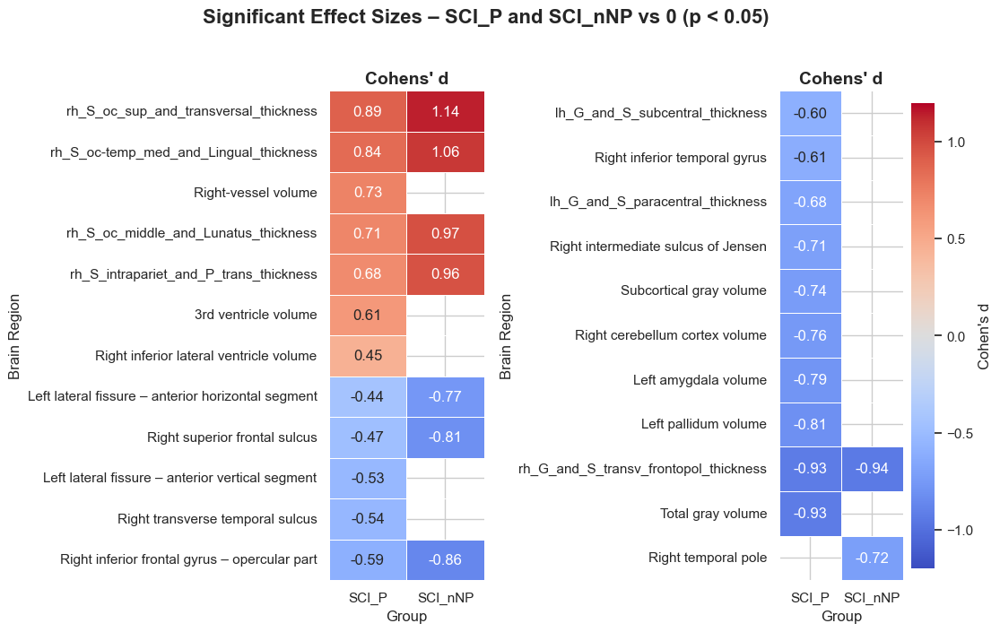

In [31]:
import math
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 📥 Datei laden
df = pd.read_excel(
    "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/GroupComarpison_SignificantRegionsOnly.xlsx"
)

df["Region"] = (
    df["Region"]
    .str.replace("&", "_and_", regex=False)
    .str.replace("__", "_", regex=False)
    .str.strip()
    .replace(region_name_map)
)

df["Region"] = df["Region"].replace(region_name_map)

# 🔹 Nur SCI_P und SCI_nNP vs 0
df = df[(df["Comparison"] == "vs 0") & (df["Cohort"].isin(["SCI_P", "SCI_nNP"]))]

# 📊 Pivot-Tabellen
effect_matrix = df.pivot(index="Region", columns="Cohort", values="Effect Size")
pval_matrix = df.pivot(index="Region", columns="Cohort", values="p-value")

# 🧪 Signifikanzmaske
significance_mask = pval_matrix < 0.05
masked_effects = effect_matrix.where(significance_mask)

# 📏 Sortieren nach SCI_P
masked_effects = masked_effects.sort_values("SCI_P", ascending=False)

# 🔹 Split in 2 Hälften
n = len(masked_effects)
mid = math.ceil(n / 2)
chunks = [masked_effects.iloc[:mid], masked_effects.iloc[mid:]]

# 🔥 Plot: 2 Heatmaps nebeneinander
fig, axes = plt.subplots(1, 2, figsize=(11, 0.3 * n), sharex=True, sharey=False)

for i, chunk in enumerate(chunks):
    sns.heatmap(
        chunk,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        center=0,
        vmin=-1.2,
        vmax=1.2,
        linewidths=0.5,
        cbar=(i == 1),  # nur beim zweiten Plot
        cbar_kws={"label": "Cohen's d"} if i == 1 else None,
        mask=chunk.isnull(),
        ax=axes[i]
    )
    axes[i].set_title("Cohens' d", fontsize=14, weight="bold")
    axes[i].set_xlabel("Group")
    axes[i].set_ylabel("Brain Region")

# Gesamttitel
plt.suptitle("Significant Effect Sizes – SCI_P and SCI_nNP vs 0 (p < 0.05)", fontsize=16, weight="bold", y=1.02)
plt.tight_layout()
plt.show()


### Checking Regions

/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/468506876.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_plot, x="Cohort", y=residual_col, palette="pastel", fliersize=0)


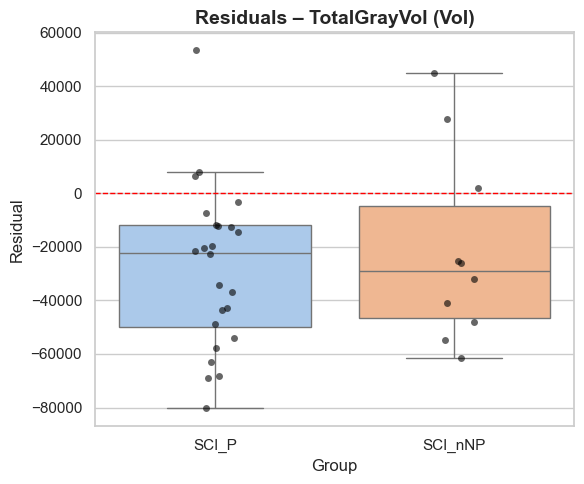

In [32]:
# Name der Residualspalte
region = "TotalGrayVol (Vol)"
residual_col = f"Residual_{region}"

# Filtere nur gültige Werte & Gruppen
df_plot = df_combined[["Cohort", residual_col]].dropna()

# Plot
plt.figure(figsize=(6, 5))
sns.boxplot(data=df_plot, x="Cohort", y=residual_col, palette="pastel", fliersize=0)
sns.stripplot(data=df_plot, x="Cohort", y=residual_col, color="black", alpha=0.6, jitter=True)
plt.axhline(0, color="red", linestyle="--", linewidth=1)
plt.title("Residuals – TotalGrayVol (Vol)", fontsize=14, fontweight="bold")
plt.ylabel("Residual")
plt.xlabel("Group")
plt.tight_layout()
plt.show()


In [33]:
group = df_combined[df_combined["Cohort"] == "SCI_nNP"]["Residual_rh_S_oc_sup&transversal_thickness"].dropna()
mean = group.mean()
std = group.std(ddof=1)
d = mean / std

print(f"Mittelwert: {mean:.4f}, SD: {std:.4f}, d: {d:.2f}")

Mittelwert: 0.0247, SD: 0.0218, d: 1.13


In [34]:
region_name_map = {
    "rh_S_oc_sup_and_transversal_thickness": "Right superior and transverse occipital sulcus",
    "rh_G_and_S_transv_frontopol_thickness": "Right transverse frontopolar gyrus and sulcus",
    "rh_S_oc-temp_med_and_Lingual_thickness": "Right medial occipito-temporal and lingual sulcus",
    "rh_S_oc_middle_and_Lunatus_thickness": "Right middle occipital and lunate sulcus",
    "rh_S_intrapariet_and_P_trans_thickness": "Right intraparietal and transverse parietal sulcus",
    "lh_G_and_S_paracentral_thickness": "Left paracentral gyrus and sulcus",
    "rh_G_front_inf-Opercular_thickness": "Right inferior frontal gyrus – opercular part",
    "rh_G_temporal_inf_thickness": "Right inferior temporal gyrus",
    "lh_Lat_Fis-ant-Vertical_thickness": "Left lateral fissure – anterior vertical segment",
    "rh_S_front_sup_thickness": "Right superior frontal sulcus",
    "lh_G_and_S_subcentral_thickness": "Left subcentral gyrus and sulcus",
    "rh_S_interm_prim-Jensen_thickness": "Right intermediate sulcus of Jensen",
    "lh_Lat_Fis-ant-Horizont_thickness": "Left lateral fissure – anterior horizontal segment",
    "rh_Pole_temporal_thickness": "Right temporal pole",
    "rh_S_temporal_transverse_thickness": "Right transverse temporal sulcus",
    "SubCortGrayVol (Vol)": "Subcortical gray volume",
    "TotalGrayVol (Vol)": "Total gray volume",
    "Right-Cerebellum-Cortex (Vol)": "Right cerebellum cortex volume",
    "Left-Pallidum (Vol)": "Left pallidum volume",
    "Left-Amygdala (Vol)": "Left amygdala volume",
    "3rd-Ventricle (Vol)": "3rd ventricle volume",
    "Right-Inf-Lat-Vent (Vol)": "Right inferior lateral ventricle volume",
    "Right-vessel (Vol)": "Right-vessel volume"
}


# MAX PAIN For the significant Regions

✅ Correlation results (all SCI) saved as 'Correlation_Residuals_Pain.xlsx'


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2953859271.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sig_corr["Region_pretty"] = df_sig_corr["Region_key"].map(region_name_map)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2953859271.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sig_corr["Region_pretty"] = df_sig_corr["Region_pretty"].fillna(df_sig_corr["Region"])  # fallback


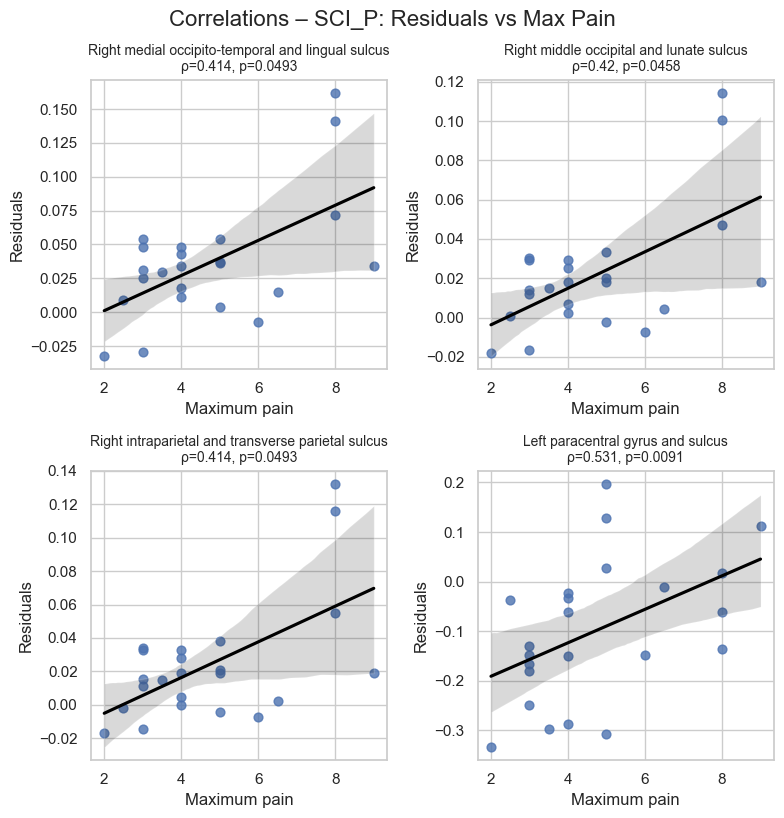

In [44]:
# Lade signifikante Regionen aus der Analyse 1 (mit FDR)
df_sig = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx")

# Filtere auf signifikante Regionen
significant_regions = df_sig[df_sig["p-value (FDR)"] < 0.05]["Region"].tolist()

correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_sci_only = df_combined[df_combined["Cohort"] == "SCI_P"]

# 🔍 Nur Regionen verwenden, die zuvor signifikant waren
for region in significant_regions:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "max_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["max_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)
# Normalisiere Regionennamen wie im Mapping (für Mapping-Vergleich!)
results_df_all["Region_key"] = (
    results_df_all["Region"]
    .str.replace("&", "_and_", regex=False)
    .str.replace("__", "_", regex=False)
    .str.strip()
)
# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_MAXPain_Signficant_Regions.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results (all SCI) saved as 'Correlation_Residuals_Pain.xlsx'")


# Filtere nur signifikante Korrelationen (z. B. p < 0.05)
df_sig_corr = results_df_all[results_df_all["p-value"] < 0.05]
# Normalisierte Region-Namen zum Mapping (ersetze & durch _and_, entferne Leerzeichen etc.)

df_sig_corr["Region_pretty"] = df_sig_corr["Region_key"].map(region_name_map)
df_sig_corr["Region_pretty"] = df_sig_corr["Region_pretty"].fillna(df_sig_corr["Region"])  # fallback

# Bestimme Anzahl Subplots
num_plots = len(df_sig_corr)
cols = 2
rows = math.ceil(num_plots / cols)

# Setze Plot-Größe
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = axes.flatten()

# Plot pro signifikanter Region
for i, (_, row) in enumerate(df_sig_corr.iterrows()):
    region = row["Region"]
    residual_col = f"Residual_{region}"

    # Hole die Daten nochmal aus df_sci_only
    data = df_sci_only[[residual_col, "max_pain"]].dropna()

    sns.regplot(
        y=residual_col,
        x="max_pain",
        data=data,
        ax=axes[i],
        scatter_kws={'s': 40, 'alpha': 0.8},
        line_kws={'color': 'black'}
    )
    pretty_name = row["Region_pretty"]
    axes[i].set_title(f"{pretty_name}\nρ={row['Spearman ρ']}, p={row['p-value']}", fontsize=10)
    axes[i].set_xlabel("Maximum pain")
    axes[i].set_ylabel("Residuals")

# Entferne leere Subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Correlations – SCI_P: Residuals vs Max Pain", fontsize=16, y=1.02)
plt.show()


In [36]:
# 🔹 Regionen, die du vergleichen willst
regionen = [
    "rh_S_oc-temp_med&Lingual_thickness",
    "rh_S_intrapariet&P_trans_thickness"
]

# 🔹 Residual-Spaltennamen
residual_cols = [f"Residual_{r}" for r in regionen]

# 🔹 Spalten, die wir extrahieren wollen
columns_to_extract = residual_cols + ["max_pain"]

# 🔹 Optional: Subject-ID hinzufügen, falls vorhanden
if "Subject" in df_sci_only.columns:
    columns_to_extract = ["Subject"] + columns_to_extract

# 🔹 Daten extrahieren
vergleich_df = df_sci_only[columns_to_extract].copy()

# 🔹 Nach Max Pain sortieren
vergleich_df = vergleich_df.sort_values("max_pain", ascending=False)

# 🔹 Werte runden für bessere Übersicht
vergleich_df = vergleich_df.round(5)

# 🔹 Tabelle anzeigen
import pandas as pd
from IPython.display import display
display(vergleich_df)


,Residual_rh_S_oc-temp_med&Lingual_thickness,Residual_rh_S_intrapariet&P_trans_thickness,max_pain
23,0.03388,0.01891,9.0
10,0.16214,0.13237,8.0
15,0.14114,0.11621,8.0
17,0.07155,0.05501,8.0
22,0.01469,0.00222,6.5
2,-0.00742,-0.00712,6.0
5,0.03691,0.01926,5.0
21,0.00346,-0.00451,5.0
20,0.05378,0.03797,5.0
0,0.03614,0.02104,5.0


✅ Correlation results (all SCI) saved as 'Correlation_Residuals_Pain.xlsx'


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/4192332580.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sig_corr["Region_key"] = (
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/4192332580.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sig_corr["Region_pretty"] = df_sig_corr["Region_key"].map(region_name_map)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/4192332580.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of 

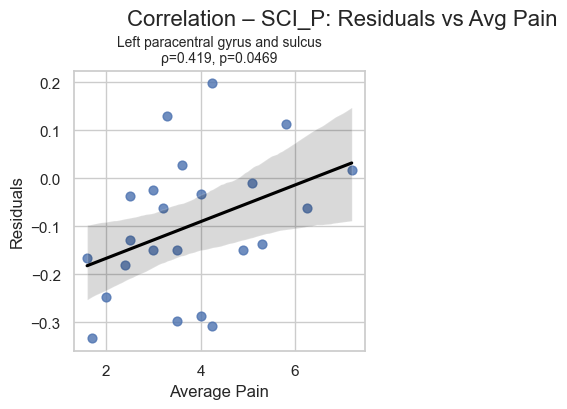

In [41]:
# Lade signifikante Regionen aus der Analyse 1 (mit FDR)
df_sig = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx")

# Filtere auf signifikante Regionen
significant_regions = df_sig[df_sig["p-value (FDR)"] < 0.05]["Region"].tolist()

correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"] == "SCI_P"]

# 🔍 Nur Regionen verwenden, die zuvor signifikant waren
for region in significant_regions:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "avg_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["avg_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_AvgPain_Signficant_Regions.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results (all SCI) saved as 'Correlation_Residuals_Pain.xlsx'")



# Filtere nur signifikante Korrelationen (z. B. p < 0.05)
df_sig_corr = results_df_all[results_df_all["p-value"] < 0.05]
# Normalisierte Region-Namen zum Mapping (ersetze & durch _and_, entferne Leerzeichen etc.)
df_sig_corr["Region_key"] = (
    df_sig_corr["Region"]
    .str.replace("&", "_and_", regex=False)
    .str.replace("__", "_", regex=False)
    .str.strip()
)
df_sig_corr["Region_pretty"] = df_sig_corr["Region_key"].map(region_name_map)
df_sig_corr["Region_pretty"] = df_sig_corr["Region_pretty"].fillna(df_sig_corr["Region"])  # fallback

# Bestimme Anzahl Subplots
num_plots = len(df_sig_corr)
cols = 2
rows = math.ceil(num_plots / cols)

# Setze Plot-Größe
fig, axes = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 4))
axes = axes.flatten()

# Plot pro signifikanter Region
for i, (_, row) in enumerate(df_sig_corr.iterrows()):
    region = row["Region"]
    residual_col = f"Residual_{region}"

    # Hole die Daten nochmal aus df_sci_only
    data = df_sci_only[[residual_col, "avg_pain"]].dropna()

    sns.regplot(
        y=residual_col,
        x="avg_pain",
        data=data,
        ax=axes[i],
        scatter_kws={'s': 40, 'alpha': 0.8},
        line_kws={'color': 'black'}
    )
    pretty_name = row["Region_pretty"]
    axes[i].set_title(f"{pretty_name}\nρ={row['Spearman ρ']}, p={row['p-value']}", fontsize=10)
    axes[i].set_xlabel("Average Pain")
    axes[i].set_ylabel("Residuals")

# Entferne leere Subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Correlation – SCI_P: Residuals vs Avg Pain", fontsize=16, y=1.02)
plt.show()

✅ Correlation results (all SCI) saved as 'Correlation_Residuals_Pain.xlsx'


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1484617218.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sig_corr["Region_key"] = (
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1484617218.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sig_corr["Region_pretty"] = df_sig_corr["Region_key"].map(region_name_map)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/1484617218.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of 

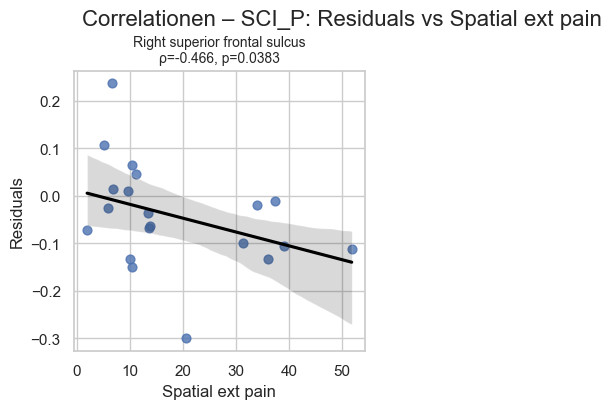

In [42]:
# Lade signifikante Regionen aus der Analyse 1 (mit FDR)
df_sig = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx")

# Filtere auf signifikante Regionen
significant_regions = df_sig[df_sig["p-value (FDR)"] < 0.05]["Region"].tolist()

correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"] == "SCI_P"]

# 🔍 Nur Regionen verwenden, die zuvor signifikant waren
for region in significant_regions:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "spatial_ext_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["spatial_ext_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_SpatialPain_Signficant_Regions.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results (all SCI) saved as 'Correlation_Residuals_Pain.xlsx'")


# Filtere nur signifikante Korrelationen (z. B. p < 0.05)
df_sig_corr = results_df_all[results_df_all["p-value"] < 0.05]
# Normalisierte Region-Namen zum Mapping (ersetze & durch _and_, entferne Leerzeichen etc.)
df_sig_corr["Region_key"] = (
    df_sig_corr["Region"]
    .str.replace("&", "_and_", regex=False)
    .str.replace("__", "_", regex=False)
    .str.strip()
)
df_sig_corr["Region_pretty"] = df_sig_corr["Region_key"].map(region_name_map)
df_sig_corr["Region_pretty"] = df_sig_corr["Region_pretty"].fillna(df_sig_corr["Region"])  # fallback

# Bestimme Anzahl Subplots
num_plots = len(df_sig_corr)
cols = 2
rows = math.ceil(num_plots / cols)

# Setze Plot-Größe
fig, axes = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 4))
axes = axes.flatten()

# Plot pro signifikanter Region
for i, (_, row) in enumerate(df_sig_corr.iterrows()):
    region = row["Region"]
    residual_col = f"Residual_{region}"

    # Hole die Daten nochmal aus df_sci_only
    data = df_sci_only[[residual_col, "spatial_ext_pain"]].dropna()

    sns.regplot(
        y=residual_col,
        x="spatial_ext_pain",
        data=data,
        ax=axes[i],
        scatter_kws={'s': 40, 'alpha': 0.8},
        line_kws={'color': 'black'}
    )
    pretty_name = row["Region_pretty"]
    axes[i].set_title(f"{pretty_name}\nρ={row['Spearman ρ']}, p={row['p-value']}", fontsize=10)
    axes[i].set_xlabel("Spatial ext pain")
    axes[i].set_ylabel("Residuals")

# Entferne leere Subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Correlationen – SCI_P: Residuals vs Spatial ext pain", fontsize=16, y=1.02)
plt.show()


In [39]:
df_sig = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison_t-test_FDR.xlsx")

# Filtere auf signifikante Regionen
significant_regions = df_sig[df_sig["p-value (FDR)"] < 0.05]["Region"].tolist()

correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"] == "SCI_P"]

# 🔍 Nur Regionen verwenden, die zuvor signifikant waren
for region in significant_regions:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "BDI"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["BDI"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_BDI_SIG_Region.xlsx"

results_df_all.to_excel(output_path_all, index=False)
# Filtere nur signifikante Korrelationen (z. B. p < 0.05)

df_sig_corr = results_df_all[results_df_all["p-value"] < 0.05]

# Normalisierte Region-Namen zum Mapping (ersetze & durch _and_, entferne Leerzeichen etc.)
df_sig_corr["Region_key"] = (
    df_sig_corr["Region"]
    .str.replace("&", "_and_", regex=False)
    .str.replace("__", "_", regex=False)
    .str.strip()
)
df_sig_corr["Region_pretty"] = df_sig_corr["Region_key"].map(region_name_map)
df_sig_corr["Region_pretty"] = df_sig_corr["Region_pretty"].fillna(df_sig_corr["Region"])  # fallback

# Bestimme Anzahl Subplots
num_plots = len(df_sig_corr)
cols = 2
rows = math.ceil(num_plots / cols)

# Setze Plot-Größe
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = axes.flatten()

# Plot pro signifikanter Region
for i, (_, row) in enumerate(df_sig_corr.iterrows()):
    region = row["Region"]
    residual_col = f"Residual_{region}"

    # Hole die Daten nochmal aus df_sci_only
    data = df_sci_only[[residual_col, "BDI"]].dropna()

    sns.regplot(
        y=residual_col,
        x="BDI",
        data=data,
        ax=axes[i],
        scatter_kws={'s': 40, 'alpha': 0.8},
        line_kws={'color': 'black'}
    )
    pretty_name = row["Region_pretty"]
    axes[i].set_title(f"{pretty_name}\nρ={row['Spearman ρ']}, p={row['p-value']}", fontsize=10)
    axes[i].set_xlabel("BDI")
    axes[i].set_ylabel("Resiudals")

# Entferne leere Subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Significant Correlations– SCI_P: Residuals vs BDI", fontsize=16, y=1.02)
plt.show()



/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2300312799.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sig_corr["Region_key"] = (
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2300312799.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sig_corr["Region_pretty"] = df_sig_corr["Region_key"].map(region_name_map)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4963/2300312799.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of 

KeyboardInterrupt: 

# Chronological vs Age at injury:

## Males

KeyboardInterrupt: 

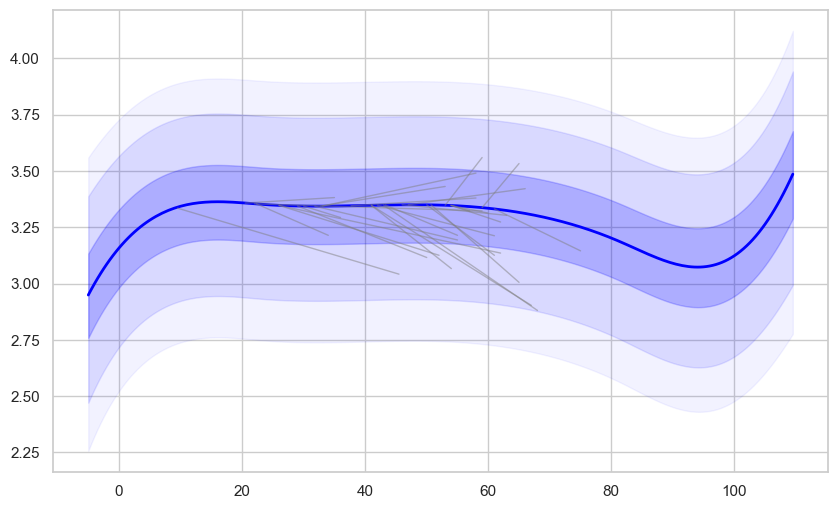

In [36]:
# Loop through all matched regions
for region, norm_region_col in region_mapping.items():
    if region not in df_males.columns or norm_region_col not in df_norm_males.columns:
        continue

    # Only keep male SCI subjects with all necessary values
    df_males_sci = df_males[
        (df_males["Sex"] == "Male") &
        (df_males["Cohort"].isin(["SCI_P", "SCI_nNP"])) &
        (df_males[region].notna()) &
        (df_males["Age"].notna()) &
        (df_males["Time since SCI (years) "].notna())
    ].copy()

    # Calculate Age at Injury
    df_males_sci["Age_at_injury"] = df_males_sci["Age"] - df_males_sci["Time since SCI (years) "]

    # Interpolate normative value at age of injury (rounded down to 0.5 steps)
    df_males_sci["Rounded_Injury_Age"] = np.floor(df_males_sci["Age_at_injury"] * 2) / 2
    df_males_sci["Rounded_Scan_Age"] = np.floor(df_males_sci["Age"] * 2) / 2

    df_males_sci["Normative_at_injury"] = np.interp(
        df_males_sci["Rounded_Injury_Age"],
        df_norm_males["age"],
        df_norm_males[norm_region_col]
    )

    # Set up plot
    plt.figure(figsize=(10, 6))
    sns.set(style="whitegrid")

    # Perzentil-Spaltennamen generieren
    p25_lower = norm_region_col.replace("_median", "_pr_int_25_lower")
    p25_upper = norm_region_col.replace("_median", "_pr_int_25_upper")
    p95_lower = norm_region_col.replace("_median", "_pr_int_95_lower")
    p95_upper = norm_region_col.replace("_median", "_pr_int_95_upper")
    p99_lower = norm_region_col.replace("_median", "_pr_int_99_lower")
    p99_upper = norm_region_col.replace("_median", "_pr_int_99_upper")
    plt.fill_between(df_norm_males["age"], df_norm_males[p25_lower], df_norm_males[p25_upper],
                     color="blue", alpha=0.2)
    plt.fill_between(df_norm_males["age"], df_norm_males[p95_lower], df_norm_males[p95_upper],
                     color="blue", alpha=0.1)
    plt.fill_between(df_norm_males["age"], df_norm_males[p99_lower], df_norm_males[p99_upper],
                     color="blue", alpha=0.05)
    plt.plot(df_norm_males["age"], df_norm_males[norm_region_col], color="blue", linewidth=2)

    # Plot connection lines (injury → scan)
    for _, row in df_males_sci.iterrows():
        plt.plot(
            [row["Age_at_injury"], row["Age"]],
            [row["Normative_at_injury"], row[region]],
            color="gray", alpha=0.5, linewidth=1
        )

    # Plot points
    plt.scatter(df_males_sci["Age"], df_males_sci[region], color="red", label="Observed (Scan Age)", alpha=0.8)
    plt.scatter(df_males_sci["Age_at_injury"], df_males_sci["Normative_at_injury"], color="blue", label="Normative (At Injury Age)", alpha=0.8)

    # Labels and legend
    plt.xlabel("Age", fontsize=14, fontweight="bold")
    plt.ylabel(region.replace("_", " "), fontsize=14, fontweight="bold")
    plt.title(f"{region.replace('_', ' ')} – Observed vs. Normative at Injury Age (Males)", fontsize=16, fontweight="bold")
    plt.legend()
    plt.xlim(0, 100)
    plt.tight_layout()
    plt.close()

## Females

In [48]:
# Loop through all matched regions
for region, norm_region_col in region_mapping.items():
    if region not in df_females.columns or norm_region_col not in df_norm_males.columns:
        continue

    # Only keep male SCI subjects with all necessary values
    df_females_sci = df_females[
        (df_females["Sex"] == "Female") &
        (df_females["Cohort"].isin(["SCI_P", "SCI_nNP"])) &
        (df_females[region].notna()) &
        (df_females["Age"].notna()) &
        (df_females["Time since SCI (years) "].notna())
    ].copy()

    # Calculate Age at Injury
    df_females_sci["Age_at_injury"] = df_females_sci["Age"] - df_females_sci["Time since SCI (years) "]

    # Interpolate normative value at age of injury (rounded down to 0.5 steps)
    df_females_sci["Rounded_Injury_Age"] = np.floor(df_females_sci["Age_at_injury"] * 2) / 2
    df_females_sci["Rounded_Scan_Age"] = np.floor(df_females_sci["Age"] * 2) / 2

    df_females_sci["Normative_at_injury"] = np.interp(
        df_females_sci["Rounded_Injury_Age"],
        df_norm_females["age"],
        df_norm_females[norm_region_col]
    )

    # Set up plot
    plt.figure(figsize=(10, 6))
    sns.set(style="whitegrid")

    # Perzentil-Spaltennamen generieren
    p25_lower = norm_region_col.replace("_median", "_pr_int_25_lower")
    p25_upper = norm_region_col.replace("_median", "_pr_int_25_upper")
    p95_lower = norm_region_col.replace("_median", "_pr_int_95_lower")
    p95_upper = norm_region_col.replace("_median", "_pr_int_95_upper")
    p99_lower = norm_region_col.replace("_median", "_pr_int_99_lower")
    p99_upper = norm_region_col.replace("_median", "_pr_int_99_upper")
    plt.fill_between(df_norm_females["age"], df_norm_females[p25_lower], df_norm_females[p25_upper],
                     color="red", alpha=0.2)
    plt.fill_between(df_norm_females["age"], df_norm_females[p95_lower], df_norm_females[p95_upper],
                     color="red", alpha=0.1)
    plt.fill_between(df_norm_females["age"], df_norm_females[p99_lower], df_norm_females[p99_upper],
                     color="red", alpha=0.05)
    plt.plot(df_norm_females["age"], df_norm_females[norm_region_col], color="red", linewidth=2)

    # Plot connection lines (injury → scan)
    for _, row in df_females_sci.iterrows():
        plt.plot(
            [row["Age_at_injury"], row["Age"]],
            [row["Normative_at_injury"], row[region]],
            color="gray", alpha=0.5, linewidth=1
        )

    # Plot points
    plt.scatter(df_females_sci["Age"], df_females_sci[region], color="red", label="Observed (Scan Age)", alpha=0.8)
    plt.scatter(df_females_sci["Age_at_injury"], df_females_sci["Normative_at_injury"], color="blue", label="Normative (At Injury Age)", alpha=0.8)

    # Labels and legend
    plt.xlabel("Age", fontsize=14, fontweight="bold")
    plt.ylabel(region.replace("_", " "), fontsize=14, fontweight="bold")
    plt.title(f"{region.replace('_', ' ')} – Observed vs. Normative at Injury Age (Females)", fontsize=16, fontweight="bold")
    plt.legend()
    plt.xlim(0, 100)
    plt.tight_layout()
    plt.close()

### Residuals along the chronological age

In [50]:
from scipy.stats import spearmanr
import pandas as pd

all_cohorts = ["SCI_nNP", "SCI_P"]
correlation_results = []

# Schleife über alle Regionen aus deiner ANOVA-Datei
for region in region_mapping.keys():
    residual_col = f"Residual_{region}"

    if residual_col not in df_combined.columns:
        continue  # Skip, falls Spalte nicht existiert

    for cohort in all_cohorts:
        cohort_data = df_combined[df_combined["Cohort"] == cohort][[residual_col, "Age"]].dropna()

        if not cohort_data.empty:
            rho, p = spearmanr(cohort_data[residual_col], cohort_data["Age"])
            correlation_results.append({
                "Region": region,
                "Cohort": cohort,
                "Spearman ρ": round(rho, 3),
                "p-value": round(p, 4),
                "n": len(cohort_data)
            })

# Speichern
df_age_corr = pd.DataFrame(correlation_results)
df_age_corr.to_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Res_along_ChronologicalAge.xlsx", index=False)
print("✅ Age-based correlation file saved.")


✅ Age-based correlation file saved.


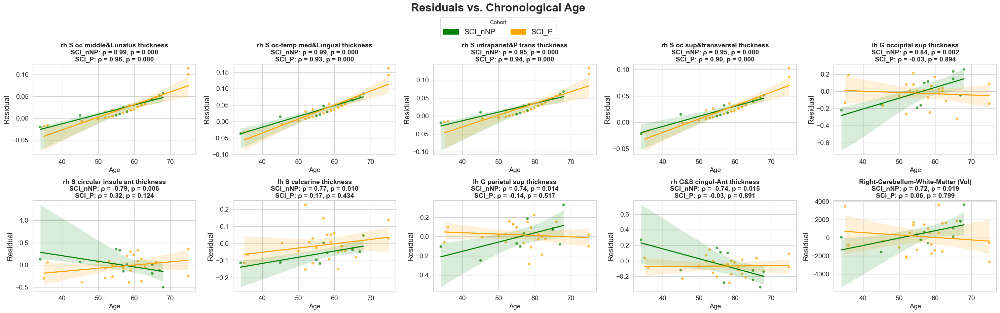

These regions are not in ANOVA and should not appear:
[]


In [51]:
from matplotlib.patches import Patch

# Farbdefinition
cohort_colors = {
    "SCI_nNP": "green",
    "SCI_P": "orange"
}
cohort_order = ["SCI_nNP", "SCI_P"]

# Normalized regions for safer matching
valid_regions = set(anova_df_combined["Region"].str.strip().str.lower())
df_age_corr["region_clean"] = df_age_corr["Region"].str.strip().str.lower()

# Filter only if region_clean is in valid_regions
significant_age_corr = df_age_corr[
    (df_age_corr["p-value"] < 0.05) &
    (df_age_corr["region_clean"].isin(valid_regions))
].copy()

significant_age_corr["abs_rho"] = significant_age_corr["Spearman ρ"].abs()
top10_regions = (
    significant_age_corr
    .sort_values("abs_rho", ascending=False)
    .drop_duplicates("Region")  # Keep original name for plotting
    .head(10)
)["Region"].tolist()



# Plot Grid
n_cols = 5
n_rows = (len(top10_regions) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, region in enumerate(top10_regions):
    ax = axes[i]
    residual_col = f"Residual_{region}"

    if residual_col not in df_combined.columns:
        ax.set_visible(False)
        continue

    # Daten für Scatter
    plot_data = df_combined[df_combined["Cohort"].isin(cohort_order)][
        [residual_col, "Age", "Cohort"]
    ].dropna()

    # Scatterplot
    sns.scatterplot(
        data=plot_data,
        x="Age",
        y=residual_col,
        hue="Cohort",
        palette=cohort_colors,
        alpha=0.7,
        ax=ax,
        legend=False
    )

    # Regression + Statistik sammeln
    title_lines = [region.replace("_", " ")]
    for cohort in cohort_order:
        cohort_data = plot_data[plot_data["Cohort"] == cohort]
        if not cohort_data.empty:
            sns.regplot(
                data=cohort_data,
                x="Age",
                y=residual_col,
                scatter=False,
                color=cohort_colors[cohort],
                ci=95,
                ax=ax
            )

            # Spearman Werte aus df_age_corr holen
            row = df_age_corr[
                (df_age_corr["Region"] == region) &
                (df_age_corr["Cohort"] == cohort)
            ]
            if not row.empty:
                rho = row["Spearman ρ"].values[0]
                p_val = row["p-value"].values[0]
                title_lines.append(f"{cohort}: ρ = {rho:.2f}, p = {p_val:.3f}")

    ax.set_title("\n".join(title_lines), fontsize=14, fontweight="bold")
    ax.set_xlabel("Age", fontsize=14)
    ax.set_ylabel("Residual", fontsize=16)
    ax.tick_params(labelsize=14)

# Überflüssige Achsen entfernen
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Legende unterhalb Haupttitel
legend_patches = [Patch(color=cohort_colors[c], label=c) for c in cohort_order]
plt.subplots_adjust(top=0.88)
fig.legend(handles=legend_patches, loc="upper center", ncol=3, fontsize=16, title="Cohort", bbox_to_anchor=(0.5, 0.90))
plt.suptitle("Residuals vs. Chronological Age", fontsize=24, fontweight="bold", y=0.93)

plt.tight_layout(rect=[0, 0, 1, 0.88])
plt.show()
print("These regions are not in ANOVA and should not appear:")
print(df_age_corr[~df_age_corr["region_clean"].isin(valid_regions)]["Region"].unique())


In [150]:
df_combined["Age_Group"] = np.where(df_combined["Age"] <= df_combined["Age"].median(), "younger", "older")
print(df)

    subject  SubjectID        Age   Cohort     Sex AIS   NLI  avg_pain  \
0    Sub_47         47  59.871233    SCI_P    Male   B    L1      3.30   
1    Sub_48         48  58.526027    SCI_P  Female   D    T8      2.00   
2    Sub_49         49  45.484932    SCI_P    Male   A   NaN      4.90   
3    Sub_53         53  61.000000    SCI_P    Male   D    L1       NaN   
4   sub-167        167  52.000000    SCI_P    Male   A   Th3      2.50   
5   sub-168        168  54.000000    SCI_P  Female   D   Th5      4.25   
6   sub-169        169  52.000000    SCI_P  Female   A  Th10      2.50   
7   sub-170        170  55.000000    SCI_P    Male   A   Th1      4.00   
8   sub-171        171  35.000000    SCI_P    Male   C  Th11      1.70   
9   sub-172        172  53.000000    SCI_P    Male   A   Th5      3.20   
10  sub-173        173  75.000000    SCI_P  Female   A  Th10      7.20   
11  sub-174        174  59.000000    SCI_P    Male   D  Th12      3.00   
12  sub-175        175  58.000000    S

/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_2526/3881276908.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_combined["Age_Group"] = np.where(df_combined["Age"] <= df_combined["Age"].median(), "younger", "older")


# Short time since injury vs long time since injury



In [52]:

median_tsi = df_combined["Time since SCI (years) "].median()

# InjuryGroup-Spalte hinzufügen (Short vs Long TSI)
df_combined["InjuryGroup"] = np.where(
    df_combined["Time since SCI (years) "] <= median_tsi,
    "Short_TSI",
    "Long_TSI"
)
print(median_tsi)

14.4


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/2173200545.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_combined["InjuryGroup"] = np.where(


## Statistical File (for Females and Males)

In [53]:
def cliffs_delta(x, y):
    """Compute Cliff's delta effect size."""
    n_x = len(x)
    n_y = len(y)
    total = 0
    for xi in x:
        for yj in y:
            if xi > yj:
                total += 1
            elif xi < yj:
                total -= 1
    return total / (n_x * n_y)

# Step 1: Filter SCI participants
df_sci = df_combined[
    df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"]) &
    df_combined["Time since SCI (years) "].notna()
].copy()

# Step 2: Median split
median_split = df_sci["Time since SCI (years) "].median()
df_sci["InjuryGroup"] = np.where(df_sci["Time since SCI (years) "] <= median_split, "Short_TSI", "Long_TSI")

# Step 3: Statistical comparison
results = []

for col in df_sci.columns:
    if col.startswith("Residual_"):
        short_group = df_sci[df_sci["InjuryGroup"] == "Short_TSI"][col].dropna()
        long_group = df_sci[df_sci["InjuryGroup"] == "Long_TSI"][col].dropna()

        if len(short_group) > 2 and len(long_group) > 2:
            region = col.replace("Residual_", "")
            normal = df_normality.loc[df_normality["Region"] == region, "Normal_Distribution"].values[0]

            if normal:
                # Welch's t-test
                stat, p_val = ttest_ind(short_group, long_group, equal_var=False)
                test_used = "t-test"
                pooled_std = np.sqrt((short_group.var(ddof=1) + long_group.var(ddof=1)) / 2)
                cohen_d = (short_group.mean() - long_group.mean()) / pooled_std if pooled_std != 0 else np.nan
                effect_size = cohen_d
                effect_label = "Cohen's d"
            else:
                # Mann-Whitney U + Cliff's delta
                stat, p_val = mannwhitneyu(short_group, long_group, alternative="two-sided")
                test_used = "Mann-Whitney U"
                cliffs_d = cliffs_delta(short_group.values, long_group.values)
                effect_size = cliffs_d
                effect_label = "Cliff's δ"

            results.append({
                "Region": region,
                "Test": test_used,
                "Statistic": round(stat, 3),
                "p-value": round(p_val, 4),
                "Effect size": round(effect_size, 3),
                "Effect size type": effect_label,
                "Mean Short TSI": short_group.mean(),
                "Mean Long TSI": long_group.mean(),
                "n Short": len(short_group),
                "n Long": len(long_group)
            })


# Step 4: Save
results_df = pd.DataFrame(results).sort_values("p-value")
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_TSI_Comparison_SCI.xlsx"
results_df.to_excel(output_path, index=False)

print(f"✅ Results with Cliff's delta saved to: {output_path}")

✅ Results with Cliff's delta saved to: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_TSI_Comparison_SCI.xlsx


## Regions with significant difference between Short TSI and Long TSI

In [54]:
TSI_Split=output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_TSI_Comparison_SCI.xlsx"
df_tsi_split=pd.read_excel(TSI_Split)


In [55]:
### Überprüfung
region = "lh_S_front_inf_thickness"
norm_region_col = "lh_S_front_inf_thickness_median"

# Beispielperson aus dem DataFrame
person = df_combined[(df_combined["Sex"] == "Male") & df_combined[region].notna()].iloc[0]

# Alter runden (wie im Code)
rounded_age = np.floor(person["Age"] * 2) / 2

# Normwert mit Interpolation holen
norm_value = np.interp(rounded_age, df_norm_males["age"], df_norm_males[norm_region_col])

# Residual selbst berechnen
residual_manual = person[region] - norm_value

# Residual aus DataFrame
residual_df = person[f"Residual_{region}"]

print("Alter:", person["Age"])
print("Gerundetes Alter:", rounded_age)
print("Beobachteter Wert:", person[region])
print("Interpolierter Normwert:", norm_value)
print("Manuell berechneter Residual:", residual_manual)
print("Residual im DataFrame:", residual_df)

Alter: 59.87123288
Gerundetes Alter: 59.5
Beobachteter Wert: 2.25616478
Interpolierter Normwert: 2.223056078759044
Manuell berechneter Residual: 0.03310870124095633
Residual im DataFrame: 0.03310870124095633


In [56]:
# Signifikante Regionen (z.B. p < 0.05)
significant_df = df_tsi_split[df_tsi_split["p-value"] < 0.05].copy()
print(f"✅ {len(significant_df)} Regionen mit signifikantem Unterschied gefunden!")


✅ 4 Regionen mit signifikantem Unterschied gefunden!


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/1786166571.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/1786166571.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/1786166571.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/1786166571.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and w

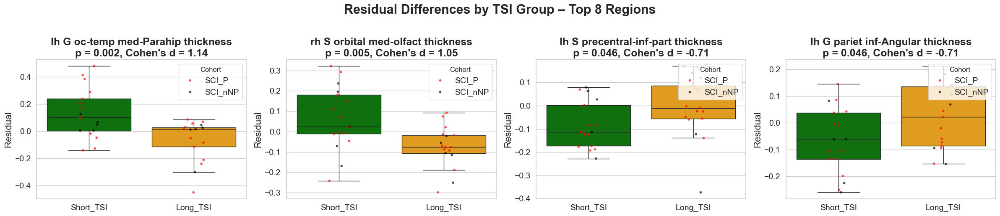

In [57]:
# Farben definieren
box_colors = {"Short_TSI": "green", "Long_TSI": "orange"}  # Hellgrün & Hellrot
dot_colors = {"SCI_P": "red", "SCI_nNP": "black"}

# Signifikante Regionen (p < 0.05) aus sortierter Tabelle
top_regions = df_tsi_split[df_tsi_split["p-value"] < 0.05].sort_values("p-value")
n_regions = len(top_regions)
n_cols = 4
n_rows = (n_regions + n_cols - 1) // n_cols  # Rundet auf

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

for i, row in enumerate(top_regions.itertuples()):
    region = row.Region
    residual_col = f"Residual_{region}"

    if residual_col not in df_combined.columns:
        continue

    # Filter auf SCI-only mit Cohort- und InjuryGroup-Angabe
    data = df_combined[
        df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])
        & df_combined["InjuryGroup"].isin(["Short_TSI", "Long_TSI"])
    ].dropna(subset=[residual_col])

    ax = axes[i]

    # Boxplot (InjuryGroup)
    sns.boxplot(
        x="InjuryGroup", y=residual_col, data=data,showfliers=False,
        palette=box_colors, ax=ax
    )

    # Stripplot mit Cohort-Farben
    sns.stripplot(
        x="InjuryGroup", y=residual_col, data=data,
        hue="Cohort", palette=dot_colors,
        dodge=False, alpha=0.7, size=4, jitter=True,
        ax=ax, linewidth=0
    )

    # Plot-Titel inkl. p-Wert & Effektstärke
    effect_type = row._6 if "Effect size type" in df_tsi_split.columns else "d/rb"
    ax.set_title(
        f"{region.replace('_', ' ')}\np = {row._4:.3f}, {effect_type} = {row._5:.2f}",
        fontsize=18, fontweight="bold"
    )

    ax.set_xlabel("", fontsize=16)
    ax.set_ylabel("Residual", fontsize=16)
    axes[i].tick_params(axis='x', labelsize=14)  # Größe der x-Achsen-Ticks
    axes[i].tick_params(axis='y', labelsize=14)

    # Legende nur im ersten Subplot anzeigen

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels, title="Cohort", loc="upper right", fontsize=14)


# Unbenutzte Achsen entfernen
for j in range(len(top_regions), len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Residual Differences by TSI Group – Top 8 Regions", fontsize=22, fontweight="bold", y=1.03)
plt.tight_layout()
plt.show()


### Why median?



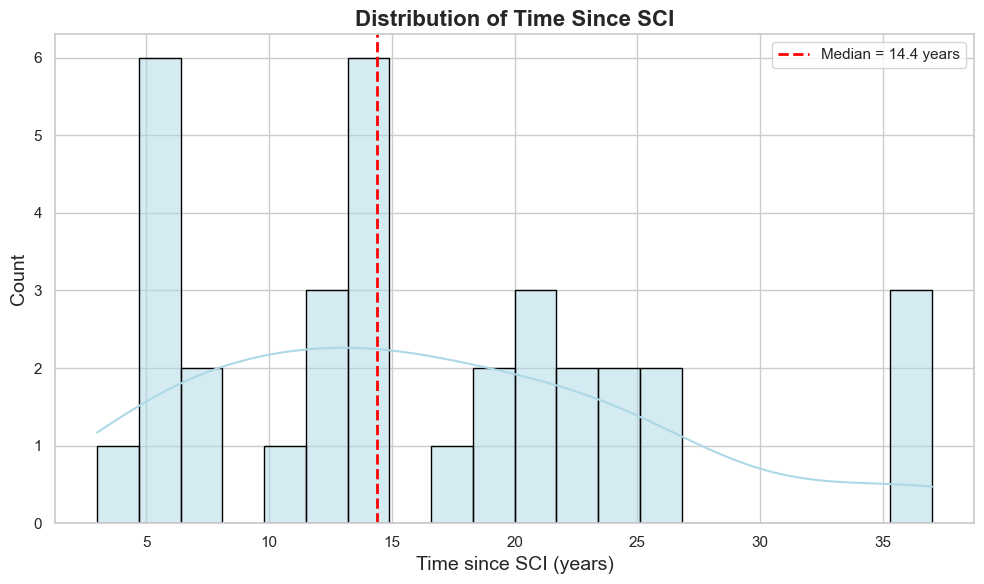

In [58]:
# Sicherstellen, dass Spaltenname passt
tsi_col = "Time since SCI (years) "

# Filter auf SCI-Patient:innen
df_sci = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])].copy()

# Drop NaN
tsi_values = df_sci[tsi_col].dropna()

# Median berechnen
median_tsi = tsi_values.median()

# Plot
plt.figure(figsize=(10, 6))
sns.histplot(tsi_values, kde=True, bins=20, color="lightblue", edgecolor="black")

# Median-Linie
plt.axvline(median_tsi, color="red", linestyle="--", linewidth=2, label=f"Median = {median_tsi:.1f} years")

# Labels & Titel
plt.title("Distribution of Time Since SCI", fontsize=16, fontweight="bold")
plt.xlabel("Time since SCI (years)", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## Age at injury split: Early injury vs late injury


In [59]:
# Funktion für Cliff's Delta
def cliffs_delta(a, b):
    n_a, n_b = len(a), len(b)
    more = sum(x > y for x in a for y in b)
    less = sum(x < y for x in a for y in b)
    delta = (more - less) / (n_a * n_b)
    return delta

# Filter für SCI-Patient:innen mit gültigen Werten
df_sci = df_combined[
    df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"]) &
    df_combined["Time since SCI (years) "].notna() &
    df_combined["Age"].notna()
].copy()

# Berechne Age at Injury
df_sci["Age_at_injury"] = df_sci["Age"] - df_sci["Time since SCI (years) "]

# Median-Split
median_injury_age = df_sci["Age_at_injury"].median()
df_sci["InjuryAgeGroup"] = np.where(df_sci["Age_at_injury"] <= median_injury_age, "Early_Injury", "Late_Injury")

print(f"🔹 Median Age at Injury: {median_injury_age:.2f} years")

# Analyse starten
results = []

for col in df_sci.columns:
    if col.startswith("Residual_"):
        early = df_sci[df_sci["InjuryAgeGroup"] == "Early_Injury"][col].dropna()
        late = df_sci[df_sci["InjuryAgeGroup"] == "Late_Injury"][col].dropna()

        if len(early) > 2 and len(late) > 2:
            region = col.replace("Residual_", "")
            normal = df_normality.loc[df_normality["Region"] == region, "Normal_Distribution"].values[0]

            if normal:
                stat, p_val = ttest_ind(early, late, equal_var=False)
                test_used = "t-test"
                pooled_std = np.sqrt((early.var(ddof=1) + late.var(ddof=1)) / 2)
                mean_diff = early.mean() - late.mean()
                effect_size = mean_diff / pooled_std if pooled_std != 0 else np.nan
                effect_label = "Cohen's d"
            else:
                stat, p_val = mannwhitneyu(early, late, alternative='two-sided')
                test_used = "Mann-Whitney"
                effect_size = cliffs_delta(early.values, late.values)
                effect_label = "Cliff's δ"

            results.append({
                "Region": region,
                "Test": test_used,
                "Statistic": round(stat, 4),
                "p-value": round(p_val, 5),
                "Effect size": round(effect_size, 3) if not np.isnan(effect_size) else None,
                "Effect size type": effect_label,
                "Mean Early Injury": early.mean(),
                "Mean Late Injury": late.mean(),
                "n Early": len(early),
                "n Late": len(late)
            })

# Ergebnisse speichern
results_df = pd.DataFrame(results).sort_values("p-value")
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_AgeAtInjury_SCI.xlsx"
results_df.to_excel(output_path, index=False)

print(f"✅ Results with adaptive test selection saved to: {output_path}")

🔹 Median Age at Injury: 42.25 years
✅ Results with adaptive test selection saved to: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_AgeAtInjury_SCI.xlsx


🔍 Found 10 significant regions.


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/3352037474.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/3352037474.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/3352037474.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/3352037474.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and w

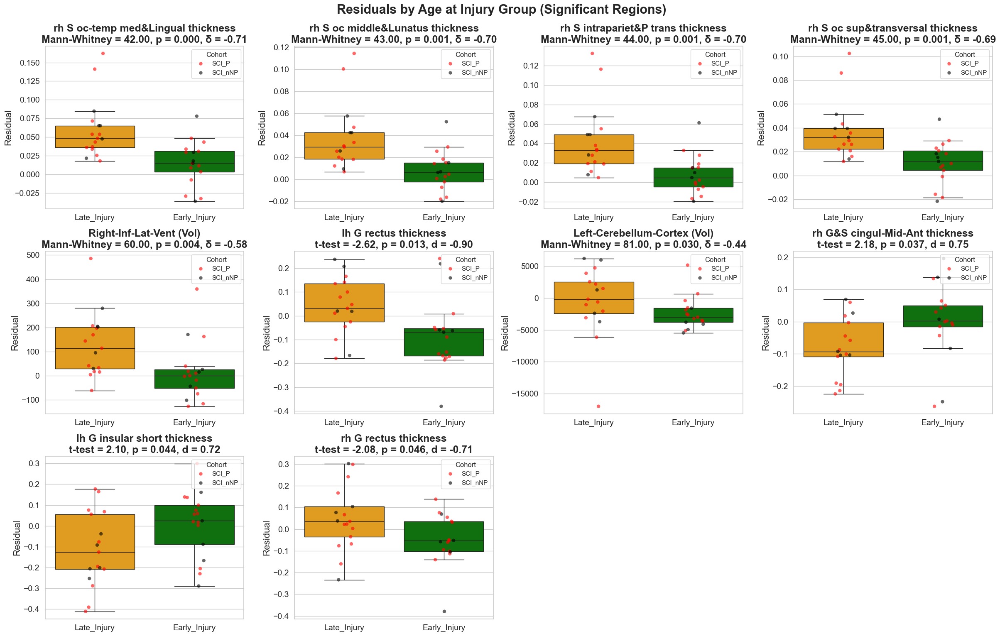

In [60]:
age_at_injury ="/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_AgeAtInjury_SCI.xlsx"
df_age_at_injury = pd.read_excel(age_at_injury)
point_colors = {"SCI_P": "red", "SCI_nNP": "black"}

# Farben definieren
point_colors = {"SCI_P": "red", "SCI_nNP": "black"}
color_map = {"Early_Injury": "green", "Late_Injury": "orange"}

# Nur signifikante Regionen auswählen
significant_df = df_age_at_injury[df_age_at_injury["p-value"] < 0.05].copy()
print(f"🔍 Found {len(significant_df)} significant regions.")

# Plot Layout
n = len(significant_df)
cols = 4
rows = (n // cols) + int(n % cols != 0)
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

# Plot pro Region
for i, row in enumerate(significant_df.itertuples()):
    region = row.Region
    residual_col = f"Residual_{region}"
    if residual_col not in df_sci.columns:
        continue

    data = df_sci[[residual_col, "InjuryAgeGroup", "Cohort"]].dropna()

    # Boxplot & Stripplot
    sns.boxplot(
        data=data,
        x="InjuryAgeGroup",
        y=residual_col,
        palette=color_map,
        showfliers=False,
        ax=axes[i]
    )
    sns.stripplot(
        data=data,
        x="InjuryAgeGroup",
        y=residual_col,
        hue="Cohort",
        palette=point_colors,
        dodge=False,
        size=6,
        alpha=0.6,
        jitter=True,
        ax=axes[i]
    )

    # Titel mit Test, p-Wert & Effektstärke
    test = row.Test
    stat = row.Statistic
    p_val = row._4  # oder: row._asdict()["p-value"]
    effect = row._5  # oder: row._asdict()["Effect size (Cohen's d or Cliff's δ)"]

    symbol = "d" if test == "t-test" else "δ"
    effect_str = f", {symbol} = {effect:.2f}" if pd.notna(effect) else ""

    axes[i].set_title(
        f"{region.replace('_', ' ')}\n{test} = {stat:.2f}, p = {p_val:.3f}{effect_str}",
        fontsize=18, fontweight="bold"
    )

    axes[i].set_xlabel("", fontsize=16)
    axes[i].set_ylabel("Residual", fontsize=16)
    axes[i].tick_params(axis='x', labelsize=14)  # Größe der x-Achsen-Ticks
    axes[i].tick_params(axis='y', labelsize=14)
    # Legende
    handles, labels = axes[i].get_legend_handles_labels()
    axes[i].legend(handles, labels, title="Cohort", loc="upper right")

# Unbenutzte Plots löschen
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Residuals by Age at Injury Group (Significant Regions)", fontsize=22, fontweight="bold", y=1.02)
plt.show()


### Four age groups

In [61]:
# Quartile-Split (nochmal sicherstellen)
df_sci["InjuryAgeQuartile"] = pd.qcut(
    df_sci["Age_at_injury"],
    q=4,
    labels=["Q1 (Youngest)", "Q2", "Q3", "Q4 (Oldest)"]
)

# Altersbereiche je Quartil anzeigen
quartile_summary = (
    df_sci.groupby("InjuryAgeQuartile")["Age_at_injury"]
    .agg(["count", "min", "max", "mean", "median"])
    .round(2)
    .reset_index()
)

print(quartile_summary)

  InjuryAgeQuartile  count    min   max   mean  median
0     Q1 (Youngest)      9   9.48  30.0  23.79   26.00
1                Q2      8  31.80  42.0  37.28   38.35
2                Q3      8  42.50  48.0  45.29   45.26
3       Q4 (Oldest)      9  50.00  61.0  55.14   54.00


In [62]:
# Quartile-Split auf 'Age_at_injury'
df_sci["InjuryAgeQuartile"] = pd.qcut(df_sci["Age_at_injury"], q=4, labels=["Q1 (Youngest)", "Q2", "Q3", "Q4 (Oldest)"])
from scipy.stats import f_oneway, kruskal

quartile_results = []

for col in df_sci.columns:
    if col.startswith("Residual_"):
        region = col.replace("Residual_", "")
        normal = df_normality.loc[df_normality["Region"] == region, "Normal_Distribution"].values[0]

        groups = [group.dropna() for _, group in df_sci.groupby("InjuryAgeQuartile")[col]]

        if all(len(g) > 2 for g in groups):  # mindestens 3 Werte pro Gruppe
            if normal:
                stat, p_val = f_oneway(*groups)
                test_name = "ANOVA"
            else:
                stat, p_val = kruskal(*groups)
                test_name = "Kruskal-Wallis"

            quartile_results.append({
                "Region": region,
                "Test": test_name,
                "Statistic": round(stat, 4),
                "p-value": round(p_val, 5),
                "n_Q1": len(groups[0]),
                "n_Q2": len(groups[1]),
                "n_Q3": len(groups[2]),
                "n_Q4": len(groups[3]),
                "Mean_Q1": groups[0].mean(),
                "Mean_Q4": groups[3].mean(),  # Extremvergleich
            })
df_quartile_results = pd.DataFrame(quartile_results).sort_values("p-value")
df_quartile_results.to_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/NormalityCheck/Residuals_AgeAtInjury_Quartiles.xlsx", index=False)


### Standardized difference

In [63]:

from scipy.stats import ttest_ind, zscore

# Dictionary to store results
difference_metrics = []

# Loop through all matched regions
for region, norm_region_col in region_mapping.items():
    if region not in df.columns or norm_region_col not in df_norm_males.columns:
        continue  # Skip if region is missing

    # Filter for male SCI subjects
    df_males_sci = df[
        (df["Sex"] == "Male") &
        (df["Cohort"].isin(["SCI_P", "SCI_nNP"])) &
        (df[region].notna()) &
        (df["Age"].notna()) &
        (df["Time since SCI (years) "].notna())
    ].copy()

    if df_males_sci.empty:
        continue

    # Calculate Age at Injury and round it
    df_males_sci["Age_at_injury"] = df_males_sci["Age"] - df_males_sci["Time since SCI (years) "]
    df_males_sci["Rounded_Injury_Age"] = np.floor(df_males_sci["Age_at_injury"] * 2) / 2
    df_males_sci["Rounded_Scan_Age"] = np.floor(df_males_sci["Age"] * 2) / 2

    # Interpolate normative value at injury age
    df_males_sci["Normative_at_injury"] = np.interp(
        df_males_sci["Rounded_Injury_Age"],
        df_norm_males["age"],
        df_norm_males[norm_region_col]
    )

    # Compute absolute and percentage differences
    df_males_sci["Absolute_Diff"] = df_males_sci[region] - df_males_sci["Normative_at_injury"]
    df_males_sci["Percentage_Diff"] = (df_males_sci["Absolute_Diff"] / df_males_sci["Normative_at_injury"]) * 100

    # Compute Mean Differences
    mean_diff = df_males_sci["Absolute_Diff"].mean()
    mean_pct_diff = df_males_sci["Percentage_Diff"].mean()

    # Compute Z-score (standardized difference)
    df_males_sci["Z-score"] = zscore(df_males_sci["Absolute_Diff"], nan_policy='omit')
    mean_z_score = df_males_sci["Z-score"].mean()

    # Compute Cohen's d (Effect Size)
    std_pooled = np.sqrt((df_males_sci[region].std() ** 2 + df_males_sci["Normative_at_injury"].std() ** 2) / 2)
    cohen_d = mean_diff / std_pooled if std_pooled != 0 else np.nan

    # Compute T-test and p-value
    t_stat, p_value = ttest_ind(df_males_sci[region], df_males_sci["Normative_at_injury"], nan_policy='omit', equal_var=False)

    # Store results
    difference_metrics.append({
        "Region": region,
        "Mean Absolute Difference": mean_diff,
        "Mean Percentage Difference": mean_pct_diff,
        "Mean Z-score": mean_z_score,
        "Cohen's d": cohen_d,
        "t-statistic": t_stat,
        "p-value": p_value
    })

# Convert to DataFrame
difference_df = pd.DataFrame(difference_metrics)

# Rank regions by Cohen's d (effect size)
difference_df = difference_df.sort_values("Cohen's d", ascending=False)

# Define file path
file_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/Brain_Region_Differences_males.xlsx"

# Save DataFrame to Excel
difference_df.to_excel(file_path, index=False)

print(f"✅ Brain region differences saved to: {file_path}")


✅ Brain region differences saved to: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/Brain_Region_Differences_males.xlsx


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/3695250412.py:52: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  t_stat, p_value = ttest_ind(df_males_sci[region], df_males_sci["Normative_at_injury"], nan_policy='omit', equal_var=False)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/3695250412.py:52: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  t_stat, p_value = ttest_ind(df_males_sci[region], df_males_sci["Normative_at_injury"], nan_policy='omit', equal_var=False)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_4773/3695250412.py:52: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unr

# Max pain vs resiuldals

✅ Correlation results (all SCI) saved as 'Correlation_Residuals_Pain.xlsx'


In [ ]:


# Farbdefinition pro Gruppe
point_colors = {"SCI_P": "red", "SCI_nNP": "black"}

# Lade Korrelationsdaten
file_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_Pain_New.xlsx"
cor_df = pd.read_excel(file_path)

# Signifikante Regionen
sig_regions = cor_df[cor_df["p-value"] < 0.05]["Region"].tolist()
print(f"✅ Found {len(sig_regions)} significant regions for plotting.")

# Plot Grid
n = len(sig_regions)
cols = 3
rows = (n // cols) + int(n % cols != 0)
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

# Filter SCI-only
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

# Loop über alle signifikanten Regionen
for i, region in enumerate(sig_regions):
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "max_pain", "Cohort"]].dropna()
    data[residual_col] = pd.to_numeric(data[residual_col], errors="coerce")
    data["max_pain"] = pd.to_numeric(data["max_pain"], errors="coerce")
    data = data.dropna()

    if data.empty:
        continue

    ax = axes[i]

    # Punkte einfärben pro Gruppe
    for cohort in ["SCI_nNP", "SCI_P"]:
        cohort_data = data[data["Cohort"] == cohort]
        sns.scatterplot(
            data=cohort_data,
            x="max_pain",
            y=residual_col,
            color=point_colors[cohort],
            alpha=0.6,
            s=40,
            ax=ax,
            label=cohort
        )

    # Regressionslinie über alle Punkte
    sns.regplot(
        data=data,
        x="max_pain",
        y=residual_col,
        scatter=False,
        color="gray",
        line_kws={"linewidth": 2},
        ax=ax
    )

    # Untertitel mit Stats
    row = cor_df[cor_df["Region"] == region]
    rho = row["Spearman ρ"].values[0]
    p_val = row["p-value"].values[0]

    ax.set_title(f"{region.replace('_', ' ')}\nρ = {rho:.2f}, p = {p_val:.3f}", fontsize=20, fontweight="bold")
    ax.set_xlabel("Max Pain", fontsize=20)
    ax.set_ylabel("Residual", fontsize=20)

    # Ticks größer machen
    ax.tick_params(axis='both', labelsize=18)

# Unbenutzte Achsen ausblenden
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("Correlation between Residuals and Max Pain (Significant Regions)", fontsize=22, fontweight="bold", y=1.02)
plt.show()


✅ Correlation results for selected regions saved.


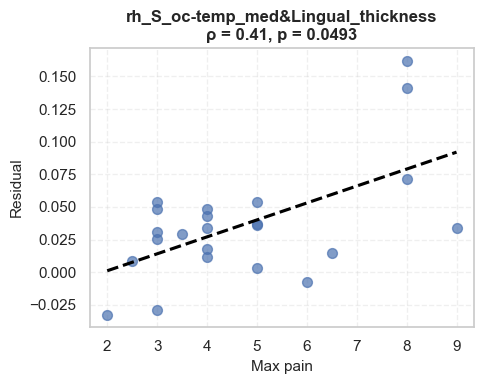

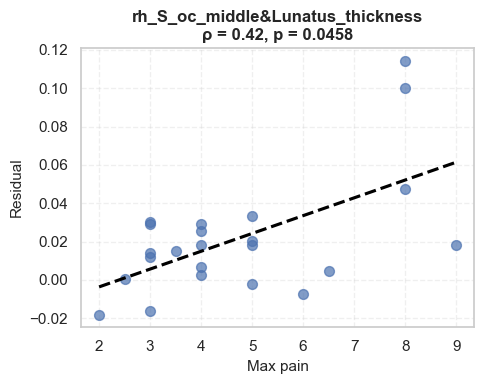

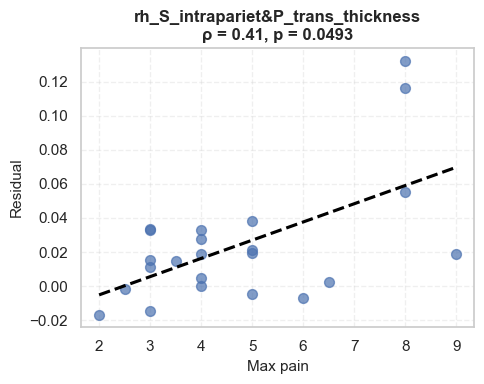

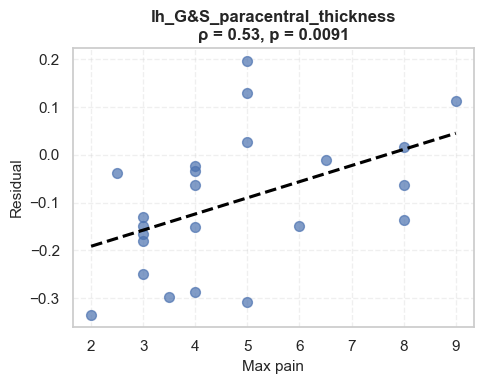

In [74]:
## Only significant regions of SCI Pain
target_regions = [
    "rh_S_oc_sup&transversal_thickness",
    "rh_G&S_transv_frontopol_thickness",
    "rh_S_oc-temp_med&Lingual_thickness",
    "TotalGrayVol (Vol)",
    "rh_S_oc_middle&Lunatus_thickness",
    "rh_S_intrapariet&P_trans_thickness",
    "Right-Cerebellum-Cortex (Vol)",
    "lh_G&S_paracentral_thickness",
    "Left-Pallidum (Vol)",
    "rh_G_front_inf-Opercular_thickness",
    "SubCortGrayVol (Vol)",
    "rh_G_temporal_inf_thickness",
    "Left-Amygdala (Vol)",
    "lh_Lat_Fis-ant-Vertical_thickness",
    "3rd-Ventricle (Vol)",
    "rh_S_front_sup_thickness",
    "lh_G&S_subcentral_thickness",
    "rh_S_interm_prim-Jensen_thickness",
    "lh_Lat_Fis-ant-Horizont_thickness",
    "Right-Inf-Lat-Vent (Vol)",
    "Right-vessel (Vol)",
    "rh_Pole_temporal_thickness",
    "rh_S_temporal_transverse_thickness"
]
correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_sci_only = df_combined[df_combined["Cohort"] == "SCI_P"]

for region in target_regions:  # 👈 Nur gewünschte Regionen
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "max_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["max_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# In DataFrame umwandeln
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_SelectedRegions_MaxPain.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results for selected regions saved.")

import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# 📍 Filtere signifikante Regionen
df_sig_corr = results_df_all[results_df_all["p-value"] < 0.05].copy()
significant_regions = df_sig_corr["Region"].tolist()

# 🔁 Scatterplots für jede signifikante Region
for region in significant_regions:
    residual_col = f"Residual_{region}"

    if residual_col not in df_combined.columns:
        continue

    # Nur SCI_P und gültige Daten
    df_plot = df_combined[df_combined["Cohort"] == "SCI_P"][[residual_col, "max_pain"]].dropna()

    # Plot
    plt.figure(figsize=(5, 4))
    sns.regplot(
        data=df_plot,
        x="max_pain",
        y=residual_col,
        scatter_kws={"s": 50, "alpha": 0.7},
        line_kws={"color": "black", "linestyle": "--"},
        ci=None
    )

    # Optional: Korrelation berechnen
    rho, p = spearmanr(df_plot["max_pain"], df_plot[residual_col])

    # Beschriftung & Titel
    plt.title(f"{region}\nρ = {rho:.2f}, p = {p:.4f}", fontsize=12, fontweight="bold")
    plt.xlabel("Max pain", fontsize=11)
    plt.ylabel("Residual", fontsize=11)
    plt.grid(True, linestyle="--", alpha=0.3)
    plt.tight_layout()
    plt.show()


In [167]:
## FDR Correction
correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

for region in anova_df_combined["Region"]:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "max_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["max_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": p,  # 🔄 Ungerundeter p-Wert für FDR
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# 🧠 FDR-Korrektur (Benjamini-Hochberg)
rejected, pvals_corr, _, _ = multipletests(results_df_all["p-value"], method="fdr_bh")
results_df_all["FDR-corrected p"] = pvals_corr
results_df_all["Significant (FDR)"] = rejected

# 🧾 Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_Pain_FDR.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results with FDR saved.")


✅ Correlation results with FDR saved.


### Onyl SCI_PAIN Max pain


In [57]:
# Nur SCI_P und gültige Werte
df_pain = df_combined[df_combined["Cohort"] == "SCI_P"].copy()
df_pain = df_pain[df_pain["max_pain"].notna()]

results = []

# Gehe alle Residual-Spalten durch
for col in df_pain.columns:
    if col.startswith("Residual_"):
        region = col.replace("Residual_", "")
        data = df_pain[[col, "max_pain"]].dropna()

        if not data.empty:
            rho, p = spearmanr(data["max_pain"], data[col])
            results.append({
                "Region": region,
                "Spearman ρ": round(rho, 3),##
                "p-value": round(p, 5),
                "n": len(data)
            })

# In DataFrame umwandeln
cor_df_scip = pd.DataFrame(results).sort_values("p-value")

# Speichern
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_MaxPain_SCIP_New.xlsx"
cor_df_scip.to_excel(output_path, index=False)

print(f"✅ Saved: {output_path}")

✅ Saved: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_MaxPain_SCIP_New.xlsx


Only 6 Regions which show a correlation so not much more then with SCI no pain

### avg Pain

In [58]:

correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

for region in anova_df_combined["Region"]:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "avg_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["avg_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_avgPain_new.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results (all SCI) saved as 'Correlation_Residuals_avgPain.xlsx'")


✅ Correlation results (all SCI) saved as 'Correlation_Residuals_avgPain.xlsx'


✅ Correlation results for selected regions saved.


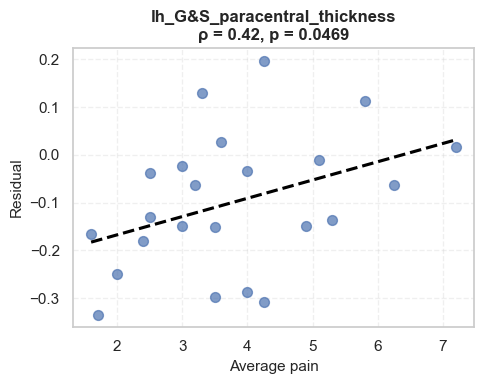

In [75]:
### Only SCI PAIN
## Only significant regions of SCI Pain
target_regions = [
    "rh_S_oc_sup&transversal_thickness",
    "rh_G&S_transv_frontopol_thickness",
    "rh_S_oc-temp_med&Lingual_thickness",
    "TotalGrayVol (Vol)",
    "rh_S_oc_middle&Lunatus_thickness",
    "rh_S_intrapariet&P_trans_thickness",
    "Right-Cerebellum-Cortex (Vol)",
    "lh_G&S_paracentral_thickness",
    "Left-Pallidum (Vol)",
    "rh_G_front_inf-Opercular_thickness",
    "SubCortGrayVol (Vol)",
    "rh_G_temporal_inf_thickness",
    "Left-Amygdala (Vol)",
    "lh_Lat_Fis-ant-Vertical_thickness",
    "3rd-Ventricle (Vol)",
    "rh_S_front_sup_thickness",
    "lh_G&S_subcentral_thickness",
    "rh_S_interm_prim-Jensen_thickness",
    "lh_Lat_Fis-ant-Horizont_thickness",
    "Right-Inf-Lat-Vent (Vol)",
    "Right-vessel (Vol)",
    "rh_Pole_temporal_thickness",
    "rh_S_temporal_transverse_thickness"
]
correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only  = df_combined[df_combined["Cohort"] == "SCI_P"]

for region in target_regions:  # 👈 Nur gewünschte Regionen
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "avg_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["avg_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# In DataFrame umwandeln
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_SelectedRegions_AvgPain.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results for selected regions saved.")


import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# 📍 Filtere signifikante Regionen (p < 0.05)
df_sig_corr = results_df_all[results_df_all["p-value"] < 0.05].copy()
significant_regions = df_sig_corr["Region"].tolist()

# 🔁 Plot für jede signifikante Region
for region in significant_regions:
    residual_col = f"Residual_{region}"

    if residual_col not in df_combined.columns:
        continue

    df_plot = df_combined[df_combined["Cohort"] == "SCI_P"][[residual_col, "avg_pain"]].dropna()

    # Plot erstellen
    plt.figure(figsize=(5, 4))
    sns.regplot(
        data=df_plot,
        x="avg_pain",
        y=residual_col,
        scatter_kws={"s": 50, "alpha": 0.7},
        line_kws={"color": "black", "linestyle": "--"},
        ci=None
    )

    # Korrelationskoeffizient berechnen
    rho, p = spearmanr(df_plot["avg_pain"], df_plot[residual_col])

    # Titel & Achsen
    plt.title(f"{region}\nρ = {rho:.2f}, p = {p:.4f}", fontsize=12, fontweight="bold")
    plt.xlabel("Average pain", fontsize=11)
    plt.ylabel("Residual", fontsize=11)
    plt.grid(True, linestyle="--", alpha=0.3)
    plt.tight_layout()
    plt.show()



In [169]:
### FDR Correction:

correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

for region in anova_df_combined["Region"]:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "avg_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["avg_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": p,  # 🔄 Wichtig: hier noch **nicht** runden
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# 🔍 FDR-Korrektur (Benjamini-Hochberg)
rejected, pvals_corr, _, _ = multipletests(results_df_all["p-value"], method="fdr_bh")
results_df_all["FDR-corrected p"] = pvals_corr
results_df_all["Significant (FDR)"] = rejected

# Optional: Rundung für Ausgabe
results_df_all["p-value"] = results_df_all["p-value"].round(4)
results_df_all["FDR-corrected p"] = results_df_all["FDR-corrected p"].round(4)

# 📁 Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_avgPain_FDR.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results (avg pain) with FDR saved.")

✅ Correlation results (avg pain) with FDR saved.


✅ Found 6 significant regions for plotting.


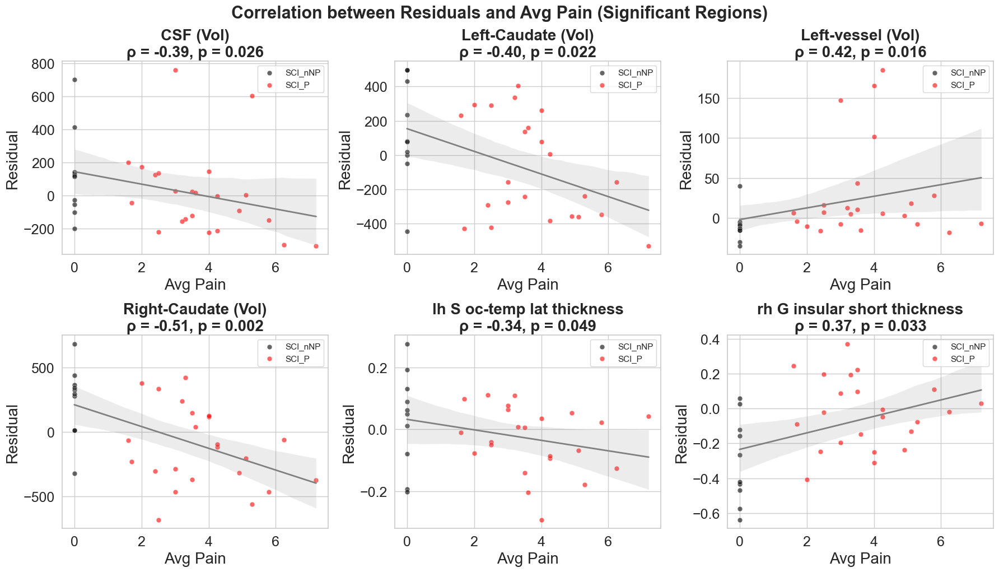

In [59]:
file_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_avgPain_new.xlsx"
cor_df = pd.read_excel(file_path)


# Farbdefinition pro Gruppe
point_colors = {"SCI_P": "red", "SCI_nNP": "black"}


# Signifikante Regionen
sig_regions = cor_df[cor_df["p-value"] < 0.05]["Region"].tolist()
print(f"✅ Found {len(sig_regions)} significant regions for plotting.")

# Plot Grid
n = len(sig_regions)
cols = 3
rows = (n // cols) + int(n % cols != 0)
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

# Filter SCI-only
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

# Loop über alle signifikanten Regionen
for i, region in enumerate(sig_regions):
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "avg_pain", "Cohort"]].dropna()
    data[residual_col] = pd.to_numeric(data[residual_col], errors="coerce")
    data["avg_pain"] = pd.to_numeric(data["avg_pain"], errors="coerce")
    data = data.dropna()

    if data.empty:
        continue

    ax = axes[i]

    # Punkte einfärben pro Gruppe
    for cohort in ["SCI_nNP", "SCI_P"]:
        cohort_data = data[data["Cohort"] == cohort]
        sns.scatterplot(
            data=cohort_data,
            x="avg_pain",
            y=residual_col,
            color=point_colors[cohort],
            alpha=0.6,
            s=40,
            ax=ax,
            label=cohort
        )

    # Regressionslinie über alle Punkte
    sns.regplot(
        data=data,
        x="avg_pain",
        y=residual_col,
        scatter=False,
        color="gray",
        line_kws={"linewidth": 2},
        ax=ax
    )

    # Untertitel mit Stats
    row = cor_df[cor_df["Region"] == region]
    rho = row["Spearman ρ"].values[0]
    p_val = row["p-value"].values[0]

    ax.set_title(f"{region.replace('_', ' ')}\nρ = {rho:.2f}, p = {p_val:.3f}", fontsize=20, fontweight="bold")
    ax.set_xlabel("Avg Pain", fontsize=20)
    ax.set_ylabel("Residual", fontsize=20)

    # Ticks größer machen
    ax.tick_params(axis='both', labelsize=18)

# Unbenutzte Achsen ausblenden
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])



plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("Correlation between Residuals and Avg Pain (Significant Regions)", fontsize=22, fontweight="bold", y=1.02)
plt.show()

### Only SCI avg pain

In [60]:
# Nur SCI_P und gültige Werte
df_pain = df_combined[df_combined["Cohort"] == "SCI_P"].copy()
df_pain = df_pain[df_pain["avg_pain"].notna()]

results = []

# Gehe alle Residual-Spalten durch
for col in df_pain.columns:
    if col.startswith("Residual_"):
        region = col.replace("Residual_", "")
        data = df_pain[[col, "avg_pain"]].dropna()

        if not data.empty:
            rho, p = spearmanr(data["avg_pain"], data[col])
            results.append({
                "Region": region,
                "Spearman ρ": round(rho, 3),
                "p-value": round(p, 5),
                "n": len(data)
            })

# In DataFrame umwandeln
cor_df_scip = pd.DataFrame(results).sort_values("p-value")

# Speichern
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_AvgPain_SCIP_New.xlsx"
cor_df_scip.to_excel(output_path, index=False)

print(f"✅ Saved: {output_path}")

✅ Saved: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_AvgPain_SCIP_New.xlsx


## Spatial external pain

In [61]:
correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

for region in anova_df_combined["Region"]:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "spatial_ext_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["spatial_ext_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_spatial_ext_pain_new.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results (all SCI) saved as 'Correlation_Residuals_spatial_ext_pain.xlsx'")


✅ Correlation results (all SCI) saved as 'Correlation_Residuals_spatial_ext_pain.xlsx'


✅ Correlation results for selected regions saved.


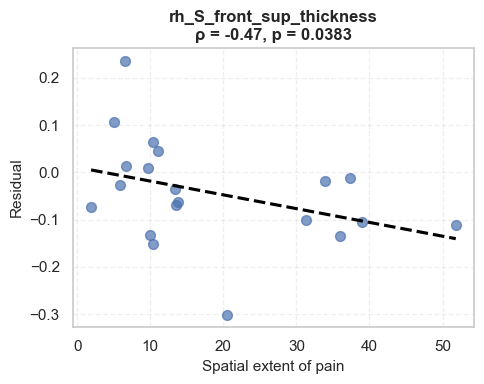

In [76]:
### Only SCI PAIN Significant regions
target_regions = [
    "rh_S_oc_sup&transversal_thickness",
    "rh_G&S_transv_frontopol_thickness",
    "rh_S_oc-temp_med&Lingual_thickness",
    "TotalGrayVol (Vol)",
    "rh_S_oc_middle&Lunatus_thickness",
    "rh_S_intrapariet&P_trans_thickness",
    "Right-Cerebellum-Cortex (Vol)",
    "lh_G&S_paracentral_thickness",
    "Left-Pallidum (Vol)",
    "rh_G_front_inf-Opercular_thickness",
    "SubCortGrayVol (Vol)",
    "rh_G_temporal_inf_thickness",
    "Left-Amygdala (Vol)",
    "lh_Lat_Fis-ant-Vertical_thickness",
    "3rd-Ventricle (Vol)",
    "rh_S_front_sup_thickness",
    "lh_G&S_subcentral_thickness",
    "rh_S_interm_prim-Jensen_thickness",
    "lh_Lat_Fis-ant-Horizont_thickness",
    "Right-Inf-Lat-Vent (Vol)",
    "Right-vessel (Vol)",
    "rh_Pole_temporal_thickness",
    "rh_S_temporal_transverse_thickness"
]
correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_sci_only = df_combined[df_combined["Cohort"] == "SCI_P"]

for region in target_regions:  # 👈 Nur gewünschte Regionen
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "spatial_ext_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["spatial_ext_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# In DataFrame umwandeln
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_SelectedRegions_spatial_ext_pain.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results for selected regions saved.")


import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# 📍 Nur signifikante Regionen
df_sig_corr = results_df_all[results_df_all["p-value"] < 0.05].copy()
significant_regions = df_sig_corr["Region"].tolist()

# 🔁 Plot für jede signifikante Region
for region in significant_regions:
    residual_col = f"Residual_{region}"

    if residual_col not in df_combined.columns:
        continue

    df_plot = df_combined[df_combined["Cohort"] == "SCI_P"][[residual_col, "spatial_ext_pain"]].dropna()

    plt.figure(figsize=(5, 4))
    sns.regplot(
        data=df_plot,
        x="spatial_ext_pain",
        y=residual_col,
        scatter_kws={"s": 50, "alpha": 0.7},
        line_kws={"color": "black", "linestyle": "--"},
        ci=None
    )

    rho, p = spearmanr(df_plot["spatial_ext_pain"], df_plot[residual_col])

    plt.title(f"{region}\nρ = {rho:.2f}, p = {p:.4f}", fontsize=12, fontweight="bold")
    plt.xlabel("Spatial extent of pain", fontsize=11)
    plt.ylabel("Residual", fontsize=11)
    plt.grid(True, linestyle="--", alpha=0.3)
    plt.tight_layout()
    plt.show()



✅ Found 8 significant regions for plotting.


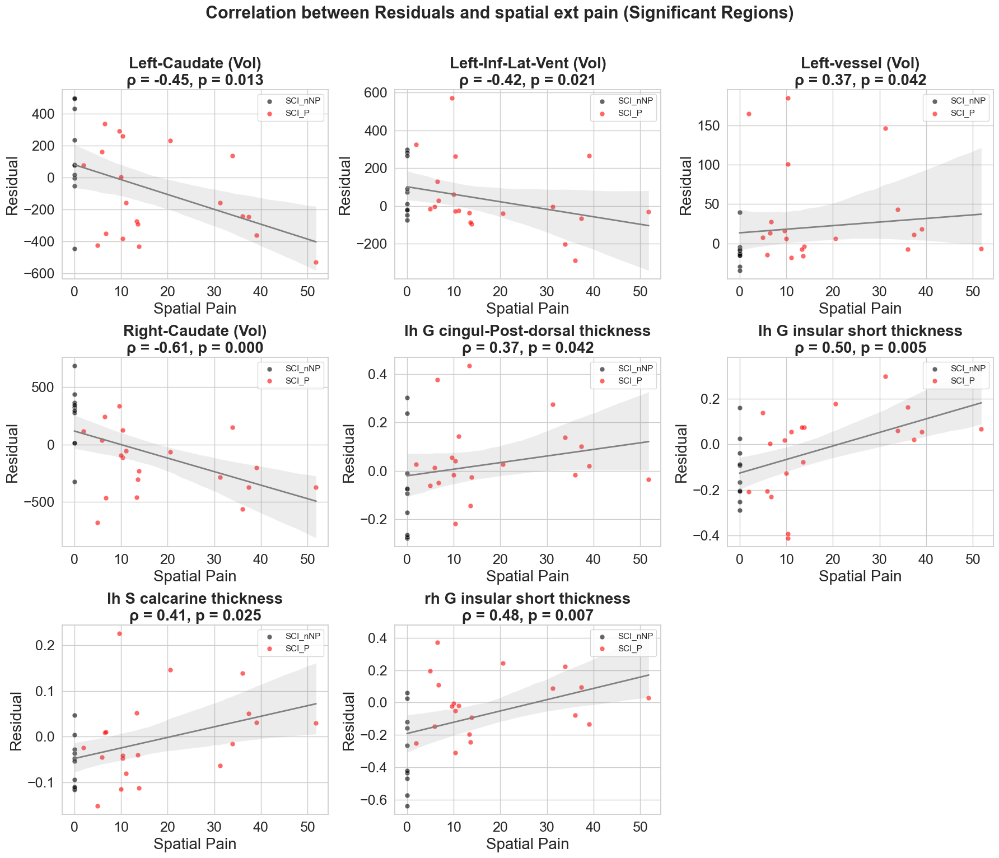

In [62]:
file_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_spatial_ext_pain_new.xlsx"
cor_df = pd.read_excel(file_path)

# Farbdefinition pro Gruppe
point_colors = {"SCI_P": "red", "SCI_nNP": "black"}


# Signifikante Regionen
sig_regions = cor_df[cor_df["p-value"] < 0.05]["Region"].tolist()
print(f"✅ Found {len(sig_regions)} significant regions for plotting.")

# Plot Grid
n = len(sig_regions)
cols = 3
rows = (n // cols) + int(n % cols != 0)
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

# Filter SCI-only
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

# Loop über alle signifikanten Regionen
for i, region in enumerate(sig_regions):
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "spatial_ext_pain", "Cohort"]].dropna()
    data[residual_col] = pd.to_numeric(data[residual_col], errors="coerce")
    data["spatial_ext_pain"] = pd.to_numeric(data["spatial_ext_pain"], errors="coerce")
    data = data.dropna()

    if data.empty:
        continue

    ax = axes[i]

    # Punkte einfärben pro Gruppe
    for cohort in ["SCI_nNP", "SCI_P"]:
        cohort_data = data[data["Cohort"] == cohort]
        sns.scatterplot(
            data=cohort_data,
            x="spatial_ext_pain",
            y=residual_col,
            color=point_colors[cohort],
            alpha=0.6,
            s=40,
            ax=ax,
            label=cohort
        )

    # Regressionslinie über alle Punkte
    sns.regplot(
        data=data,
        x="spatial_ext_pain",
        y=residual_col,
        scatter=False,
        color="gray",
        line_kws={"linewidth": 2},
        ax=ax
    )

    # Untertitel mit Stats
    row = cor_df[cor_df["Region"] == region]
    rho = row["Spearman ρ"].values[0]
    p_val = row["p-value"].values[0]

    ax.set_title(f"{region.replace('_', ' ')}\nρ = {rho:.2f}, p = {p_val:.3f}", fontsize=20, fontweight="bold")
    ax.set_xlabel("Spatial Pain", fontsize=20)
    ax.set_ylabel("Residual", fontsize=20)

    # Ticks größer machen
    ax.tick_params(axis='both', labelsize=18)

# Unbenutzte Achsen ausblenden
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("Correlation between Residuals and spatial ext pain (Significant Regions)", fontsize=22, fontweight="bold", y=1.02)
plt.show()

✅ Correlation results (spatial extent of pain) with FDR saved.


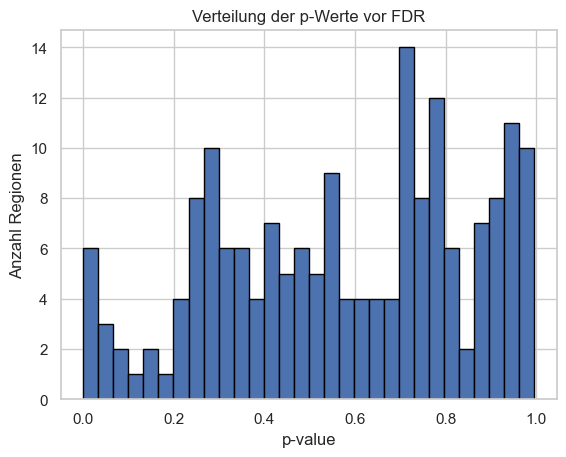

In [173]:
### FDR:

correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

for region in anova_df_combined["Region"]:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "spatial_ext_pain"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["spatial_ext_pain"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": p,  # Noch nicht runden!
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# 🔍 FDR-Korrektur
rejected, pvals_corr, _, _ = multipletests(results_df_all["p-value"], method="fdr_bh")
results_df_all["FDR-corrected p"] = pvals_corr
results_df_all["Significant (FDR)"] = rejected

# 🔢 Runde für Export
results_df_all["p-value"] = results_df_all["p-value"].round(4)
results_df_all["FDR-corrected p"] = results_df_all["FDR-corrected p"].round(4)

# 💾 Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_spatial_ext_pain_FDR.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results (spatial extent of pain) with FDR saved.")
import matplotlib.pyplot as plt

plt.hist(results_df_all["p-value"], bins=30, edgecolor="black")
plt.title("Verteilung der p-Werte vor FDR")
plt.xlabel("p-value")
plt.ylabel("Anzahl Regionen")
plt.show()


In [64]:
import pandas as pd
import statsmodels.formula.api as smf

# Filter nur SCI
df_sci = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])].copy()
# 💡 Referenzgruppe festlegen (SCI_nNP als Referenz)
df_sci["Cohort"] = pd.Categorical(df_sci["Cohort"], categories=["SCI_nNP", "SCI_P"])
# Liste aller Residual-Spalten
residual_cols = [col for col in df_sci.columns if col.startswith("Residual_")]

results = []

for col in residual_cols:
    region = col.replace("Residual_", "")

    # Daten vorbereiten
    data = df_sci[[col, "spatial_ext_pain", "Cohort"]].dropna()
    data = data.rename(columns={col: "Residual"})

    if data["Cohort"].nunique() < 2 or data["spatial_ext_pain"].nunique() < 3:
        continue  # Überspringen, wenn keine sinnvolle Variation

    # Lineares Modell
    try:
        model = smf.ols("Residual ~ spatial_ext_pain * C(Cohort)", data=data).fit()

        results.append({
            "Region": region,
            "p_spatial_ext_pain": round(model.pvalues.get("spatial_ext_pain", float("nan")), 4),
            "p_cohort": round(model.pvalues.get("Cohort[T.SCI_P]", float("nan")), 4),
            "p_interaction": round(model.pvalues.get("spatial_ext_pain:Cohort[T.SCI_P]", float("nan")), 4),
            "n": len(data)
        })
    except Exception as e:
        print(f"⚠️ Fehler bei Region {region}: {e}")

# Als DataFrame speichern
df_lm_results = pd.DataFrame(results)
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/LinearModel_SpatialPain_AllRegions.xlsx"
df_lm_results.to_excel(output_path, index=False)

print(f"✅ Ergebnisse gespeichert: {output_path}")


✅ Ergebnisse gespeichert: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/LinearModel_SpatialPain_AllRegions.xlsx


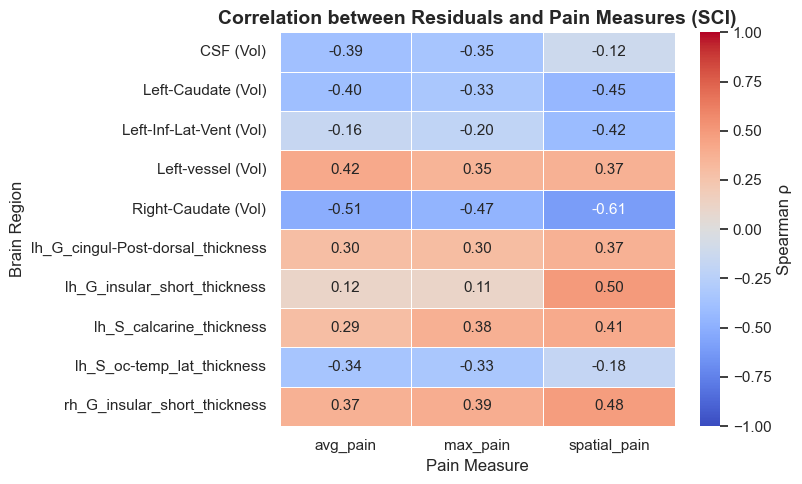

In [186]:
# Drei separate Korrelationstabellen laden
df_avg = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_avgPain_new.xlsx")
df_max = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_Pain_New.xlsx")
df_spatial = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_spatial_ext_pain_new.xlsx")

# Umbenennen zur Klarheit
df_avg = df_avg.rename(columns={"Spearman ρ": "avg_pain", "p-value": "p-value_avg"})
df_max = df_max.rename(columns={"Spearman ρ": "max_pain", "p-value": "p-value_max"})
df_spatial = df_spatial.rename(columns={"Spearman ρ": "spatial_pain", "p-value": "p-value_spatial"})

# Merge nach Region
df_corr = df_avg[["Region", "avg_pain"]].merge(
    df_max[["Region", "max_pain"]], on="Region"
).merge(
    df_spatial[["Region", "spatial_pain"]], on="Region"
)

# Farbgrenzen für Heatmap
vmin, vmax = -1, 1  # da Spearman ρ ∈ [-1, 1]

#  Optional: nur signifikante Regionen anzeigen (wenn du FDR nutzt)
# Signifikante Regionen aus allen drei Tabellen (p < 0.05)
sig_avg = set(df_avg[df_avg["p-value_avg"] < 0.05]["Region"])
sig_max = set(df_max[df_max["p-value_max"] < 0.05]["Region"])
sig_spatial = set(df_spatial[df_spatial["p-value_spatial"] < 0.05]["Region"])

# Vereinigung aller signifikanten Regionen
df_sig_regions = sig_avg.union(sig_max).union(sig_spatial)

# Nur diese Regionen plotten
df_corr = df_corr[df_corr["Region"].isin(df_sig_regions)]
# Heatmap-Plot
plt.figure(figsize=(8, 0.5 * len(df_corr)))
sns.heatmap(
    df_corr.set_index("Region"),
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.4,
    vmin=vmin,
    vmax=vmax,
    annot_kws={"fontsize": 11},
    cbar_kws={"label": "Spearman ρ"}
)

plt.title("Correlation between Residuals and Pain Measures (SCI)", fontsize=14, fontweight="bold")
plt.xlabel("Pain Measure", fontsize=12)
plt.ylabel("Brain Region", fontsize=12)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


### Handling the the groups we can see

In [65]:
df_sci["Spatial_Group"] = df_sci["spatial_ext_pain"].apply(lambda x: "Low" if x <= 30 else "High")

# Ergebnisliste
results = []

for col in df_sci.columns:
    if col.startswith("Residual_"):
        low = df_sci[df_sci["Spatial_Group"] == "Low"][col].dropna()
        high = df_sci[df_sci["Spatial_Group"] == "High"][col].dropna()

        if len(low) > 2 and len(high) > 2:
            region = col.replace("Residual_", "")
            try:
                normal = df_normality.loc[df_normality["Region"] == region, "Normal_Distribution"].values[0]
            except:
                normal = False

            if normal:
                stat, p_val = ttest_ind(low, high, equal_var=False)
                test_used = "t-test"
                pooled_std = np.sqrt((low.var(ddof=1) + high.var(ddof=1)) / 2)
                mean_diff = low.mean() - high.mean()
                effect_size = mean_diff / pooled_std if pooled_std != 0 else np.nan
                effect_label = "Cohen's d"
            else:
                stat, p_val = mannwhitneyu(low, high, alternative='two-sided')
                test_used = "Mann-Whitney"
                effect_size = cliffs_delta(low.values, high.values)
                effect_label = "Cliff's δ"

            results.append({
                "Region": region,
                "Test": test_used,
                "Statistic": round(stat, 4),
                "p-value": round(p_val, 5),
                "Effect size": round(effect_size, 3) if not np.isnan(effect_size) else None,
                "Effect size type": effect_label,
                "Mean Low": low.mean(),
                "Mean High": high.mean(),
                "n Low": len(low),
                "n High": len(high)
            })

# Speichern
results_df = pd.DataFrame(results).sort_values("p-value")
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_SpatialGroup_Comparison.xlsx"
results_df.to_excel(output_path, index=False)

print(f"✅ Low vs. High Spatial Pain Results saved to: {output_path}")


✅ Low vs. High Spatial Pain Results saved to: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_SpatialGroup_Comparison.xlsx


In [66]:
from scipy.stats import ttest_ind, mannwhitneyu
import numpy as np
import pandas as pd

# Deine Cliff’s delta Funktion
def cliffs_delta(a, b):
    n_a, n_b = len(a), len(b)
    more = sum(x > y for x in a for y in b)
    less = sum(x < y for x in a for y in b)
    delta = (more - less) / (n_a * n_b)
    return delta

# Nur SCI und Spatial_Group
df_sci = df_combined[
    df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"]) &
    df_combined["spatial_ext_pain"].notna()
].copy()

# Spatial Group erzeugen (falls noch nicht vorhanden)
df_sci["Spatial_Group"] = df_sci["spatial_ext_pain"].apply(lambda x: "Low" if x <= 30 else "High")

# Ergebnisliste
results = []

# Loop über Residuals
for col in df_sci.columns:
    if col.startswith("Residual_"):
        region = col.replace("Residual_", "")
        low = df_sci[df_sci["Spatial_Group"] == "Low"][col].dropna()
        high = df_sci[df_sci["Spatial_Group"] == "High"][col].dropna()

        if len(low) > 2 and len(high) > 2:
            # Normalitätsinfo abrufen
            try:
                normal = df_normality.loc[df_normality["Region"] == region, "Normal_Distribution"].values[0]
            except:
                normal = False  # fallback

            if normal:
                stat, p_val = ttest_ind(low, high, equal_var=False)
                pooled_std = np.sqrt((low.var(ddof=1) + high.var(ddof=1)) / 2)
                effect = (low.mean() - high.mean()) / pooled_std if pooled_std != 0 else np.nan
                effect_type = "Cohen's d"
                test = "t-test"
            else:
                stat, p_val = mannwhitneyu(low, high, alternative='two-sided')
                effect = cliffs_delta(low.values, high.values)
                effect_type = "Cliff's δ"
                test = "Mann-Whitney"

            results.append({
                "Region": region,
                "Test": test,
                "p-value": round(p_val, 5),
                "Effect Size": round(effect, 3),
                "Effect Type": effect_type,
                "Mean_Low": round(low.mean(), 3),
                "Mean_High": round(high.mean(), 3),
                "n_Low": len(low),
                "n_High": len(high)
            })

# Zu DataFrame + Export
df_results = pd.DataFrame(results).sort_values("p-value")
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SpatialGroup_Stats_Residuals.xlsx"
df_results.to_excel(output_path, index=False)

print(f"✅ Test results saved to: {output_path}")


✅ Test results saved to: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SpatialGroup_Stats_Residuals.xlsx


📊 Found 4 significant regions.


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/21646348.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Spatial_Group", y=residual_col, data=plot_data,
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/21646348.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Spatial_Group", y=residual_col, data=plot_data,
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/21646348.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Spatial_Group", y=residual_col, data=plot_data,
/var/folders/

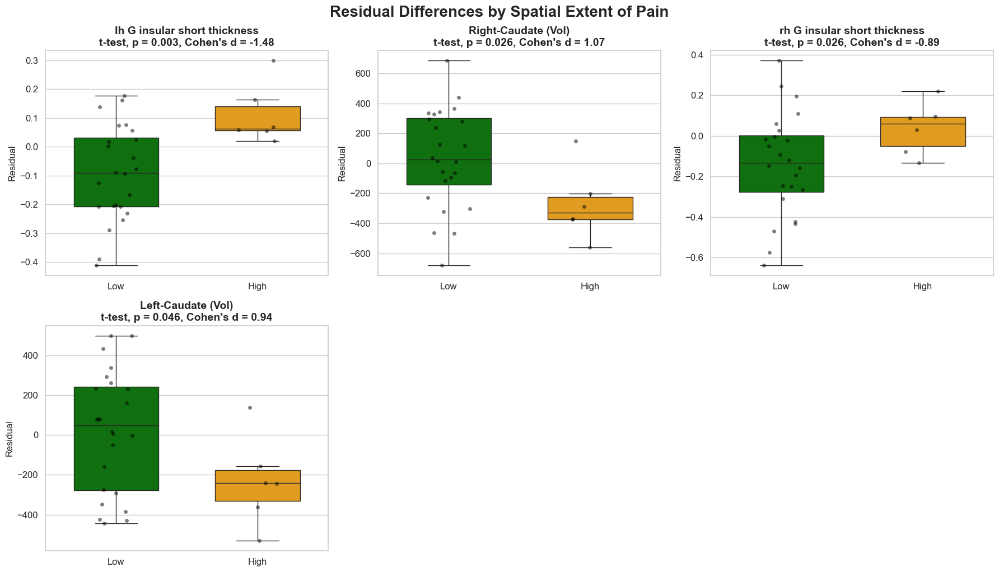

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

# 🔹 Lade Ergebnisdatei (falls nicht schon geladen)
df_results = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SpatialGroup_Stats_Residuals.xlsx")

# 🔎 Nur signifikante Regionen
sig_regions = df_results[df_results["p-value"] < 0.05]["Region"].tolist()
print(f"📊 Found {len(sig_regions)} significant regions.")

# 🔸 Farben
group_colors = {"Low": "green", "High": "orange"}

# 📐 Plot Grid
n = len(sig_regions)
cols = 3
rows = (n // cols) + int(n % cols != 0)
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

# 🔁 Durch Regionen loopen
for i, region in enumerate(sig_regions):
    ax = axes[i]
    residual_col = f"Residual_{region}"

    if residual_col not in df_combined.columns:
        ax.set_visible(False)
        continue

    plot_data = df_combined[
        df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"]) &
        df_combined["spatial_ext_pain"].notna()
    ].copy()
    plot_data["Spatial_Group"] = plot_data["spatial_ext_pain"].apply(lambda x: "Low" if x <= 30 else "High")
    plot_data = plot_data[[residual_col, "Spatial_Group"]].dropna()

    # Box + Strip
    sns.boxplot(x="Spatial_Group", y=residual_col, data=plot_data,
                palette=group_colors, ax=ax, width=0.6, fliersize=0)
    sns.stripplot(x="Spatial_Group", y=residual_col, data=plot_data,
                  color="black", alpha=0.5, jitter=0.15, size=5, ax=ax)

    # Titel
    row = df_results[df_results["Region"] == region].iloc[0]
    ax.set_title(f"{region.replace('_', ' ')}\n{row['Test']}, p = {row['p-value']:.3f}, {row['Effect Type']} = {row['Effect Size']:.2f}",
                 fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("Residual", fontsize=12)
    ax.tick_params(labelsize=12)

# 🎨 Überzählige Plots ausblenden
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.94)
plt.suptitle("Residual Differences by Spatial Extent of Pain", fontsize=20, fontweight="bold", y=1.02)
plt.show()


### Only SCI pain with Spatial ext pain


In [68]:
# Nur SCI_P und gültige Werte
df_pain = df_combined[df_combined["Cohort"] == "SCI_P"].copy()
df_pain = df_pain[df_pain["spatial_ext_pain"].notna()]

results = []

# Gehe alle Residual-Spalten durch
for col in df_pain.columns:
    if col.startswith("Residual_"):
        region = col.replace("Residual_", "")
        data = df_pain[[col, "spatial_ext_pain"]].dropna()

        if not data.empty:
            rho, p = spearmanr(data["spatial_ext_pain"], data[col])
            results.append({
                "Region": region,
                "Spearman ρ": round(rho, 3),
                "p-value": round(p, 5),
                "n": len(data)
            })

# In DataFrame umwandeln
cor_df_scip = pd.DataFrame(results).sort_values("p-value")

# Speichern
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_spatial_ext_pain_SCIP_new.xlsx"
cor_df_scip.to_excel(output_path, index=False)

print(f"✅ Saved: {output_path}")

✅ Saved: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_spatial_ext_pain_SCIP_new.xlsx


### PCS

In [174]:
correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

for region in anova_df_combined["Region"]:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "PCS"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["PCS"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_PCS_SCI.xlsx"
results_df_all.to_excel(output_path_all, index=False)




In [73]:
### Only SCI Pain significant regions
from scipy.stats import spearmanr
import pandas as pd

# 🎯 Nur diese Regionen analysieren
target_regions = [
    "TotalGrayVol (Vol)",
    "rh_G&S_transv_frontopol_thickness",
    "rh_S_oc_sup&transversal_thickness",
    "rh_S_oc-temp_med&Lingual_thickness",
    "Left-Pallidum (Vol)",
    "Left-Amygdala (Vol)"
]

correlation_results_pain = []

# 🧪 Nur SCI_P
df_sci_only = df_combined[df_combined["Cohort"] == "SCI_P"]

for region in target_regions:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "PCS"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["PCS"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# 🔄 Ergebnisse in DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# 💾 Export
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_SelectedRegions_PCS.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results for selected regions with PCS saved.")


✅ Correlation results for selected regions with PCS saved.


In [175]:
from scipy.stats import spearmanr
from statsmodels.stats.multitest import multipletests
import pandas as pd

correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

for region in anova_df_combined["Region"]:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "PCS"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["PCS"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": p,
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# 🔁 FDR-Korrektur
pvals = results_df_all["p-value"].values
rejected, pvals_corr, _, _ = multipletests(pvals, alpha=0.05, method='fdr_bh')

results_df_all["FDR-corrected p"] = pvals_corr
results_df_all["Significant (FDR)"] = rejected

# 📤 Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_PCS_SCI_FDR.xlsx"
results_df_all.to_excel(output_path_all, index=False)

print("✅ Correlation results with FDR saved as 'Correlation_PCS_SCI_FDR.xlsx'")


✅ Correlation results with FDR saved as 'Correlation_PCS_SCI_FDR.xlsx'


✅ Found 4 significant regions for plotting.


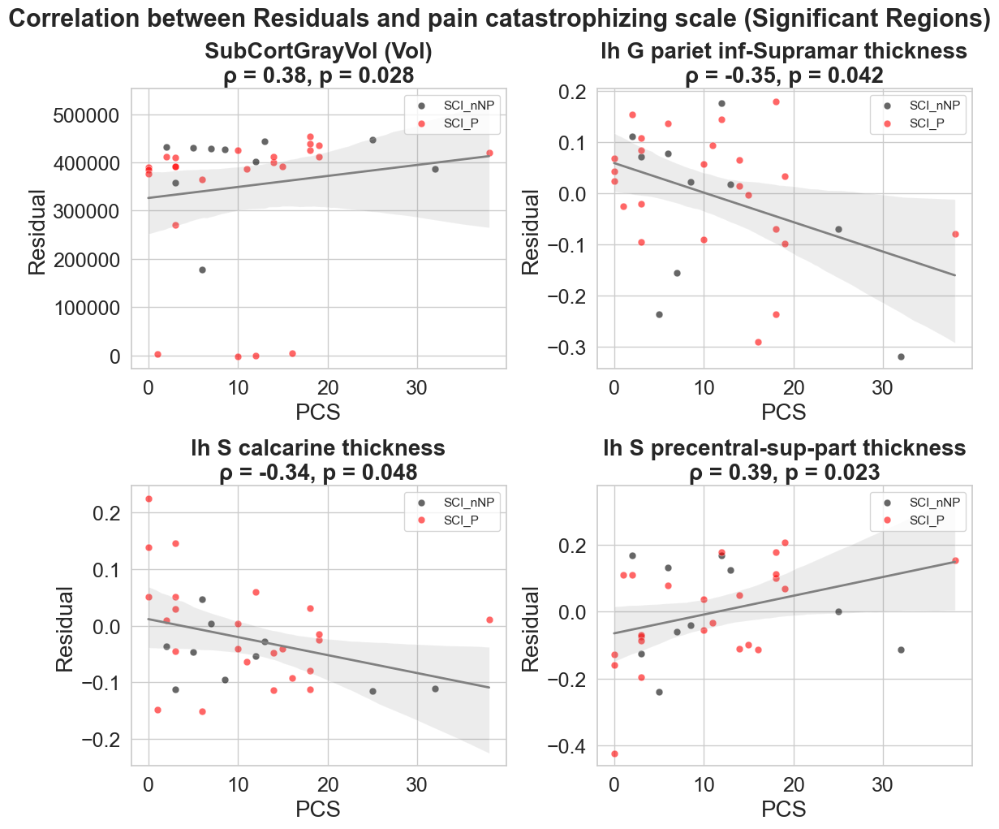

In [70]:
file_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_PCS_SCI.xlsx"
cor_df = pd.read_excel(file_path)


# Farbdefinition pro Gruppe
point_colors = {"SCI_P": "red", "SCI_nNP": "black"}


# Signifikante Regionen
sig_regions = cor_df[cor_df["p-value"] < 0.05]["Region"].tolist()
print(f"✅ Found {len(sig_regions)} significant regions for plotting.")

# Plot Grid
n = len(sig_regions)
cols = 2
rows = (n // cols) + int(n % cols != 0)
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

# Filter SCI-only
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

# Loop über alle signifikanten Regionen
for i, region in enumerate(sig_regions):
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "PCS", "Cohort"]].dropna()
    data[residual_col] = pd.to_numeric(data[residual_col], errors="coerce")
    data["PCS"] = pd.to_numeric(data["PCS"], errors="coerce")
    data = data.dropna()

    if data.empty:
        continue

    ax = axes[i]

    # Punkte einfärben pro Gruppe
    for cohort in ["SCI_nNP", "SCI_P"]:
        cohort_data = data[data["Cohort"] == cohort]
        sns.scatterplot(
            data=cohort_data,
            x="PCS",
            y=residual_col,
            color=point_colors[cohort],
            alpha=0.6,
            s=40,
            ax=ax,
            label=cohort
        )

    # Regressionslinie über alle Punkte
    sns.regplot(
        data=data,
        x="PCS",
        y=residual_col,
        scatter=False,
        color="gray",
        line_kws={"linewidth": 2},
        ax=ax
    )

    # Untertitel mit Stats
    row = cor_df[cor_df["Region"] == region]
    rho = row["Spearman ρ"].values[0]
    p_val = row["p-value"].values[0]

    ax.set_title(f"{region.replace('_', ' ')}\nρ = {rho:.2f}, p = {p_val:.3f}", fontsize=20, fontweight="bold")
    ax.set_xlabel("PCS", fontsize=20)
    ax.set_ylabel("Residual", fontsize=20)

    # Ticks größer machen
    ax.tick_params(axis='both', labelsize=18)

# Unbenutzte Achsen ausblenden
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("Correlation between Residuals and pain catastrophizing scale (Significant Regions)", fontsize=22, fontweight="bold", y=1.02)
plt.show()

### BDI

In [71]:
correlation_results_pain = []

# Nur SCI-Teilnehmer (beide Gruppen gemeinsam)
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

for region in anova_df_combined["Region"]:
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "BDI"]].dropna()

    if not data.empty:
        rho, p = spearmanr(data[residual_col], data["BDI"])
        correlation_results_pain.append({
            "Region": region,
            "Spearman ρ": round(rho, 3),
            "p-value": round(p, 4),
            "n": len(data)
        })

# Als DataFrame
results_df_all = pd.DataFrame(correlation_results_pain)

# Speichern
output_path_all = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_BDI_SCI.xlsx"
results_df_all.to_excel(output_path_all, index=False)

✅ Found 48 significant regions for plotting.


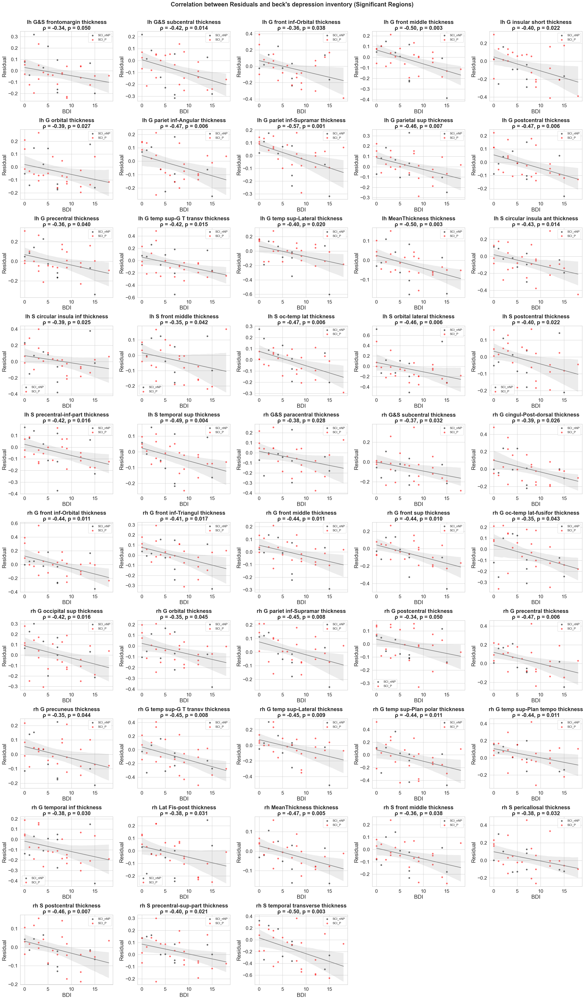

In [72]:
file_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_BDI_SCI.xlsx"
cor_df = pd.read_excel(file_path)


# Farbdefinition pro Gruppe
point_colors = {"SCI_P": "red", "SCI_nNP": "black"}


# Signifikante Regionen
sig_regions = cor_df[cor_df["p-value"] < 0.05]["Region"].tolist()
print(f"✅ Found {len(sig_regions)} significant regions for plotting.")

# Plot Grid
n = len(sig_regions)
cols = 5
rows = (n // cols) + int(n % cols != 0)
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

# Filter SCI-only
df_sci_only = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]

# Loop über alle signifikanten Regionen
for i, region in enumerate(sig_regions):
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci_only.columns:
        continue

    data = df_sci_only[[residual_col, "BDI", "Cohort"]].dropna()
    data[residual_col] = pd.to_numeric(data[residual_col], errors="coerce")
    data["BDI"] = pd.to_numeric(data["BDI"], errors="coerce")
    data = data.dropna()

    if data.empty:
        continue

    ax = axes[i]

    # Punkte einfärben pro Gruppe
    for cohort in ["SCI_nNP", "SCI_P"]:
        cohort_data = data[data["Cohort"] == cohort]
        sns.scatterplot(
            data=cohort_data,
            x="BDI",
            y=residual_col,
            color=point_colors[cohort],
            alpha=0.6,
            s=40,
            ax=ax,
            label=cohort
        )

    # Regressionslinie über alle Punkte
    sns.regplot(
        data=data,
        x="BDI",
        y=residual_col,
        scatter=False,
        color="gray",
        line_kws={"linewidth": 2},
        ax=ax
    )

    # Untertitel mit Stats
    row = cor_df[cor_df["Region"] == region]
    rho = row["Spearman ρ"].values[0]
    p_val = row["p-value"].values[0]

    ax.set_title(f"{region.replace('_', ' ')}\nρ = {rho:.2f}, p = {p_val:.3f}", fontsize=20, fontweight="bold")
    ax.set_xlabel("BDI", fontsize=20)
    ax.set_ylabel("Residual", fontsize=20)

    # Ticks größer machen
    ax.tick_params(axis='both', labelsize=18)

# Unbenutzte Achsen ausblenden
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout()
plt.subplots_adjust(top=0.99)
plt.suptitle("Correlation between Residuals and beck's depression inventory (Significant Regions)", fontsize=22, fontweight="bold", y=1.02)
plt.show()

### BDI SCI with pain vs without pain

In [176]:

correlation_results_split = []

# Für beide Gruppen getrennt
for cohort in ["SCI_P", "SCI_nNP"]:
    df_group = df_combined[df_combined["Cohort"] == cohort]

    for region in anova_df_combined["Region"]:
        residual_col = f"Residual_{region}"
        if residual_col not in df_group.columns:
            continue

        data = df_group[[residual_col, "BDI"]].dropna()

        if not data.empty:
            rho, p = spearmanr(data[residual_col], data["BDI"])
            correlation_results_split.append({
                "Region": region,
                "Cohort": cohort,
                "Spearman ρ": round(rho, 3),
                "p-value": round(p, 4),
                "n": len(data)
            })

# Speichern als DataFrame
df_corr_split = pd.DataFrame(correlation_results_split)

# Export
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_BDI_Split.xlsx"
df_corr_split.to_excel(output_path, index=False)
print("✅ Saved correlation file for both SCI groups.")


✅ Saved correlation file for both SCI groups.


In [177]:

correlation_results_split = []

# Für beide Gruppen getrennt
for cohort in ["SCI_P", "SCI_nNP"]:
    df_group = df_combined[df_combined["Cohort"] == cohort]

    for region in anova_df_combined["Region"]:
        residual_col = f"Residual_{region}"
        if residual_col not in df_group.columns:
            continue

        data = df_group[[residual_col, "BDI"]].dropna()

        if not data.empty:
            rho, p = spearmanr(data[residual_col], data["BDI"])
            correlation_results_split.append({
                "Region": region,
                "Cohort": cohort,
                "Spearman ρ": round(rho, 3),
                "p-value": p,
                "n": len(data)
            })

# In DataFrame umwandeln
df_corr_split = pd.DataFrame(correlation_results_split)

# 🧪 FDR-Korrektur pro Gruppe
df_corr_split["FDR-corrected p"] = np.nan
df_corr_split["Significant (FDR)"] = False

for cohort in df_corr_split["Cohort"].unique():
    mask = df_corr_split["Cohort"] == cohort
    pvals = df_corr_split.loc[mask, "p-value"].values
    rejected, pvals_corr, _, _ = multipletests(pvals, alpha=0.05, method="fdr_bh")
    df_corr_split.loc[mask, "FDR-corrected p"] = pvals_corr
    df_corr_split.loc[mask, "Significant (FDR)"] = rejected

# Export
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_BDI_Split_FDR.xlsx"
df_corr_split.to_excel(output_path, index=False)
print("✅ Saved correlation file for both SCI groups with FDR correction.")

✅ Saved correlation file for both SCI groups with FDR correction.


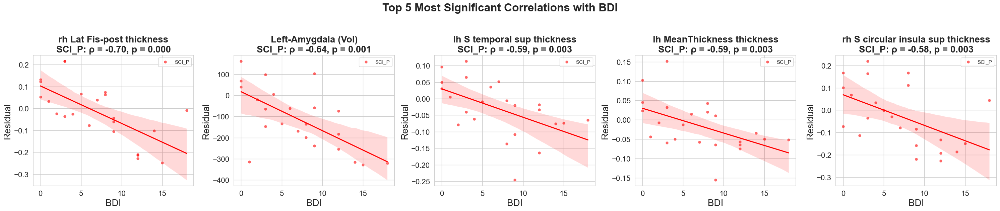

In [74]:
# 📥 Laden
df_corr_split = pd.read_excel(output_path)

# 🔍 Nur signifikante Einträge
sig_corr = df_corr_split[df_corr_split["p-value"] < 0.05].copy()

# Sortiert nach kleinstem p-Wert und Top 5 einzigartige Regionen
top5_regions = (
    sig_corr.sort_values("p-value", ascending=True)
    .drop_duplicates("Region")
    .head(5)["Region"]
    .tolist()
)

# 🖼️ Setup für 5 Plots nebeneinander
fig, axes = plt.subplots(1, 5, figsize=(30, 6))
axes = axes.flatten()

for i, region in enumerate(top5_regions):
    ax = axes[i]
    residual_col = f"Residual_{region}"

    if residual_col not in df_combined.columns:
        ax.set_visible(False)
        continue

    title_lines = [region.replace("_", " ")]

    # Nur Gruppen mit signifikantem p-Wert für diese Region
    cohorts_to_plot = sig_corr[sig_corr["Region"] == region]["Cohort"].tolist()

    plot_data = df_combined[df_combined["Cohort"].isin(cohorts_to_plot)][
        ["BDI", residual_col, "Cohort"]
    ].dropna()

    for cohort in cohorts_to_plot:
        color = point_colors.get(cohort, "gray")
        group_data = plot_data[plot_data["Cohort"] == cohort]

        # Punkte
        sns.scatterplot(
            data=group_data,
            x="BDI",
            y=residual_col,
            color=color,
            label=cohort,
            alpha=0.6,
            s=40,
            ax=ax
        )

        # Regressionslinie
        sns.regplot(
            data=group_data,
            x="BDI",
            y=residual_col,
            scatter=False,
            color=color,
            ci=95,
            ax=ax
        )

        # Statistik-Annotation
        row = df_corr_split[
            (df_corr_split["Region"] == region) &
            (df_corr_split["Cohort"] == cohort)
        ]
        if not row.empty:
            rho = row["Spearman ρ"].values[0]
            p_val = row["p-value"].values[0]
            title_lines.append(f"{cohort}: ρ = {rho:.2f}, p = {p_val:.3f}")

    ax.set_title("\n".join(title_lines), fontsize=20, fontweight="bold")
    ax.set_xlabel("BDI", fontsize=20)
    ax.set_ylabel("Residual", fontsize=20)
    ax.tick_params(labelsize=16)

# 🧹 Unnötige Achsen löschen
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Top 5 Most Significant Correlations with BDI", fontsize=24, fontweight="bold", y=1.05)
plt.tight_layout(rect=[0, 0, 1, 1])
plt.show()


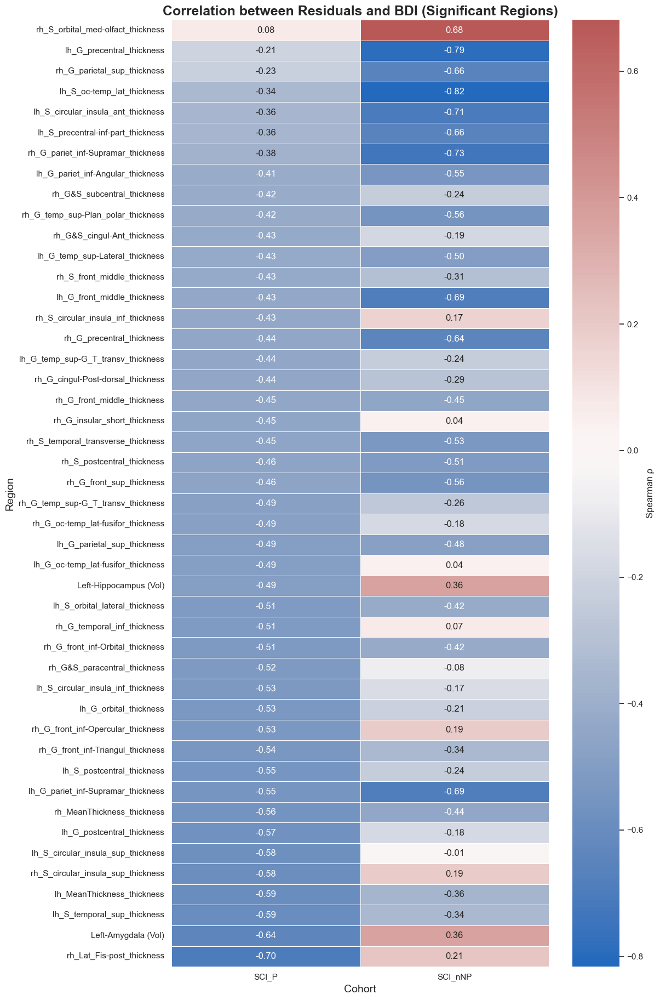

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

# 📌 Nur signifikante Regionen für eine der beiden Gruppen
sig_regions = df_corr_split[df_corr_split["p-value"] < 0.05]["Region"].unique()
heat_data = df_corr_split[df_corr_split["Region"].isin(sig_regions)]

# 📌 Pivotieren
heatmap_data = heat_data.pivot(index="Region", columns="Cohort", values="Spearman ρ")

# 📌 Optional sortieren nach SCI_P (oder SCI_nNP)
heatmap_data = heatmap_data.sort_values(by="SCI_P", ascending=False)

# 📐 Layout: 3 Spalten visuell unterstützen durch Plot-Höhe
n_rows = len(heatmap_data)
plt.figure(figsize=(12, 0.4 * n_rows))  # evtl. 0.5 bei viel Platzbedarf

# 🎨 Plot
sns.heatmap(
    heatmap_data,
    annot=True, fmt=".2f", cmap="vlag", center=0, linewidths=0.5,
    cbar_kws={"label": "Spearman ρ"}
)

# 🖋️ Titel & Achsen
plt.title("Correlation between Residuals and BDI (Significant Regions)", fontsize=18, fontweight="bold")
plt.xlabel("Cohort", fontsize=14)
plt.ylabel("Region", fontsize=14)
plt.xticks(rotation=0)
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()


### Mapping Brain Features

In [76]:
df_sci_vs_0 = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison.xlsx")
df_vs0_groups = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_vsZero_And_BetweenGroups.xlsx")
df_corr_pain = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_Pain_New.xlsx")
df_corr_avgpain = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_avgPain_new.xlsx")
df_corr_spatial = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_spatial_ext_pain_new.xlsx")
df_spatial_group = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SpatialGroup_Stats_Residuals.xlsx")


In [77]:
# Liste aller verfügbaren Regionen aus df_combined (über Residuals)
all_regions = sorted([
    col.replace("Residual_", "")
    for col in df_combined.columns
    if col.startswith("Residual_")
])
# Leere DataFrame mit Regionen als Index
matrix = pd.DataFrame(index=all_regions)
def mark_significance(df, region_col="Region", p_col="p-value", alpha=0.05):
    return set(df[df[p_col] < alpha][region_col])
# SCI vs 0
sig_sci_vs_0 = mark_significance(df_sci_vs_0)
matrix["SCI_vs_0"] = matrix.index.isin(sig_sci_vs_0).astype(int)

# Residual vs 0 SCI_P
sig_res_sci_p = mark_significance(df_vs0_groups[df_vs0_groups["Cohort"] == "SCI_P"])
matrix["Residual_vs_0_SCI_P"] = matrix.index.isin(sig_res_sci_p).astype(int)

# Residual vs 0 SCI_nNP
sig_res_sci_nnp = mark_significance(df_vs0_groups[df_vs0_groups["Cohort"] == "SCI_nNP"])
matrix["Residual_vs_0_SCI_nNP"] = matrix.index.isin(sig_res_sci_nnp).astype(int)

# Between groups SCI_P vs SCI_nNP
sig_vs_groups = mark_significance(df_vs0_groups[df_vs0_groups["Comparison"] == "SCI_P vs SCI_nNP"])
matrix["SCI_P_vs_SCI_nNP"] = matrix.index.isin(sig_vs_groups).astype(int)

# Pain
sig_corr_pain = mark_significance(df_corr_pain)
matrix["Corr_Pain"] = matrix.index.isin(sig_corr_pain).astype(int)

# Avg Pain
sig_corr_avgpain = mark_significance(df_corr_avgpain)
matrix["Corr_AvgPain"] = matrix.index.isin(sig_corr_avgpain).astype(int)

# Spatial extent
sig_corr_spatial = mark_significance(df_corr_spatial)
matrix["Corr_Spatial"] = matrix.index.isin(sig_corr_spatial).astype(int)

# Spatial Pain Groups (Low vs High)
sig_spatial_group = mark_significance(df_spatial_group)
matrix["SpatialGroupTest"] = matrix.index.isin(sig_spatial_group).astype(int)

'''# BDI correlation split
sig_bdi_sci_p = mark_significance(df_corr_split[df_corr_split["Cohort"] == "SCI_P"])
sig_bdi_sci_nnp = mark_significance(df_corr_split[df_corr_split["Cohort"] == "SCI_nNP"])
matrix["Corr_BDI_SCI_P"] = matrix.index.isin(sig_bdi_sci_p).astype(int)
matrix["Corr_BDI_SCI_nNP"] = matrix.index.isin(sig_bdi_sci_nnp).astype(int)'''

output_matrix_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Summary_Significance_Matrix.xlsx"
matrix.to_excel(output_matrix_path)
print(f"✅ Matrix saved to {output_matrix_path}")

✅ Matrix saved to /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Summary_Significance_Matrix.xlsx


In [78]:
df_sci_vs_0 = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SCI_vs_0_Comparison.xlsx")
df_vs0_groups = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Residuals_vsZero_And_BetweenGroups.xlsx")
df_corr_pain = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_Pain_New.xlsx")
df_corr_avgpain = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_avgPain_new.xlsx")
df_corr_spatial = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/Correlation_Residuals_spatial_ext_pain_new.xlsx")
df_spatial_group = pd.read_excel("/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/SpatialGroup_Stats_Residuals.xlsx")


# 🔤 Alle einzigartigen Regionen sammeln
all_regions = sorted(set(
    df_sci_vs_0["Region"].unique().tolist() +
    df_vs0_groups["Region"].unique().tolist() +
    df_corr_pain["Region"].unique().tolist() +
    df_corr_avgpain["Region"].unique().tolist() +
    df_corr_spatial["Region"].unique().tolist() +
    df_corr_split["Region"].unique().tolist() +
    df_spatial_group["Region"].unique().tolist()
))

# 🧱 Leere Matrix erstellen
matrix = pd.DataFrame({"Region": all_regions})
matrix.set_index("Region", inplace=True)

# 🛠 Funktion zum Annotieren
def annotate_sig(df, region_col="Region", p_col="p-value", eff_col="Effect Size", effect_label="?", alpha=0.05):
    annotations = {}
    for _, row in df.iterrows():
        region = row[region_col]
        p = row[p_col]
        eff = row.get(eff_col, None)
        if pd.notna(p) and p < alpha:
            if pd.notna(eff):
                annotations[region] = f"1 (p = {p:.3f}, {effect_label} = {eff:.2f})"
            else:
                annotations[region] = f"1 (p = {p:.3f})"
    return annotations

def apply_annotations(matrix, colname, annotations):
    return [annotations.get(region, "0") for region in matrix.index]

# 📊 Annotationen sammeln
matrix["SCI_vs_0"] = apply_annotations(
    matrix, "SCI_vs_0",
    annotate_sig(df_sci_vs_0, eff_col="Effect size", effect_label="d")
)

matrix["Residual_vs_0_SCI_P"] = apply_annotations(
    matrix, "Residual_vs_0_SCI_P",
    annotate_sig(df_vs0_groups[df_vs0_groups["Cohort"] == "SCI_P"], eff_col="Effect Size", effect_label="d")
)

matrix["Residual_vs_0_SCI_nNP"] = apply_annotations(
    matrix, "Residual_vs_0_SCI_nNP",
    annotate_sig(df_vs0_groups[df_vs0_groups["Cohort"] == "SCI_nNP"], eff_col="Effect Size", effect_label="d")
)

matrix["Corr_Pain"] = apply_annotations(
    matrix, "Corr_Pain",
    annotate_sig(df_corr_pain, eff_col="Spearman ρ", effect_label="ρ")
)

matrix["Corr_AvgPain"] = apply_annotations(
    matrix, "Corr_AvgPain",
    annotate_sig(df_corr_avgpain, eff_col="Spearman ρ", effect_label="ρ")
)

matrix["Corr_SpatialPain"] = apply_annotations(
    matrix, "Corr_SpatialPain",
    annotate_sig(df_corr_spatial, eff_col="Spearman ρ", effect_label="ρ")
)

matrix["Corr_BDI_SCI_P"] = apply_annotations(
    matrix, "Corr_BDI_SCI_P",
    annotate_sig(df_corr_split[df_corr_split["Cohort"] == "SCI_P"], eff_col="Spearman ρ", effect_label="ρ")
)

matrix["Corr_BDI_SCI_nNP"] = apply_annotations(
    matrix, "Corr_BDI_SCI_nNP",
    annotate_sig(df_corr_split[df_corr_split["Cohort"] == "SCI_nNP"], eff_col="Spearman ρ", effect_label="ρ")
)

matrix["Spatial_Group_Low_vs_High"] = apply_annotations(
    matrix, "Spatial_Group_Low_vs_High",
    annotate_sig(df_spatial_group, eff_col="Effect size", effect_label="d")
)

# 💾 Speichern
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Summary_Significance_Matrix_Values.xlsx"
matrix.to_excel(output_path)

print(f"✅ Annotated significance matrix saved to:\n{output_path}")

✅ Annotated significance matrix saved to:
/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Summary_Significance_Matrix_Values.xlsx


### Incomplete vs Complete (AIS: A vs B-D)

In [79]:
# Funktion zur Berechnung von Cliff’s Delta
def cliffs_delta(x, y):
    n_x = len(x)
    n_y = len(y)
    total = 0
    for xi in x:
        for yj in y:
            if xi > yj:
                total += 1
            elif xi < yj:
                total -= 1
    return total / (n_x * n_y)

# 1. Filter SCI participants with AIS
df_sci = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])]
df_sci = df_sci[df_sci["AIS"].notna()].copy()

# 2. Create binary AIS group
df_sci["AIS_Group"] = df_sci["AIS"].apply(lambda x: "Complete" if x == "A" else "Incomplete")

# 3. Residual columns
residual_cols = [col for col in df_combined.columns if col.startswith("Residual_")]

# 4. Comparison loop
results = []

for col in residual_cols:
    group_a = df_sci[df_sci["AIS_Group"] == "Complete"][col].dropna()
    group_bd = df_sci[df_sci["AIS_Group"] == "Incomplete"][col].dropna()

    if len(group_a) > 2 and len(group_bd) > 2:
        region = col.replace("Residual_", "")
        normal = df_normality.loc[df_normality["Region"] == region, "Normal_Distribution"].values[0]

        if normal:
            stat, p_val = ttest_ind(group_a, group_bd, equal_var=False)
            test = "t-test"
            pooled_std = np.sqrt(((group_a.var(ddof=1) + group_bd.var(ddof=1)) / 2))
            d = (group_a.mean() - group_bd.mean()) / pooled_std if pooled_std != 0 else np.nan
            effect = round(d, 3)
            effect_type = "Cohen's d"
        else:
            stat, p_val = mannwhitneyu(group_a, group_bd, alternative="two-sided")
            test = "Mann-Whitney U"
            delta = cliffs_delta(group_a.values, group_bd.values)
            effect = round(delta, 3)
            effect_type = "Cliff's δ"

        results.append({
            "Region": region,
            "Test": test,
            "Statistic": round(stat, 3),
            "p-value": round(p_val, 4),
            "Effect size": effect,
            "Effect type": effect_type,
            "Mean_Complete": group_a.mean(),
            "Mean_Incomplete": group_bd.mean(),
            "n_Complete": len(group_a),
            "n_Incomplete": len(group_bd),
            "Normal_Distribution": normal
        })

# 5. Save results
df_results = pd.DataFrame(results)
output_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/TTest_AIS_Residuals_MixedTests_new.xlsx"
df_results.to_excel(output_path, index=False)

print("✅ Mixed test results saved to Excel:", output_path)


✅ Mixed test results saved to Excel: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaption_Results/TTest_AIS_Residuals_MixedTests_new.xlsx


In [80]:

# Original AIS counts
print("📊 Original AIS Distribution:")
print(df_sci["AIS"].value_counts(dropna=False))

# New binary group counts
print("\n📊 Binary AIS_Group Mapping:")
print(df_sci["AIS_Group"].value_counts(dropna=False))
print("🔍 Unique AIS values:", df_sci["AIS"].unique())
print("🔍 Sample Incomplete Mappings (should NOT be 'A'):")
print(df_sci[df_sci["AIS_Group"] == "Incomplete"]["AIS"].value_counts())


📊 Original AIS Distribution:
AIS
A    17
D    10
C     5
B     2
Name: count, dtype: int64

📊 Binary AIS_Group Mapping:
AIS_Group
Incomplete    17
Complete      17
Name: count, dtype: int64
🔍 Unique AIS values: ['B' 'A' 'D' 'C']
🔍 Sample Incomplete Mappings (should NOT be 'A'):
AIS
D    10
C     5
B     2
Name: count, dtype: int64


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/2342166058.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/2342166058.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/2342166058.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/2342166058.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

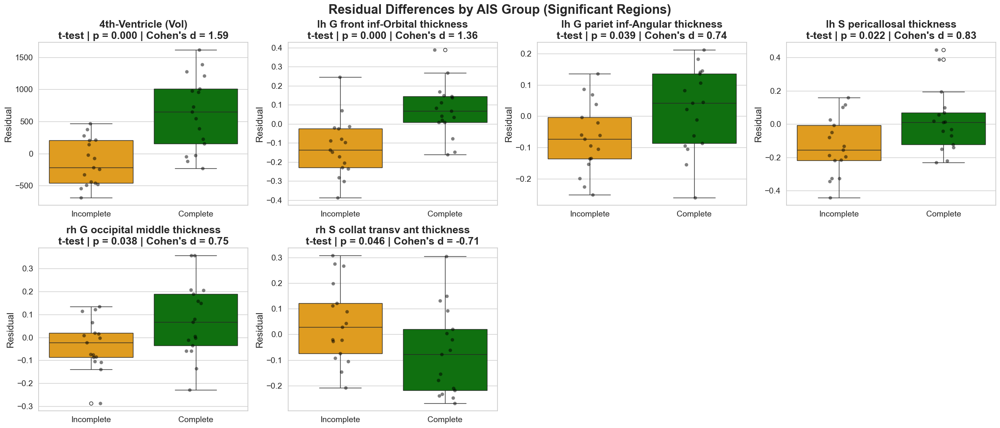

In [81]:

# 🔍 Nur signifikante Regionen (p < 0.05)
sig_results = df_results[df_results["p-value"] < 0.05].copy()

# Plot settings
n = len(sig_results)
n_cols = 4
n_rows = (n + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

# Farbschema für AIS-Gruppen
ais_colors = {"Complete": "green", "Incomplete": "orange"}

for i, (_, row) in enumerate(sig_results.iterrows()):
    region = row["Region"]
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci.columns:
        axes[i].set_visible(False)
        continue

    plot_data = df_sci[[residual_col, "AIS_Group"]].dropna()

    if plot_data.empty:
        axes[i].set_visible(False)
        continue

    ax = axes[i]
    sns.boxplot(
        data=plot_data,
        x="AIS_Group",
        y=residual_col,
        palette=ais_colors,
        ax=ax
    )
    sns.stripplot(
        data=plot_data,
        x="AIS_Group",
        y=residual_col,
        color="black",
        size=6,
        jitter=True,
        alpha=0.5,
        ax=ax
    )

    # Statistischer Untertitel
    title = (
        f"{region.replace('_', ' ')}\n"
        f"{row['Test']} | p = {row['p-value']:.3f} | "
        f"{row['Effect type']} = {row['Effect size']:.2f}"
    )
    ax.set_title(title, fontsize=18, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("Residual", fontsize=16)
    ax.tick_params(labelsize=14)

# Leere Plots ausblenden
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.suptitle("Residual Differences by AIS Group (Significant Regions)", fontsize=22, fontweight="bold", y=1.02)
plt.show()


### AIS level correlatiom

/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/4141480184.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/4141480184.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/4141480184.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/4141480184.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

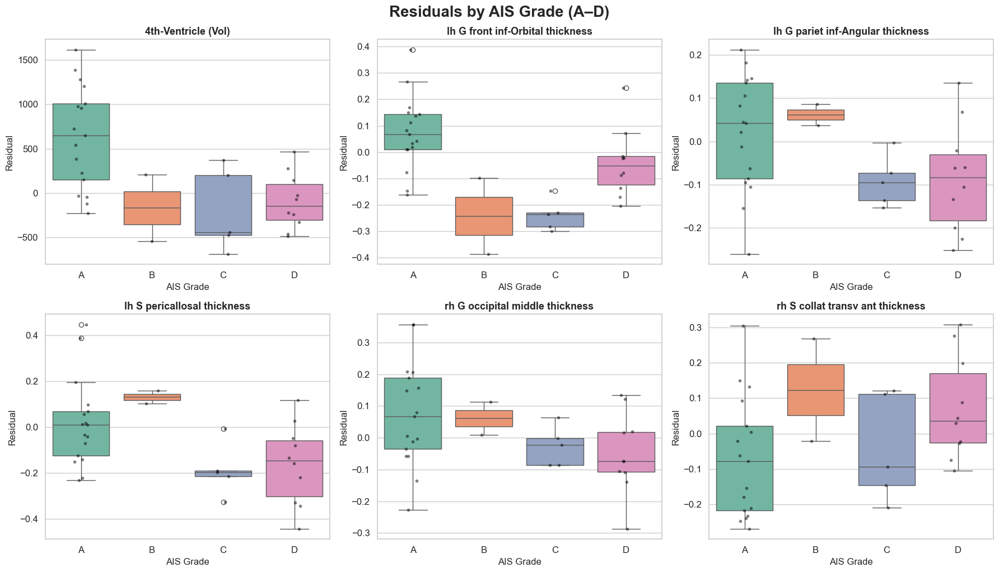

In [82]:

# Filter nur SCI mit AIS
df_sci = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])].copy()
df_sci = df_sci[df_sci["AIS"].notna()]

# AIS als kategorisch sortieren
df_sci["AIS"] = pd.Categorical(df_sci["AIS"], categories=["A", "B", "C", "D"], ordered=True)

# Auswahl signifikanter Regionen aus vorheriger Analyse
sig_regions = df_results[df_results["p-value"] < 0.05]["Region"].tolist()

# Plot Grid
n = len(sig_regions)
cols = 3
rows = (n + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.flatten()

for i, region in enumerate(sig_regions):
    residual_col = f"Residual_{region}"

    if residual_col not in df_sci.columns:
        continue

    ax = axes[i]
    plot_data = df_sci[[residual_col, "AIS"]].dropna()

    sns.boxplot(
        data=plot_data,
        x="AIS",
        y=residual_col,
        palette="Set2",
        ax=ax
    )
    sns.stripplot(
        data=plot_data,
        x="AIS",
        y=residual_col,
        color="black",
        size=4,
        alpha=0.5,
        ax=ax
    )

    ax.set_title(region.replace("_", " "), fontsize=13, fontweight="bold")
    ax.set_xlabel("AIS Grade", fontsize=12)
    ax.set_ylabel("Residual", fontsize=12)
    ax.tick_params(labelsize=12)

# Hide empty plots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Residuals by AIS Grade (A–D)", fontsize=20, fontweight="bold", y=1.02)
plt.show()

In [83]:

# Mapping AIS → ordinal numeric scale
ais_mapping = {"A": 1, "B": 2, "C": 3, "D": 4}

# Filter SCI + valid AIS
df_sci = df_combined[df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])].copy()
df_sci = df_sci[df_sci["AIS"].isin(ais_mapping.keys())].copy()
df_sci["AIS_numeric"] = df_sci["AIS"].map(ais_mapping)

# Loop über Residuals
results = []
for col in df_sci.columns:
    if col.startswith("Residual_"):
        data = df_sci[[col, "AIS_numeric"]].dropna()
        if len(data) >= 4:
            rho, p = spearmanr(data[col], data["AIS_numeric"])
            results.append({
                "Region": col.replace("Residual_", ""),
                "Spearman ρ": round(rho, 3),
                "p-value": round(p, 5),
                "n": len(data)
            })

# Ergebnis speichern
df_corr = pd.DataFrame(results).sort_values("p-value")
out_path = "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/Correlation_Residuals_AIS_Ordinal_Spearman.xlsx"
df_corr.to_excel(out_path, index=False)

print(f"✅ Correlation results saved to: {out_path}")

✅ Correlation results saved to: /Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Extraction Normative Values/Correlation_Residuals_AIS_Ordinal_Spearman.xlsx


✅ Found 7 significant regions


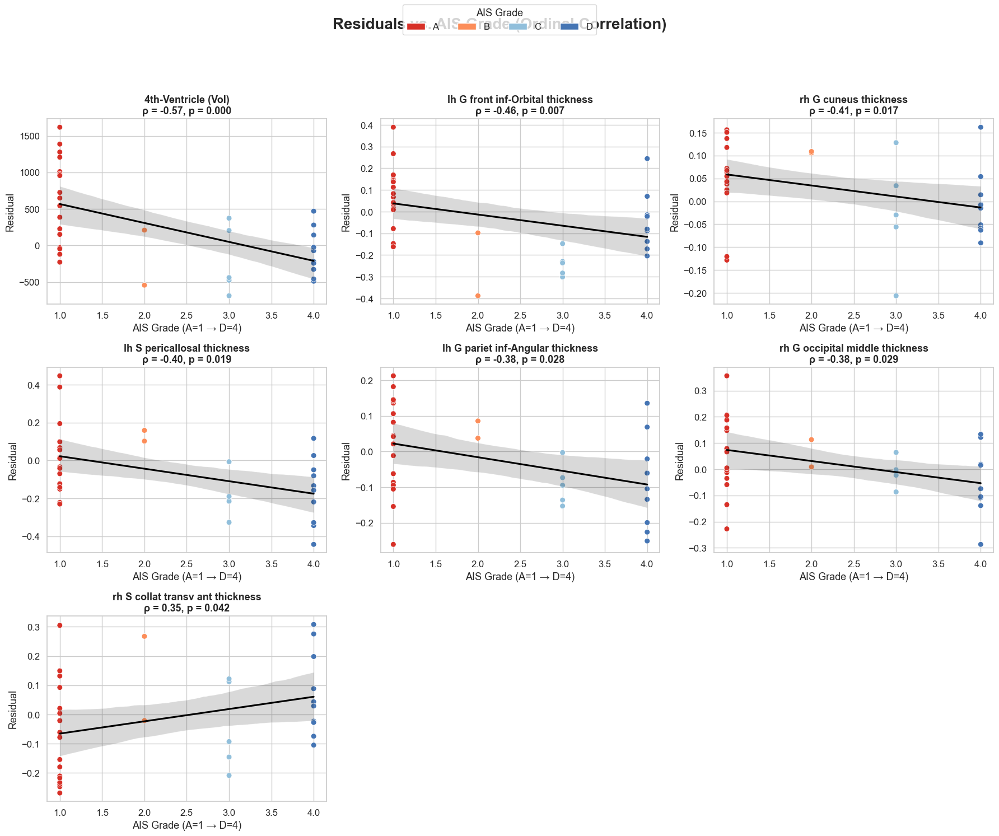

In [84]:

# 🔢 Mapping AIS → ordinal scale (für Plotfarbe & Achse)
ais_mapping = {"A": 1, "B": 2, "C": 3, "D": 4}
ais_colors = {"A": "#d73027", "B": "#fc8d59", "C": "#91bfdb", "D": "#4575b4"}

# 🔁 Nur signifikante Regionen (z.B. p < 0.05)
sig_regions = df_corr[df_corr["p-value"] < 0.05]["Region"].tolist()
print(f"✅ Found {len(sig_regions)} significant regions")

# 📊 Plot-Grid
n_cols = 3
n_rows = (len(sig_regions) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = axes.flatten()

# 📦 Filter Daten mit gültigem AIS
df_plot = df_combined[
    df_combined["AIS"].isin(ais_mapping.keys()) &
    df_combined["Cohort"].isin(["SCI_P", "SCI_nNP"])
].copy()
df_plot["AIS_numeric"] = df_plot["AIS"].map(ais_mapping)

# 🔁 Für jede signifikante Region plotten
for i, region in enumerate(sig_regions):
    residual_col = f"Residual_{region}"
    if residual_col not in df_plot.columns:
        continue

    ax = axes[i]
    plot_data = df_plot[[residual_col, "AIS", "AIS_numeric"]].dropna()

    # 📈 Scatterplot farblich nach AIS
    sns.scatterplot(
        data=plot_data,
        x="AIS_numeric",
        y=residual_col,
        hue="AIS",
        palette=ais_colors,
        s=50,
        ax=ax,
        legend=False
    )

    # 🔴 Regression (ordinal)
    sns.regplot(
        data=plot_data,
        x="AIS_numeric",
        y=residual_col,
        scatter=False,
        color="black",
        ax=ax
    )

    # 📊 Werte für Untertitel holen
    stats = df_corr[df_corr["Region"] == region]
    rho = stats["Spearman ρ"].values[0]
    p = stats["p-value"].values[0]

    # 🏷️ Titel & Achsen
    ax.set_title(f"{region.replace('_', ' ')}\nρ = {rho:.2f}, p = {p:.3f}", fontsize=13, fontweight="bold")
    ax.set_xlabel("AIS Grade (A=1 → D=4)", fontsize=13)
    ax.set_ylabel("Residual", fontsize=13)
    ax.tick_params(labelsize=12)

# 🧹 Unbenutzte Plots ausblenden
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# 🎨 Legende oben drüber
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor=color, label=grade) for grade, color in ais_colors.items()]
fig.legend(handles=legend_elements, title="AIS Grade", loc="upper center", ncol=4, fontsize=12, title_fontsize=13)

# 📐 Layout
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.suptitle("Residuals vs. AIS Grade (Ordinal Correlation)", fontsize=20, fontweight="bold", y=0.98)
plt.show()


In [85]:
## All regions together


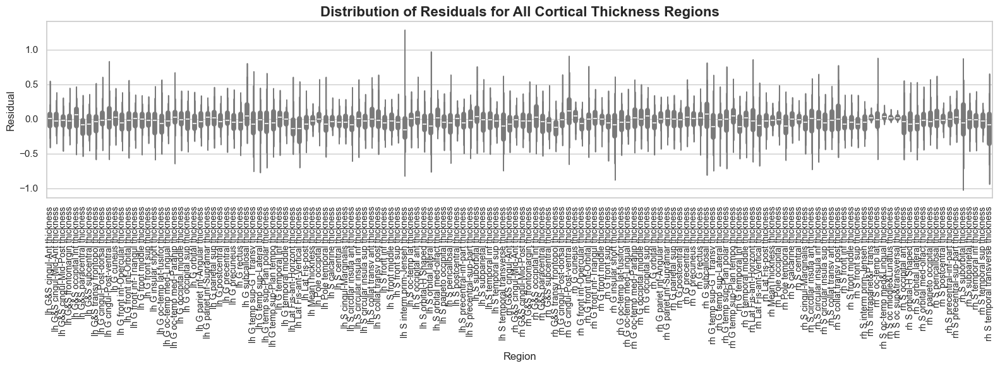

In [86]:

# 📦 Nur Residual-Spalten mit "thickness"
thickness_cols = [col for col in df_combined.columns if "Residual_" in col and "_thickness" in col]

# 🔄 Long-Form DataFrame: Region + Value
df_long = df_combined[thickness_cols].melt(var_name="Region", value_name="Residual")

# 🧹 Optional: Region schöner formatieren
df_long["Region"] = df_long["Region"].str.replace("Residual_", "").str.replace("_", " ")

# 📈 Verteilung plotten
plt.figure(figsize=(16, 6))
sns.violinplot(x="Region", y="Residual", data=df_long, inner="box", color="lightblue")
plt.xticks(rotation=90, fontsize=10)
plt.title("Distribution of Residuals for All Cortical Thickness Regions", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()


In [87]:
# Alle thickness-Residuals
thickness_cols = [col for col in df_combined.columns if col.startswith("Residual_") and "thickness" in col.lower()]
print(f"📊 Found {len(thickness_cols)} cortical thickness regions.")


📊 Found 144 cortical thickness regions.


📊 Found 144 cortical thickness regions.


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/3091962632.py:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_z["Thickness_ZScore"] = df_z[thickness_cols].mean(axis=1)
/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/3091962632.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


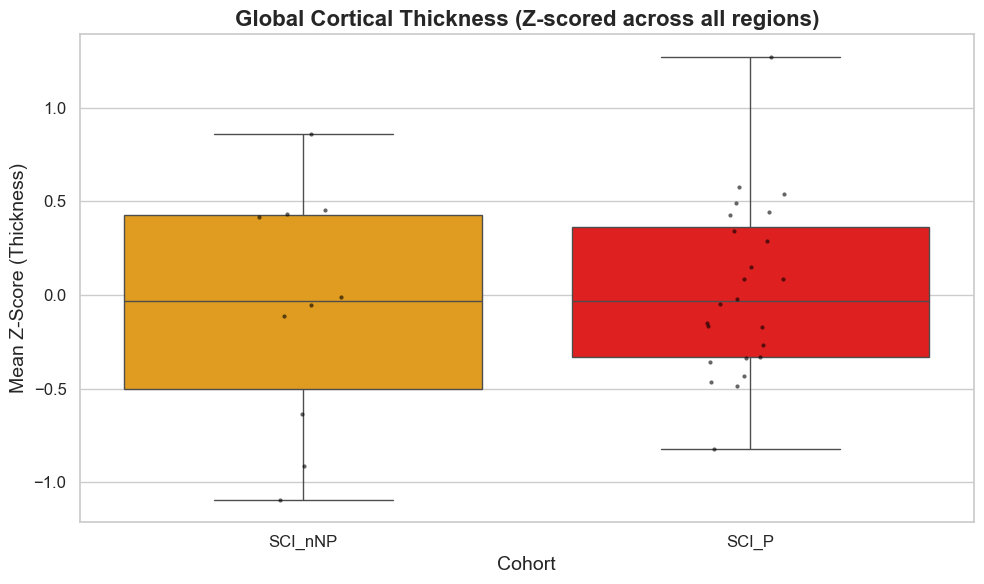

⚠️ Not enough data for all groups.


In [88]:

# --------------------------
# 1. Filter thickness regions
# --------------------------
thickness_cols = [col for col in df_combined.columns if col.startswith("Residual_") and "thickness" in col.lower()]
print(f"📊 Found {len(thickness_cols)} cortical thickness regions.")

# --------------------------
# 2. Z-scoring (per region)
# --------------------------
df_z = df_combined.copy()
df_z[thickness_cols] = df_z[thickness_cols].apply(lambda x: (x - x.mean()) / x.std(), axis=0)


# --------------------------
# 3. Mean z-score per subject
# --------------------------
df_z["Thickness_ZScore"] = df_z[thickness_cols].mean(axis=1)


# --------------------------
# 4. Plotting
# --------------------------
order = [ "SCI_nNP", "SCI_P"]  # gewünschte Reihenfolge

plt.figure(figsize=(10, 6))
sns.boxplot(
    data=df_z,
    x="Cohort",
    y="Thickness_ZScore",
    palette={ "SCI_nNP": "orange", "SCI_P": "red"},
    order=order
)
sns.stripplot(
    data=df_z,
    x="Cohort",
    y="Thickness_ZScore",
    color="black",
    size=3,
    alpha=0.6,
    jitter=True,
    order=order
)
plt.title("Global Cortical Thickness (Z-scored across all regions)", fontsize=16, fontweight="bold")
plt.ylabel("Mean Z-Score (Thickness)", fontsize=14)
plt.xlabel("Cohort", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()
group_data = [df_z[df_z["Cohort"] == g]["Thickness_ZScore"].dropna() for g in ["control", "SCI_P", "SCI_nNP"]]
if all(len(g) > 2 for g in group_data):
    stat, p = f_oneway(*group_data)
    print(f"📈 ANOVA result: F = {stat:.3f}, p = {p:.4f}")
else:
    print("⚠️ Not enough data for all groups.")

📦 Found 35 volume-related residual regions.


/var/folders/0c/h8k5bmz126n2yvg15dqbz8m80000gn/T/ipykernel_17351/309690034.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_z_vol, x="Cohort", y="Volume_ZScore",


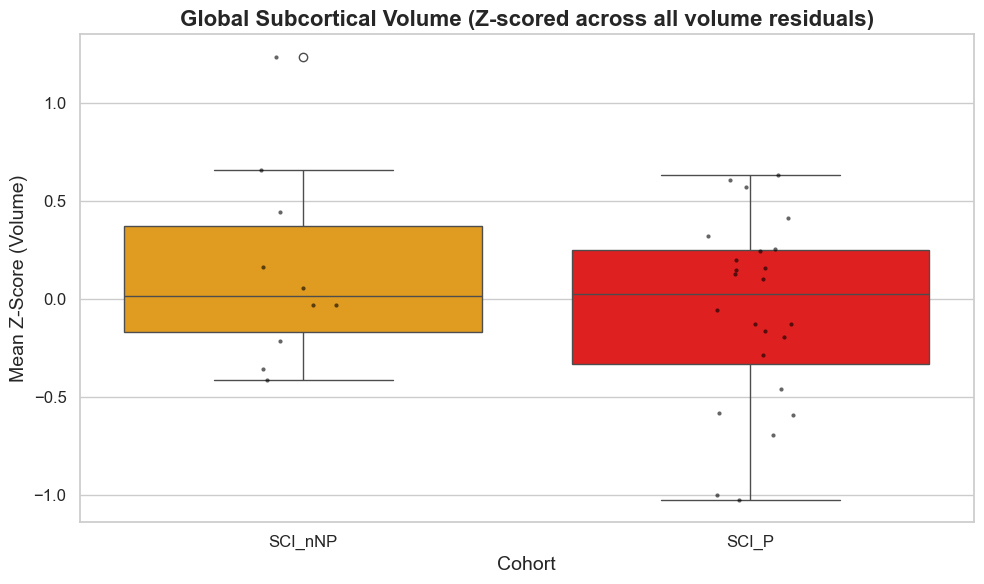

⚠️ Not enough data for all groups.


In [89]:
# --------------------------
# 1. Filter volume regions
# --------------------------
volume_cols = [col for col in df_combined.columns
               if col.startswith("Residual_") and
               "thickness" not in col.lower()]

print(f"📦 Found {len(volume_cols)} volume-related residual regions.")

# --------------------------
# 2. Z-Scoring
# --------------------------
df_z_vol = df_combined.copy()
df_z_vol[volume_cols] = df_z_vol[volume_cols].apply(lambda x: (x - x.mean()) / x.std(), axis=0)

# --------------------------
# 3. Global Volume Z-Score pro Person
# --------------------------
df_z_vol["Volume_ZScore"] = df_z_vol[volume_cols].mean(axis=1)

# --------------------------
# 4. Plot
# --------------------------
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_z_vol, x="Cohort", y="Volume_ZScore",
            order=[ "SCI_nNP", "SCI_P"],
            palette={ "SCI_nNP": "orange", "SCI_P": "red"})
sns.stripplot(data=df_z_vol, x="Cohort", y="Volume_ZScore",
              order=[ "SCI_nNP", "SCI_P"],
              color="black", size=3, alpha=0.6, jitter=True)
plt.title("Global Subcortical Volume (Z-scored across all volume residuals)", fontsize=16, fontweight="bold")
plt.ylabel("Mean Z-Score (Volume)", fontsize=14)
plt.xlabel("Cohort", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

# --------------------------
# 5. ANOVA Test
# --------------------------
group_data = [df_z_vol[df_z_vol["Cohort"] == g]["Volume_ZScore"].dropna() for g in ["control", "SCI_nNP", "SCI_P"]]
if all(len(g) > 2 for g in group_data):
    stat, p = f_oneway(*group_data)
    print(f"📈 ANOVA result: F = {stat:.3f}, p = {p:.4f}")
else:
    print("⚠️ Not enough data for all groups.")



In [90]:
residual_cols = [col for col in df_combined.columns if col.startswith("Residual_")]
print("📋 Alle Residual-Spalten:")
for col in residual_cols:
    print(col)


📋 Alle Residual-Spalten:
Residual_3rd-Ventricle (Vol)
Residual_4th-Ventricle (Vol)
Residual_Brain-Stem (Vol)
Residual_CSF (Vol)
Residual_EstimatedTotalIntraCranialVol (Vol)
Residual_Left-Accumbens-area (Vol)
Residual_Left-Amygdala (Vol)
Residual_Left-Caudate (Vol)
Residual_Left-Cerebellum-Cortex (Vol)
Residual_Left-Cerebellum-White-Matter (Vol)
Residual_Left-Hippocampus (Vol)
Residual_Left-Inf-Lat-Vent (Vol)
Residual_Left-Lateral-Ventricle (Vol)
Residual_Left-Pallidum (Vol)
Residual_Left-Putamen (Vol)
Residual_Left-VentralDC (Vol)
Residual_Left-choroid-plexus (Vol)
Residual_Left-vessel (Vol)
Residual_Right-Accumbens-area (Vol)
Residual_Right-Amygdala (Vol)
Residual_Right-Caudate (Vol)
Residual_Right-Cerebellum-Cortex (Vol)
Residual_Right-Cerebellum-White-Matter (Vol)
Residual_Right-Hippocampus (Vol)
Residual_Right-Inf-Lat-Vent (Vol)
Residual_Right-Lateral-Ventricle (Vol)
Residual_Right-Pallidum (Vol)
Residual_Right-Putamen (Vol)
Residual_Right-VentralDC (Vol)
Residual_Right-choroid-ple

In [91]:
'''# Lade die Excel-Datei
file_path =  "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaptation/Rescaled Values/Exctracted_Adjusted_Values.xlsx"
df = pd.read_excel(file_path)


# Stelle sicher, dass Cohort und Age korrekt sind
df["Cohort"] = df["Cohort"].astype(str).str.strip()
df["Age"] = pd.to_numeric(df["Age"], errors="coerce")

# Berechnung: Mittelwert und Standardabweichung für jede SCI-Gruppe
summary = df[df["Cohort"].isin(["SCI_P", "SCI_nNP"])].groupby("Cohort")["Age"].agg(["mean", "std", "count"]).round(2)

print(summary)
'''
# Lade die Excel-Datei
file_path =  "/Volumes/team/INANL/56_Valentina_Haas/brain_age_centilbrain/07_BrainCharts/Adaptation/Adaption_file_Controls.xlsx"
df = pd.read_excel(file_path)
# Stelle sicher, dass Cohort und Age korrekt sind
df["age"] = pd.to_numeric(df["age"], errors="coerce")

# Berechnung: Mittelwert und Standardabweichung für jede SCI-Gruppe
summary = df["age"].agg(["mean", "std", "count"]).round(2)

print(summary)

mean     44.69
std      13.57
count    58.00
Name: age, dtype: float64
